# Import libraries

In [2]:
from aquacrop import AquaCropModel, Soil, Crop, InitialWaterContent, GroundWater, IrrigationManagement
from aquacrop.utils import prepare_weather, get_filepath
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pathlib
from pathlib import Path
import geopandas as gpd
from sqlalchemy import create_engine
from sqlalchemy import inspect
import pyodbc

from owslib.wcs import WebCoverageService

import xarray as xr

import rasterio
from rasterio.plot import show

from matplotlib import pyplot

import numpy as np

import glob as glob

import rioxarray

from pathlib import Path

import elevation

import cdsapi
import zipfile
import rioxarray as rio 
from tqdm import tqdm
from datetime import datetime as dt
import datetime
import schedule
import netCDF4 as nc
from netCDF4 import Dataset
import os, sys
import copy
import platform
import tempfile
import logging
from math import log10, cos, sin, asin, sqrt, exp, pi, radians
from collections import namedtuple
from bisect import bisect_left
import textwrap
import sqlite3
from collections import Iterable
from osgeo import gdal

from altitudo import altitudo

import traceback

from datetime import date, timedelta

import json

from tqdm import tqdm

# Directories

In [21]:
HomeDir = '/home/c4ubuntu/projDir/SADC/'

In [3]:
DataDir = '/home/c4ubuntu/projDir/SADC/Data/'

# Functions

In [4]:
Celsius2Kelvin = lambda x: x + 273.16
hPa2kPa = lambda x: x/10.

# Saturated Vapour pressure [kPa] at temperature temp [C]
SatVapourPressure = lambda temp: 0.6108 * exp((17.27 * temp) / (237.3 + temp))

# Named tuple for returning results of ASTRO
astro_nt = namedtuple("AstroResults", "DAYL, DAYLP, SINLD, COSLD, DIFPP, "
                                      "ATMTR, DSINBE, ANGOT")
def astro(day, latitude, radiation, _cache={}):
    """python version of ASTRO routine by Daniel van Kraalingen.
    
    This subroutine calculates astronomic daylength, diurnal radiation
    characteristics such as the atmospheric transmission, diffuse radiation etc.
    :param day:         date/datetime object
    :param latitude:    latitude of location
    :param radiation:   daily global incoming radiation (J/m2/day)
    output is a `namedtuple` in the following order and tags::
        DAYL      Astronomical daylength (base = 0 degrees)     h      
        DAYLP     Astronomical daylength (base =-4 degrees)     h      
        SINLD     Seasonal offset of sine of solar height       -      
        COSLD     Amplitude of sine of solar height             -      
        DIFPP     Diffuse irradiation perpendicular to
                  direction of light                         J m-2 s-1 
        ATMTR     Daily atmospheric transmission                -      
        DSINBE    Daily total of effective solar height         s
        ANGOT     Angot radiation at top of atmosphere       J m-2 d-1
 
    Authors: Daniel van Kraalingen
    Date   : April 1991
 
    Python version
    Author      : Allard de Wit
    Date        : January 2011
    """

    # Check for range of latitude
    if abs(latitude) > 90.:
        msg = "Latitude not between -90 and 90"
        raise RuntimeError(msg)
    LAT = latitude
        
    # Determine day-of-year (IDAY) from day
    IDAY = doy(day)
    
    # reassign radiation
    AVRAD = radiation

    # Test if variables for given (day, latitude, radiation) were already calculated
    # in a previous run. If not (e.g. KeyError) calculate the variables, store
    # in cache and return the value.
    try:
        return _cache[(IDAY, LAT, AVRAD)]
    except KeyError:
        pass

    # constants
    RAD = radians(1.)
    ANGLE = -4.

    # Declination and solar constant for this day
    DEC = -asin(sin(23.45*RAD)*cos(2.*pi*(float(IDAY)+10.)/365.))
    SC  = 1370.*(1.+0.033*cos(2.*pi*float(IDAY)/365.))

    # calculation of daylength from intermediate variables
    # SINLD, COSLD and AOB
    SINLD = sin(RAD*LAT)*sin(DEC)
    COSLD = cos(RAD*LAT)*cos(DEC)
    AOB = SINLD/COSLD

    # For very high latitudes and days in summer and winter a limit is
    # inserted to avoid math errors when daylength reaches 24 hours in 
    # summer or 0 hours in winter.

    # Calculate solution for base=0 degrees
    if abs(AOB) <= 1.0:
        DAYL  = 12.0*(1.+2.*asin(AOB)/pi)
        # integrals of sine of solar height
        DSINB  = 3600.*(DAYL*SINLD+24.*COSLD*sqrt(1.-AOB**2)/pi)
        DSINBE = 3600.*(DAYL*(SINLD+0.4*(SINLD**2+COSLD**2*0.5))+
                 12.*COSLD*(2.+3.*0.4*SINLD)*sqrt(1.-AOB**2)/pi)
    else:
        if AOB >  1.0: DAYL = 24.0
        if AOB < -1.0: DAYL = 0.0
        # integrals of sine of solar height	
        DSINB = 3600.*(DAYL*SINLD)
        DSINBE = 3600.*(DAYL*(SINLD+0.4*(SINLD**2+COSLD**2*0.5)))

    # Calculate solution for base=-4 (ANGLE) degrees
    AOB_CORR = (-sin(ANGLE*RAD)+SINLD)/COSLD
    if abs(AOB_CORR) <= 1.0:
        DAYLP = 12.0*(1.+2.*asin(AOB_CORR)/pi)
    elif AOB_CORR > 1.0:
        DAYLP = 24.0
    elif AOB_CORR < -1.0:
        DAYLP = 0.0

    # extraterrestrial radiation and atmospheric transmission
    ANGOT = SC*DSINB
    # Check for DAYL=0 as in that case the angot radiation is 0 as well
    if DAYL > 0.0:
        ATMTR = AVRAD/ANGOT
    else:
        ATMTR = 0.

    # estimate fraction diffuse irradiation
    if (ATMTR > 0.75):
        FRDIF = 0.23
    elif (ATMTR <= 0.75) and (ATMTR > 0.35):
        FRDIF = 1.33-1.46*ATMTR
    elif (ATMTR <= 0.35) and (ATMTR > 0.07):
        FRDIF = 1.-2.3*(ATMTR-0.07)**2
    else:  # ATMTR <= 0.07
        FRDIF = 1.

    DIFPP = FRDIF*ATMTR*0.5*SC

    retvalue = astro_nt(DAYL, DAYLP, SINLD, COSLD, DIFPP, ATMTR, DSINBE, ANGOT)
    _cache[(IDAY, LAT, AVRAD)] = retvalue

    return retvalue

def doy(day):
    """Converts a date or datetime object to day-of-year (Jan 1st = doy 1)
    """
    # Check if day is a date or datetime object
    if isinstance(day, (datetime.date, datetime.datetime)):
        return day.timetuple().tm_yday
    else:
        msg = "Parameter day is not a date or datetime object."
        raise RuntimeError(msg)

def penman_monteith(DAY, LAT, ELEV, TMIN, TMAX, AVRAD, VAP, WIND2):
    """Calculates reference ET0 based on the Penman-Monteith model.
     This routine calculates the potential evapotranspiration rate from
     a reference crop canopy (ET0) in mm/d. For these calculations the
     analysis by FAO is followed as laid down in the FAO publication
     `Guidelines for computing crop water requirements - FAO Irrigation
     and drainage paper 56 <http://www.fao.org/docrep/X0490E/x0490e00.htm#Contents>`_
    Input variables::
        DAY   -  Python datetime.date object                   -
        LAT   -  Latitude of the site                        degrees
        ELEV  - Elevation above sea level                      m
        TMIN  - Minimum temperature                            C
        TMAX  - Maximum temperature                            C
        AVRAD - Daily shortwave radiation                   J m-2 d-1
        VAP   - 24 hour average vapour pressure               hPa
        WIND2 - 24 hour average windspeed at 2 meter          m/s
    Output is:
        ET0   - Penman-Monteith potential transpiration
                rate from a crop canopy                     [mm/d]
    """

    # psychrometric instrument constant (kPa/Celsius)
    PSYCON = 0.665
    # albedo and surface resistance [sec/m] for the reference crop canopy
    REFCFC = 0.23; CRES = 70.
    # latent heat of evaporation of water [J/kg == J/mm] and
    LHVAP = 2.45E6
    # Stefan Boltzmann constant (J/m2/d/K4, e.g multiplied by 24*60*60)
    STBC = 4.903E-3
    # Soil heat flux [J/m2/day] explicitly set to zero
    G = 0.

    # mean daily temperature (Celsius)
    TMPA = (TMIN+TMAX)/2.

    # Vapour pressure to kPa
    VAP = hPa2kPa(VAP)

    # atmospheric pressure at standard temperature of 293K (kPa)
    T = 293.0
    PATM = 101.3 * pow((T - (0.0065*ELEV))/T, 5.26)

    # psychrometric constant (kPa/Celsius)
    GAMMA = PSYCON * PATM * 1.0E-3

    # Derivative of SVAP with respect to mean temperature, i.e.
    # slope of the SVAP-temperature curve (kPa/Celsius);
    SVAP_TMPA = SatVapourPressure(TMPA)
    DELTA = (4098. * SVAP_TMPA)/pow((TMPA + 237.3), 2)

    # Daily average saturated vapour pressure [kPa] from min/max temperature
    SVAP_TMAX = SatVapourPressure(TMAX)
    SVAP_TMIN = SatVapourPressure(TMIN)
    SVAP = (SVAP_TMAX + SVAP_TMIN) / 2.

    # measured vapour pressure not to exceed saturated vapour pressure
    VAP = min(VAP, SVAP)

    # Longwave radiation according at Tmax, Tmin (J/m2/d)
    # and preliminary net outgoing long-wave radiation (J/m2/d)
    STB_TMAX = STBC * pow(Celsius2Kelvin(TMAX), 4)
    STB_TMIN = STBC * pow(Celsius2Kelvin(TMIN), 4)
    RNL_TMP = ((STB_TMAX + STB_TMIN) / 2.) * (0.34 - 0.14 * sqrt(VAP))

    # Clear Sky radiation [J/m2/DAY] from Angot TOA radiation
    # the latter is found through a call to astro()
    r = astro(DAY, LAT, AVRAD)
    CSKYRAD = (0.75 + (2e-05 * ELEV)) * r.ANGOT

    if CSKYRAD > 0:
        # Final net outgoing longwave radiation [J/m2/day]
        RNL = RNL_TMP * (1.35 * (AVRAD/CSKYRAD) - 0.35)

        # radiative evaporation equivalent for the reference surface
        # [mm/DAY]
        RN = ((1-REFCFC) * AVRAD - RNL)/LHVAP

        # aerodynamic evaporation equivalent [mm/day]
        EA = ((900./(TMPA + 273)) * WIND2 * (SVAP - VAP))

        # Modified psychometric constant (gamma*)[kPa/C]
        MGAMMA = GAMMA * (1. + (CRES/208.*WIND2))

        # Reference ET in mm/day
        ET0 = (DELTA * (RN-G))/(DELTA + MGAMMA) + (GAMMA * EA)/(DELTA + MGAMMA)
        ET0 = max(0., ET0)
    else:
        ET0 = 0.

    return ET0

In [5]:
def get_soil_name(lon, lat):
    Soils = {1:'SiltClay',2:'SandyClay',3:'ClayLoam',4:'SiltClayLoam',5:'SandyClayLoam',6:'Loam',7:'SandyLoam',8:'LoamySand',9:'Sand'}
    #Soil Class
    pnt_soil = gyga_soilclass.sel(x=lon,y=lat,  method="nearest")
    try:    
        pnt_class = int(pnt_soil.band_data.values)
        pnt_class_name = Soils.get(pnt_class)
    except:
        pnt_class_name = pnt_soil.band_data.values
    return(pnt_class_name)

In [6]:
def process_one_path(path):
    # use a context manager, to ensure the file gets closed after use
    with xr.open_dataset(path) as ds:
        ds.load()
        return ds

In [7]:
gyga_soilclass = xr.open_dataset(os.path.join(DataDir,'GIS/Soil/gyga_30cm_texclss_1km.tif'))
    
def get_soil_profile(lon, lat):
    Soils = {1:'SiltClay',2:'SandyClay',3:'ClayLoam',4:'SiltClayLoam',5:'SandyClayLoam',6:'Loam',7:'SandyLoam',8:'LoamySand',9:'Sand'}
    #Soil Class
    pnt_soil = gyga_soilclass.sel(x=lon,y=lat,  method="nearest")
    pnt_class = int(pnt_soil.band_data.values)
    pnt_class_name = Soils.get(pnt_class)
    # Custom Soil
    point_soil = Soil(soil_type=pnt_class_name, dz=[0.05]*2+[0.15]*2+[0.30]*2+[0.6]*2+[1.0]*2+[2.0]*2)
    
    depths = {'1':'0.5','2':'0.15','3':'0.30','4':'0.60','5':'1','6':'2'}
    
    for level in range(1,7):
        for var in ['SND','CLY']:
            filename = 'af_{}PPT_T__M_sd{}_250m_reprojected.tif'.format(var,level)
            if var == 'SND':
                sandtemp = process_one_path(os.path.join(DataDir,'GIS/Soil',filename))
                sandtemp = sandtemp.rio.write_crs(countries_adm.crs)
                sandtempval = sandtemp.sel(x=lon,y=lat,  method="nearest")
                sandtempdata = int(sandtempval.band_data.values)
               # sandtempdata = str(sandtempdata)
               # print(var, 'Level:',level, 'Value: ',sandtempdata)
            elif var == 'CLY':
                claytemp = process_one_path(os.path.join(DataDir,'GIS/Soil',filename))
                claytemp = claytemp.rio.write_crs(countries_adm.crs)
                claytempval = claytemp.sel(x=lon,y=lat,  method="nearest")
                claytempdata = int(claytempval.band_data.values)
               # claytempdata = str(claytempdata)
               # print(var, 'Level:',level, 'Value: ',claytempdata)
        dep = depths.get('{}'.format(level))
        dep = float(dep)
        point_soil.add_layer_from_texture(thickness=dep, Sand=sandtempdata, Clay=claytempdata,OrgMat=2.5,penetrability=100)
        
        return(point_soil)

In [8]:
def get_climate(lat, lon, climate):
    SiteFile = pd.DataFrame()
    Kelvin2Celsius = lambda x: x - 273.16
    dftmp = climate
    pnt = dftmp.sel(lat=lat,lon=lon,  method="nearest")
    df = pnt.to_dataframe()
    df = df.drop(columns={'lat','lon'})
    df.reset_index(inplace=True)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    
    SiteFile = df.rename(columns={'Wind_Speed_10m_Mean':'WIND2', 'Vapour_Pressure_Mean':'VAP',
                                        'Solar_Radiation_Flux':'AVRAD',
                                        'Precipitation_Flux':'Precipitation', 'Temperature_Air_2m_Max_24h':'MaxTemp',
                                        'Temperature_Air_2m_Min_24h':'MinTemp'})
    
    SiteFile['LAT'] = float(lat)
    SiteFile['ELEV'] = float(Elevation)
    SiteFile.index.names = ['Date']
    SiteFile[['MinTemp','MaxTemp']] = Kelvin2Celsius(SiteFile[['MinTemp','MaxTemp']])
    
    SiteFile = SiteFile.loc['1990':]
    
    SiteFile.reset_index(inplace=True)
    
    #print('Calculating Evapotranspiration')
    for idx, row in SiteFile.iterrows():
        SiteFile.loc[idx,'ReferenceET'] = penman_monteith(DAY=row['Date'], LAT=row['LAT'], 
                    ELEV=row['ELEV'],TMIN=row['MinTemp'],
                    TMAX=row['MaxTemp'],AVRAD=row['AVRAD'],
                    VAP=row['VAP'],WIND2=row['WIND2'])
    
    SiteFile = SiteFile[["MinTemp","MaxTemp","Precipitation","ReferenceET","Date"]]
    return(SiteFile)

In [9]:
def get_plantdate_month(lat, lon, crop, irr_stat, weatherfile):
    calendar = xr.open_dataset(os.path.join(DataDir,'Crop/Crop_Calendar/{}_{}_ggcmi_crop_calendar_phase3_v1.01.nc4').format(crop, irr_stat))
    pnt_date = calendar.sel(lon=lon,lat=lat,  method="nearest")
    pnt_date = pnt_date.planting_day.values
    sdate = weatherfile.Date.dt.year.unique()[0]
    strt_date = date(int(sdate), 1, 1)
    plant_date = strt_date + timedelta(days=int(pnt_date) - 1)
    plant_date = plant_date.strftime("%m-%d")
    return(plant_date)

In [10]:
def get_plantcalendardate(lat, lon, crop, irr_stat, weatherfile):
    calendar = xr.open_dataset(os.path.join(DataDir,'Crop/Crop_Calendar/{}_{}_ggcmi_crop_calendar_phase3_v1.01.nc4').format(crop, irr_stat))
    pnt_date = calendar.sel(lon=lon,lat=lat,  method="nearest")
    pnt_date = pnt_date.planting_day.values
    sdate = weatherfile.Date.dt.year.unique()[0]
    strt_date = date(int(sdate), 1, 1)
    plant_date = strt_date + timedelta(days=int(pnt_date) - 1)
    plant_date = plant_date.strftime("%d-%m-%Y")
    return(plant_date)

In [11]:
def aggregate_yields(output_dir):
    out_files = glob.glob(os.path.join(DataDir,output_dir,'*.csv'))
    country_yield = pd.DataFrame()
    for file in out_files:
        dftmp = pd.read_csv(file, index_col=3)
        dftmp = dftmp[['crop Type',
           'Yield (tonne/ha)', 'Lat', 'Lon',
           'Watershed_No', 'Scenario']]
        if len(country_yield) == 0:
            country_yield = dftmp
        else:
            country_yield = pd.concat([country_yield, dftmp])
            
    country_yield.reset_index(inplace=True)
    country_yield.Lat = country_yield.Lat.astype(float)
    country_yield.Lon = country_yield.Lon.astype(float)
    country_yield.set_index(['Harvest Date (YYYY/MM/DD)','Lat','Lon','Watershed_No', 'Scenario','crop Type'], inplace=True)
    ds = country_yield.to_xarray()
    ds = ds.rename({'Harvest Date (YYYY/MM/DD)':'Year','Yield (tonne/ha)':'Yield (t/ha)'})
    return(ds)

In [12]:
def get_plantingdates(lat, lon, weatherfile, cropname):
    planting_dates = {}
    for year in weatherfile.Date.dt.year.unique():
        if year != 2022:
            year_clim = weatherfile.set_index('Date').loc['{}'.format(year)]
            year_clim.reset_index(inplace=True)
            plant_date = get_plantcalendardate(lat=lat, lon=lon, crop=cropname, irr_stat=irr_status, weatherfile=year_clim)
            start_window = pd.to_datetime(plant_date, infer_datetime_format=True)-pd.DateOffset(90)
            end_window = pd.to_datetime(plant_date, infer_datetime_format=True)+pd.DateOffset(90)
            window_clim_01 = year_clim.set_index('Date').resample('7D').sum()
            window_clim_02 = year_clim.set_index('Date').resample('14D').sum()
            arex_01 = window_clim_01[start_window:end_window].loc[window_clim_01['Precipitation']>25]
            arex_02 = window_clim_02[start_window:end_window].loc[window_clim_02['Precipitation']>40]
            arex = [i for i in arex_01.index if i in arex_02.index]
            if len(arex) > 0:
                arex = arex[0]+pd.DateOffset(7)
            else:
                try:
                    arex = arex_01.index[0]
                except:
                    arex = pd.to_datetime(plant_date, infer_datetime_format=True)
            planting_dates[year] = arex.strftime("%m/%d")
    return(planting_dates)

In [13]:
def run_aquacrop(country, scenario, wshed, start_sim, end_sim, weatherfile, soil, crop, initial_water, irrigation):
    model = AquaCropModel(sim_start_time=f'{start_sim}',
                                  sim_end_time=f'{end_sim}',
                                  weather_df=weatherfile,
                                  soil=soil,
                                  crop=crop,
                                  initial_water_content=initial_water,
                                  irrigation_management=irrigation)               
    try:
        model.run_model(till_termination=True)
        print('Model ran for ', lat, lon, year)
        out = model._outputs.final_stats
        out['Lat'] = lat
        out['Lon'] = lon
        out['Watershed_No'] = wshed
        scene = str(scenario.get('Name'))
        out['Scenario'] = scene
        out['Country'] = country
        out['Year'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
    except:
        traceback_output = traceback.format_exc()
        print('Model didnt run for:', lat,lon,'Error:', traceback_output)
    return(out)

In [14]:
def get_startdate(year):
    try:
        start_sim = str(year) + '-' + planting_dates.get(year)
        start_sim = pd.to_datetime(start_sim)
        start_sim = start_sim - pd.DateOffset(90)
        start_sim = start_sim.strftime('%Y/%m/%d')
    except:
        print('No planting date: ', year, planting_dates.get(year))
    return(start_sim)

In [15]:
def get_enddate(year):
    try:
        end_sim = str(year) + '-' + planting_dates.get(year)
        end_sim = pd.to_datetime(end_sim)
        end_sim = end_sim + pd.DateOffset(365)
        end_sim = end_sim.strftime('%Y/%m/%d')
    except:
        print('No planting date: ', year, planting_dates.get(year))
    return(end_sim)

## Run Aquacrop

### With soil profile

In [38]:
def get_soil_profile(lon, lat, row):
    #Soil Class
    pnt_class_name = row.get('SoilName')
    # Readily Evaporable Water
    readiliy_ew = {'SiltClay':12,'SandyClay':9,'ClayLoam':9,'SiltClayLoam':11,'SandyClayLoam':9,'Loam':10,'SandyLoam':9,'LoamySand':9,'Sand':6}
    point_rew = readiliy_ew.get(pnt_class_name)
    # Custom Soil
    point_soil = Soil(soil_type='custom', dz=[0.05]*2+[0.15]*2+[0.30]*2+[0.6]*2+[1.0]*2+[2.0]*2,adj_rew=1, rew=point_rew)
    
    depths = {'1':'0.5','2':'0.15','3':'0.30','4':'0.60','5':'1','6':'2'}
    
    for level in range(1,7):
        for var in ['SND','CLY']:
            if var == 'SND':
                sandtempdata = int(row.get('SND')[level])
               # sandtempdata = str(sandtempdata)
               # print(var, 'Level:',level, 'Value: ',sandtempdata)
            elif var == 'CLY':
                claytempdata = int(row.get('CLY')[level])
               # claytempdata = str(claytempdata)
               # print(var, 'Level:',level, 'Value: ',claytempdata)
        dep = depths.get('{}'.format(level))
        dep = float(dep)
        #point_soil.add_layer(thickness=dep,thWP=0.24,thFC=0.40,thS=0.50,Ksat=155,penetrability=50)
        point_soil.add_layer_from_texture(thickness=dep, Sand=sandtempdata, Clay=claytempdata, OrgMat=2.5, penetrability=50)
        return(point_soil)

In [33]:
with open(os.path.join(HomeDir,'countries_points_soils_dict.json')) as json_file:
    countries_points_dict = json.load(json_file)

In [34]:
for i in range(len(countries_points_dict)):
    if countries_points_dict[i]['SoilName'] == None:
        del countries_points_dict[i]
    elif countries_points_dict[i]['Elev'] == None:
        del countries_points_dict[i]
        continue
    elif countries_points_dict[i]['RZD'] == None:
        del countries_points_dict[i]
        continue

In [35]:
len(countries_points_dict)

3130

In [39]:
Scenario =  [{'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'}]

Yields = pd.DataFrame()

CropGrowth = pd.DataFrame()

WaterStorage = pd.DataFrame()

WaterFlux = pd.DataFrame()

for row in tqdm(countries_points_dict):
    lon = "{:.2f}".format(float(row.get('lon')))
    lat = "{:.2f}".format(float(row.get('lat')))
    # Country
    country = row.get('ADMIN')
    if country == 'eSwatini':
        # Elevation
        Elevation = row.get('Elev')
        # Soil
        point_soil_name = row.get('SoilName')
        try:
            point_soil = get_soil_profile(lat=lat, lon=lon, row=row)
            #print(point_soil.profile)
        except:
            traceback_output = traceback.format_exc()
            print('Soil profile didnt work', traceback_output)
            point_soil = Soil(soil_type=point_soil_name)

       
        # Root Zone Depth
        pnt_rootzoneD = row.get('RZD')

        # Climate
        clim_filename = os.path.join(DataDir,'Climate/4_sitefiles/','{}_{}_{}.csv'.format(country,lat,lon))

        if len(glob.glob(clim_filename)) == 0:
            SiteFile = get_climate(lat=lat, lon=lon,climate=climdat)
            SiteFile.to_csv(clim_filename)
        else:
            SiteFile = pd.read_csv(clim_filename,parse_dates=['Date'])
            SiteFile.drop(SiteFile.columns[[0]], axis=1, inplace=True)


        # Run scenarios for a specific grid point
        for scenario in Scenario:
        # Scenario
            scene = str(scenario.get('Name'))
        # Cropname and Irrigation
            cropname = scenario.get('Crop')
            irr_status = scenario.get('Irrigation')           
        # Planting date
            planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile, cropname=cropname)
        # Initial water
            InitWC = InitialWaterContent(value=['FC'])
        # Irrigation
            irr_num = scenario.get('IrrNum')
            soilmt = scenario.get('SMT')       
            if soilmt is None:
                net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
            else:
                net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))

            # Run model for each year    
            for year in SiteFile.Date.dt.year.unique():
                if ((year > SiteFile.Date.dt.year.min())) and ((year < SiteFile.Date.dt.year.max())):
            # Crop
                    if cropname == 'Maize':
                        crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                    else:
                        crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
            # Start and end Date
                    end_year = year + 1
                    start_sim = get_startdate(year=year)
                    end_sim = get_enddate(year=year)
                    PointFile = SiteFile.loc[(SiteFile['Date'].dt.year>=year)&(SiteFile['Date'].dt.year<=end_year)]
            # Run Aquacrop
                    model = AquaCropModel(sim_start_time=f'{year}/{planting_dates.get(year)}',
                                      sim_end_time=f'{end_year}/{planting_dates.get(year)}',
                                      weather_df=PointFile,
                                      soil=point_soil, 
                                      crop=crop_sim,
                                      initial_water_content=InitWC,
                                      irrigation_management=net_irrigation)

                    try:
                        model.run_model(till_termination=True)
                        out = model._outputs.final_stats
                        
                        water_flux = model._outputs.water_flux
                        water_flux['year'] = year
                        water_flux['Lat'] = lat
                        water_flux['Lon'] = lon
                        water_flux['N_ID'] = lat+lon
                        
                        water_store = model._outputs.water_storage
                        water_store['year'] = year
                        water_store['Lat'] = lat
                        water_store['Lon'] = lon
                        water_store['N_ID'] = lat+lon
                        
                        
                        crop_growth = model._outputs.crop_growth
                        crop_growth['year'] = year
                        crop_growth['Lat'] = lat
                        crop_growth['Lon'] = lon
                        crop_growth['N_ID'] = lat+lon
                        
                        out['Lat'] = lat
                        out['Lon'] = lon
                        out['Scenario'] = scene
                        out['Country'] = country
                        out['N_ID'] = lat+lon
                        out['plant_date'] = '{}/{}'.format(year,planting_dates.get(year))
                        
                        if len(WaterFlux) == 0:
                            WaterFlux = water_flux
                        else:
                            WaterFlux = pd.concat([WaterFlux, water_flux], axis=0)

                        if len(WaterStorage) == 0:
                            WaterStorage = water_store
                        else:
                            WaterStorage = pd.concat([WaterStorage, water_store], axis=0)


                        if len(CropGrowth) == 0:
                            CropGrowth = crop_growth
                        else:
                            CropGrowth = pd.concat([CropGrowth, crop_growth], axis=0)

                        if len(Yields) == 0:
                            Yields = out
                        else:
                            Yields = pd.concat([Yields, out], axis=0)

                    except:
                            traceback_output = traceback.format_exc()
                            #print('Model didnt run for:', lat,lon, traceback_output,'plant', 
                                 # f'{year}/{planting_dates.get(year)}', 'end', end_sim)
                            print('Model didnt run for:', lat,lon,year)
                    
                    

  0%|                                                                                                                               | 0/3130 [00:00<?, ?it/s]

Soil profile didnt work Traceback (most recent call last):
  File "/tmp/ipykernel_5186/4026770947.py", line 22, in <cell line: 11>
    point_soil = get_soil_profile(lat=lat, lon=lon, row=row)
  File "/tmp/ipykernel_5186/1744312756.py", line 15, in get_soil_profile
    sandtempdata = int(row.get('SND')[level])
ValueError: cannot convert float NaN to integer



 64%|██████████████████████████████████████████████████████████████████████████                                          | 1999/3130 [00:52<01:12, 15.67it/s]

Model didnt run for: -26.05 31.65 2016


 64%|██████████████████████████████████████████████████████████████████████████▌                                         | 2011/3130 [01:21<03:37,  5.16it/s]

Model didnt run for: -26.05 31.85 2016


 65%|███████████████████████████████████████████████████████████████████████████                                         | 2026/3130 [01:54<13:24,  1.37it/s]

Model didnt run for: -26.05 32.05 1991
Model didnt run for: -26.05 32.05 1993
Model didnt run for: -26.05 32.05 1994
Model didnt run for: -26.05 32.05 1995
Model didnt run for: -26.05 32.05 1997
Model didnt run for: -26.05 32.05 1998
Model didnt run for: -26.05 32.05 1999
Model didnt run for: -26.05 32.05 2001
Model didnt run for: -26.05 32.05 2002
Model didnt run for: -26.05 32.05 2003
Model didnt run for: -26.05 32.05 2005
Model didnt run for: -26.05 32.05 2006
Model didnt run for: -26.05 32.05 2007
Model didnt run for: -26.05 32.05 2009
Model didnt run for: -26.05 32.05 2010
Model didnt run for: -26.05 32.05 2011
Model didnt run for: -26.05 32.05 2013
Model didnt run for: -26.05 32.05 2014
Model didnt run for: -26.05 32.05 2015
Model didnt run for: -26.05 32.05 2017
Model didnt run for: -26.05 32.05 2018
Model didnt run for: -26.05 32.05 2019


 65%|███████████████████████████████████████████████████████████████████████████▌                                        | 2039/3130 [01:58<10:37,  1.71it/s]

Model didnt run for: -26.05 32.05 2021
Model didnt run for: -26.45 32.05 1991
Model didnt run for: -26.45 32.05 1993
Model didnt run for: -26.45 32.05 1994
Model didnt run for: -26.45 32.05 1995
Model didnt run for: -26.45 32.05 1997
Model didnt run for: -26.45 32.05 1998
Model didnt run for: -26.45 32.05 1999
Model didnt run for: -26.45 32.05 2001
Model didnt run for: -26.45 32.05 2002
Model didnt run for: -26.45 32.05 2003
Model didnt run for: -26.45 32.05 2005
Model didnt run for: -26.45 32.05 2006
Model didnt run for: -26.45 32.05 2007
Model didnt run for: -26.45 32.05 2009
Model didnt run for: -26.45 32.05 2010
Model didnt run for: -26.45 32.05 2011
Model didnt run for: -26.45 32.05 2013
Model didnt run for: -26.45 32.05 2014
Model didnt run for: -26.45 32.05 2015
Model didnt run for: -26.45 32.05 2017
Model didnt run for: -26.45 32.05 2018
Model didnt run for: -26.45 32.05 2019
Model didnt run for: -26.45 32.05 2021
Model didnt run for: -26.65 32.05 1991
Model didnt run for: -26.

 65%|███████████████████████████████████████████████████████████████████████████▋                                        | 2041/3130 [02:06<14:30,  1.25it/s]

Model didnt run for: -26.65 32.05 2021


 71%|██████████████████████████████████████████████████████████████████████████████████▏                                 | 2219/3130 [02:49<08:39,  1.75it/s]

Model didnt run for: -25.85 31.25 2016


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3130/3130 [03:03<00:00, 17.05it/s]


In [40]:
country = 'eSwatini'
crop = 'Maize_50Pen'


WaterFlux.to_csv(os.path.join(DataDir,'Output/CSVs/Calibration','{}_Baseline_Phase1_WaterFlux_{}_{}.csv'.format(country,crop,str(dt.now()))))
WaterStorage.to_csv(os.path.join(DataDir,'Output/CSVs/Calibration','{}_Baseline_Phase1_WaterStorage_{}_{}.csv'.format(country,crop,str(dt.now()))))
CropGrowth.to_csv(os.path.join(DataDir,'Output/CSVs/Calibration','{}_Baseline_Phase1_CropGrowth_{}_{}.csv'.format(country,crop,str(dt.now()))))
Yields.to_csv(os.path.join(DataDir,'Output/CSVs/Calibration','{}_Baseline_Phase1_Yields_{}_{}.csv'.format(country,crop,str(dt.now()))))      

In [121]:
Scenario =  [{'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'}]

Yields = pd.DataFrame()

CropGrowth = pd.DataFrame()

WaterStorage = pd.DataFrame()

WaterFlux = pd.DataFrame()

for row in tqdm(countries_points_dict):
    lon = "{:.2f}".format(float(row.get('lon')))
    lat = "{:.2f}".format(float(row.get('lat')))
    # Country
    country = row.get('ADMIN')
    if country == 'eSwatini':
        # Elevation
        Elevation = row.get('Elev')
        # Soil
        point_soil_name = row.get('SoilName')
        try:
            point_soil = get_soil_profile(lat=lat, lon=lon, row=row)
            #print(point_soil.profile)
        except:
            traceback_output = traceback.format_exc()
            print('Soil profile didnt work', traceback_output)
            point_soil = Soil(soil_type=point_soil_name)

       
        # Root Zone Depth
        pnt_rootzoneD = row.get('RZD')

        # Climate
        clim_filename = os.path.join('projDir/SADC/Data/Climate/4_sitefiles/','{}_{}_{}.csv'.format(country,lat,lon))

        if len(glob.glob(clim_filename)) == 0:
            SiteFile = get_climate(lat=lat, lon=lon,climate=climdat)
            SiteFile.to_csv(clim_filename)
        else:
            SiteFile = pd.read_csv(clim_filename,parse_dates=['Date'])
            SiteFile.drop(SiteFile.columns[[0]], axis=1, inplace=True)


        # Run scenarios for a specific grid point
        for scenario in Scenario:
        # Scenario
            scene = str(scenario.get('Name'))
        # Cropname and Irrigation
            cropname = scenario.get('Crop')
            irr_status = scenario.get('Irrigation')           
        # Planting date
            planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile, cropname=cropname)
        # Initial water
            InitWC = InitialWaterContent(value=['FC'])
        # Irrigation
            irr_num = scenario.get('IrrNum')
            soilmt = scenario.get('SMT')       
            if soilmt is None:
                net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
            else:
                net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))

            # Run model for each year    
            for year in SiteFile.Date.dt.year.unique():
                if ((year > SiteFile.Date.dt.year.min())) and ((year < SiteFile.Date.dt.year.max())):
            # Crop
                    if cropname == 'Maize':
                        crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                    else:
                        crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
            # Start and end Date
                    end_year = year + 1
                    start_sim = get_startdate(year=year)
                    end_sim = get_enddate(year=year)
                    PointFile = SiteFile.loc[(SiteFile['Date'].dt.year>=year)&(SiteFile['Date'].dt.year<=end_year)]
            # Run Aquacrop
                    model = AquaCropModel(sim_start_time=f'{year}/{planting_dates.get(year)}',
                                      sim_end_time=f'{end_year}/{planting_dates.get(year)}',
                                      weather_df=PointFile,
                                      soil=point_soil, 
                                      crop=crop_sim,
                                      initial_water_content=InitWC,
                                      irrigation_management=net_irrigation)

                    try:
                        model.run_model(till_termination=True)
                        out = model._outputs.final_stats
                        
                        water_flux = model._outputs.water_flux
                        water_flux['year'] = year
                        water_flux['Lat'] = lat
                        water_flux['Lon'] = lon
                        water_flux['N_ID'] = lat+lon
                        
                        water_store = model._outputs.water_storage
                        water_store['year'] = year
                        water_store['Lat'] = lat
                        water_store['Lon'] = lon
                        water_store['N_ID'] = lat+lon
                        
                        
                        crop_growth = model._outputs.crop_growth
                        crop_growth['year'] = year
                        crop_growth['Lat'] = lat
                        crop_growth['Lon'] = lon
                        crop_growth['N_ID'] = lat+lon
                        
                        out['Lat'] = lat
                        out['Lon'] = lon
                        out['Scenario'] = scene
                        out['Country'] = country
                        out['N_ID'] = lat+lon
                        out['plant_date'] = '{}/{}'.format(year,planting_dates.get(year))  

                    except:
                            traceback_output = traceback.format_exc()
                            #print('Model didnt run for:', lat,lon, traceback_output,'plant', 
                                 # f'{year}/{planting_dates.get(year)}', 'end', end_sim)
                            print('Model didnt run for:', lat,lon,year)
                    
                    if len(WaterFlux) == 0:
                        WaterFlux = water_flux
                    else:
                        WaterFlux = pd.concat([WaterFlux, water_flux], axis=0)
                    
                    if len(WaterStorage) == 0:
                        WaterStorage = water_store
                    else:
                        WaterStorage = pd.concat([WaterStorage, water_store], axis=0)
                        
                    
                    if len(CropGrowth) == 0:
                        CropGrowth = crop_growth
                    else:
                        CropGrowth = pd.concat([CropGrowth, crop_growth], axis=0)
                            
                    if len(Yields) == 0:
                        Yields = out
                    else:
                        Yields = pd.concat([Yields, out], axis=0)

 ... (more hidden) ...

Soil profile didnt work Traceback (most recent call last):
  File "/tmp/ipykernel_4608/439301266.py", line 22, in <cell line: 11>
    point_soil = get_soil_profile(lat=lat, lon=lon, row=row)
  File "/tmp/ipykernel_4608/1744312756.py", line 15, in get_soil_profile
    sandtempdata = int(row.get('SND')[level])
ValueError: cannot convert float NaN to integer



 ... (more hidden) ...

Model didnt run for: -26.05 31.65 2016


 ... (more hidden) ...

Model didnt run for: -26.05 31.85 2016


 ... (more hidden) ...

Model didnt run for: -26.05 32.05 1991
Model didnt run for: -26.05 32.05 1993
Model didnt run for: -26.05 32.05 1994
Model didnt run for: -26.05 32.05 1995
Model didnt run for: -26.05 32.05 1997
Model didnt run for: -26.05 32.05 1998
Model didnt run for: -26.05 32.05 1999
Model didnt run for: -26.05 32.05 2001
Model didnt run for: -26.05 32.05 2002
Model didnt run for: -26.05 32.05 2003
Model didnt run for: -26.05 32.05 2005
Model didnt run for: -26.05 32.05 2006
Model didnt run for: -26.05 32.05 2007
Model didnt run for: -26.05 32.05 2009
Model didnt run for: -26.05 32.05 2010
Model didnt run for: -26.05 32.05 2011
Model didnt run for: -26.05 32.05 2013
Model didnt run for: -26.05 32.05 2014
Model didnt run for: -26.05 32.05 2015
Model didnt run for: -26.05 32.05 2017
Model didnt run for: -26.05 32.05 2018
Model didnt run for: -26.05 32.05 2019


 ... (more hidden) ...

Model didnt run for: -26.05 32.05 2021
Model didnt run for: -26.45 32.05 1991
Model didnt run for: -26.45 32.05 1993
Model didnt run for: -26.45 32.05 1994
Model didnt run for: -26.45 32.05 1995
Model didnt run for: -26.45 32.05 1997
Model didnt run for: -26.45 32.05 1998
Model didnt run for: -26.45 32.05 1999
Model didnt run for: -26.45 32.05 2001
Model didnt run for: -26.45 32.05 2002
Model didnt run for: -26.45 32.05 2003
Model didnt run for: -26.45 32.05 2005
Model didnt run for: -26.45 32.05 2006
Model didnt run for: -26.45 32.05 2007
Model didnt run for: -26.45 32.05 2009
Model didnt run for: -26.45 32.05 2010
Model didnt run for: -26.45 32.05 2011
Model didnt run for: -26.45 32.05 2013
Model didnt run for: -26.45 32.05 2014
Model didnt run for: -26.45 32.05 2015
Model didnt run for: -26.45 32.05 2017
Model didnt run for: -26.45 32.05 2018
Model didnt run for: -26.45 32.05 2019


 ... (more hidden) ...

Model didnt run for: -26.45 32.05 2021
Model didnt run for: -26.65 32.05 1991
Model didnt run for: -26.65 32.05 1993
Model didnt run for: -26.65 32.05 1994
Model didnt run for: -26.65 32.05 1995
Model didnt run for: -26.65 32.05 1997
Model didnt run for: -26.65 32.05 1998
Model didnt run for: -26.65 32.05 1999
Model didnt run for: -26.65 32.05 2001
Model didnt run for: -26.65 32.05 2002
Model didnt run for: -26.65 32.05 2003
Model didnt run for: -26.65 32.05 2005
Model didnt run for: -26.65 32.05 2006
Model didnt run for: -26.65 32.05 2007
Model didnt run for: -26.65 32.05 2009
Model didnt run for: -26.65 32.05 2010
Model didnt run for: -26.65 32.05 2011
Model didnt run for: -26.65 32.05 2013
Model didnt run for: -26.65 32.05 2014
Model didnt run for: -26.65 32.05 2015
Model didnt run for: -26.65 32.05 2017
Model didnt run for: -26.65 32.05 2018
Model didnt run for: -26.65 32.05 2019


 ... (more hidden) ...

Model didnt run for: -26.65 32.05 2021


 ... (more hidden) ...

Model didnt run for: -25.85 31.25 2016


 ... (more hidden) ...


In [124]:
point_soil.profile

,Comp,Layer,dz,dzsum,zBot,z_top,zMid,th_dry,th_wp,th_fc,th_s,Ksat,penetrability,tau,th_fc_Adj
0,0,1,0.05,0.05,0.05,0.00,0.025,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
1,1,1,0.05,0.10,0.10,0.05,0.075,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
2,2,1,0.15,0.25,0.25,0.10,0.175,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
3,3,1,0.15,0.40,0.40,0.25,0.325,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
4,4,1,0.30,0.70,0.70,0.40,0.550,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
5,5,1,0.30,1.00,1.00,0.70,0.850,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
6,6,1,0.60,1.60,1.60,1.00,1.300,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
7,7,1,0.60,2.20,2.20,1.60,1.900,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
8,8,1,1.00,3.20,3.20,2.20,2.700,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327
9,9,1,1.00,4.20,4.20,3.20,3.700,0.1015,0.203,0.327,0.454,121.5,50.0,0.46,0.327


In [119]:
point_soil

Name: custom
zSoil: 8.2
nComp: 12
nLayer: 1
adj_rew: 1
rew: 10
calc_cn: 0
cn: 61.0
z_res: -999
evap_z_surf: 0.04
evap_z_min: 0.15
evap_z_max: 0.3
kex: 1.1
f_evap: 4
f_wrel_exp: 0.4
fwcc: 50
z_cn: 0.3
z_germ: 0.3
adj_cn: 1
fshape_cr: 16
z_top: 0.1
Hydrology:        Comp      zBot     z_top  zMid  th_dry  th_wp  th_fc   th_s   Ksat  \
Layer                                                                       
1       5.5  2.341667  1.658333   2.0   0.102  0.204  0.323  0.449  118.8   

       penetrability   tau  th_fc_Adj   dz  
Layer                                       
1               50.0  0.46      0.323  8.2  
Profile: SoilProfileNT(Comp=array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]), dz=array([0.05, 0.05, 0.15, 0.15, 0.3 , 0.3 , 0.6 , 0.6 , 1.  , 1.  , 2.  ,
       2.  ]), Layer=array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]), dzsum=array([0.05, 0.1 , 0.25, 0.3 , 0.7 , 1.  , 1.6 , 2.2 , 3.2 , 4.2 , 6.2 ,
       8.2 ]), th_fc=array([0.323, 0.323, 0.323, 0.323, 0.323, 0.323,

In [126]:
country = 'eSwatini'

WaterFlux.to_csv(os.path.join('projDir/SADC/Data/Output/CSVs/Calibration','{}_Baseline_Phase1_WaterFlux_{}.csv'.format(country,str(dt.now()))))
WaterStorage.to_csv(os.path.join('projDir/SADC/Data/Output/CSVs/Calibration','{}_Baseline_Phase1_WaterStorage_{}.csv'.format(country,str(dt.now()))))
CropGrowth.to_csv(os.path.join('projDir/SADC/Data/Output/CSVs/Calibration','{}_Baseline_Phase1_CropGrowth_{}.csv'.format(country,str(dt.now()))))
Yields.to_csv(os.path.join('projDir/SADC/Data/Output/CSVs/Calibration','{}_Baseline_Phase1_Yields_{}.csv'.format(country,str(dt.now()))))      

In [81]:
Indicators = pd.concat([WaterFlux, CropGrowth])

In [83]:
Indicators.columns

Index(['time_step_counter', 'season_counter', 'dap', 'Wr', 'z_gw',
       'surface_storage', 'IrrDay', 'Infl', 'Runoff', 'DeepPerc', 'CR', 'GwIn',
       'Es', 'EsPot', 'Tr', 'TrPot', 'year', 'Lat', 'Lon', 'N_ID', 'gdd',
       'gdd_cum', 'z_root', 'canopy_cover', 'canopy_cover_ns', 'biomass',
       'biomass_ns', 'harvest_index', 'harvest_index_adj', 'yield_'],
      dtype='object')

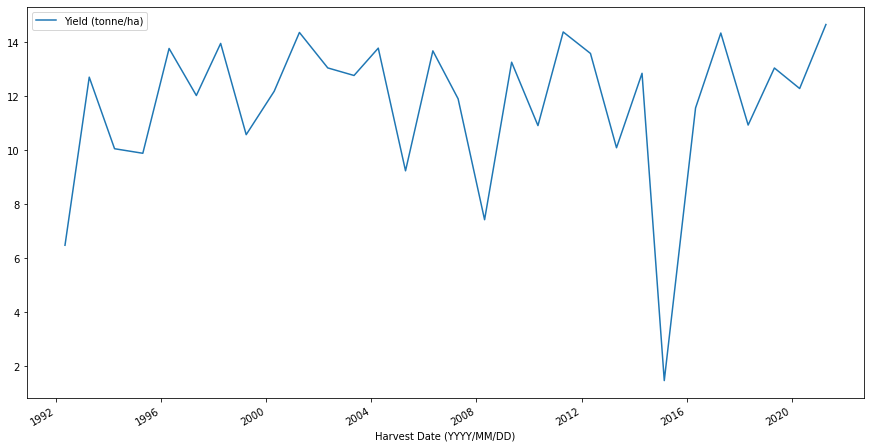

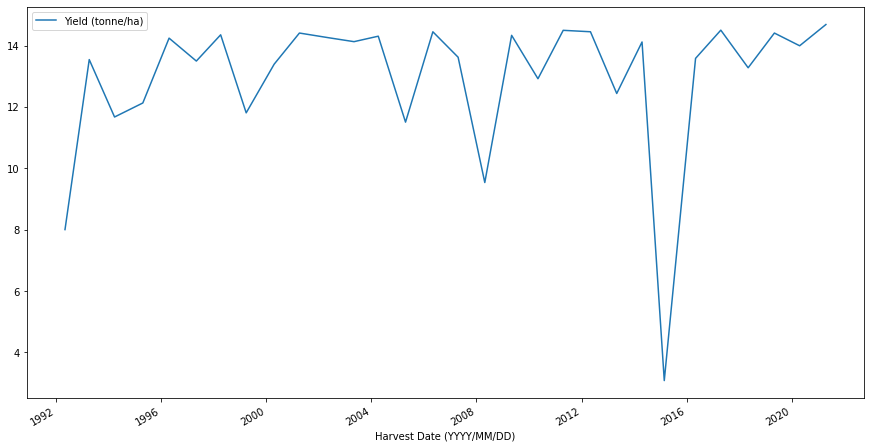

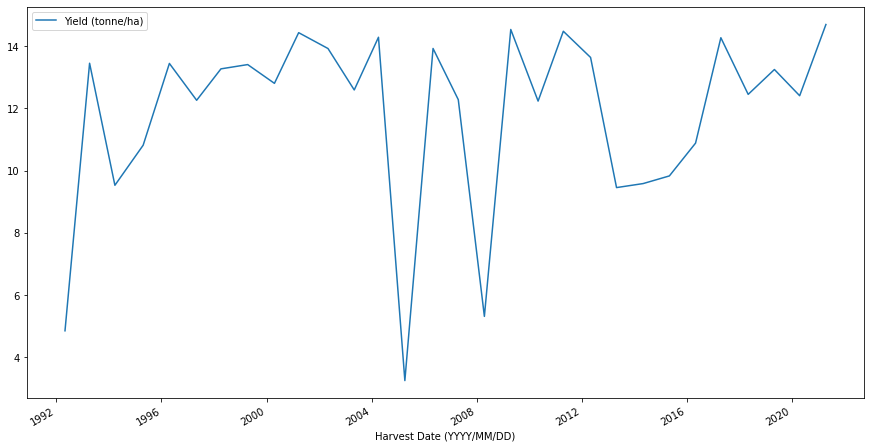

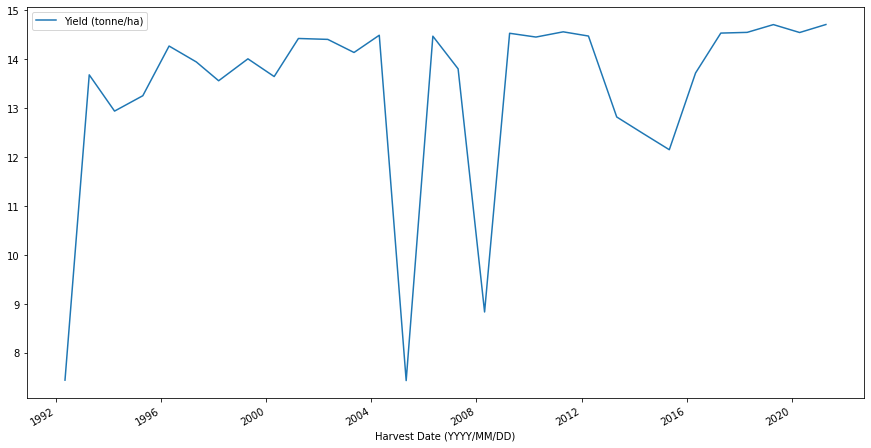

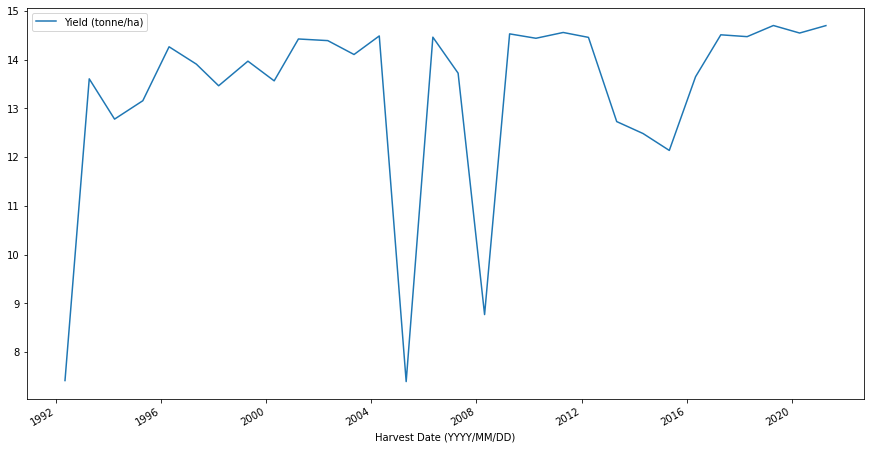

In [163]:
for i in Yields.N_ID.unique():
    dftmp = Yields.loc[Yields['N_ID']==i]
    fig, ax = plt.subplots(figsize=(15,8))
    dftmp.set_index('Harvest Date (YYYY/MM/DD)')[['Yield (tonne/ha)']].plot(ax=ax)
    #dftmp.groupby('year')['TrPot'].sum().plot(ax=ax, legend=True)
    #dftmp.groupby('year')['yield_'].sum().plot(ax=ax, legend=True)
    plt.savefig('indicators_yield_{}.png'.format(i))

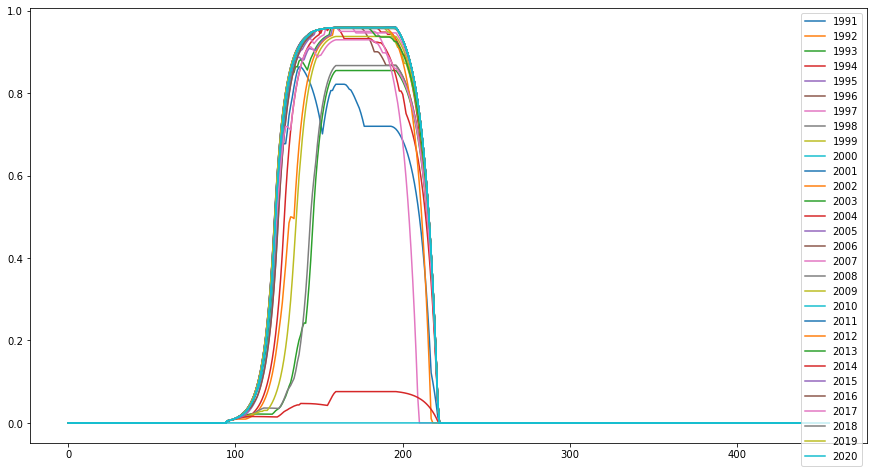

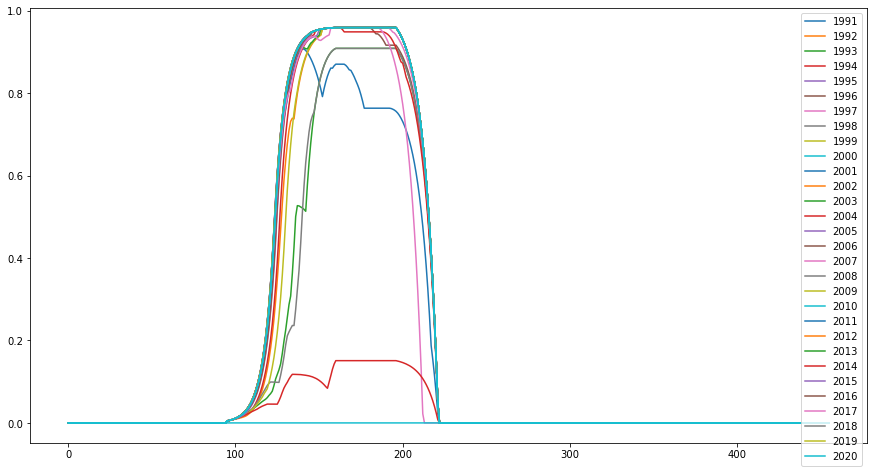

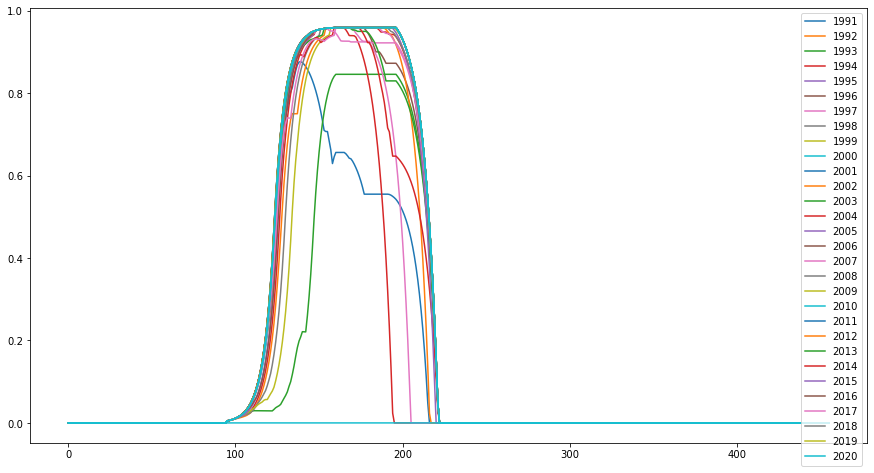

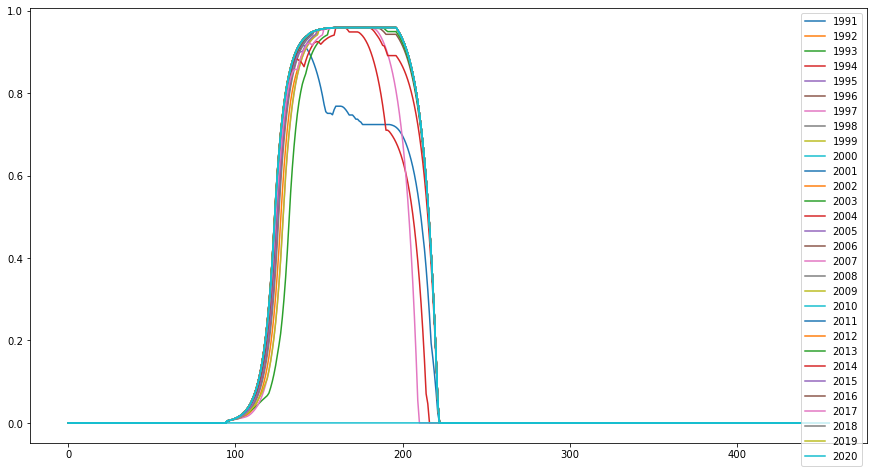

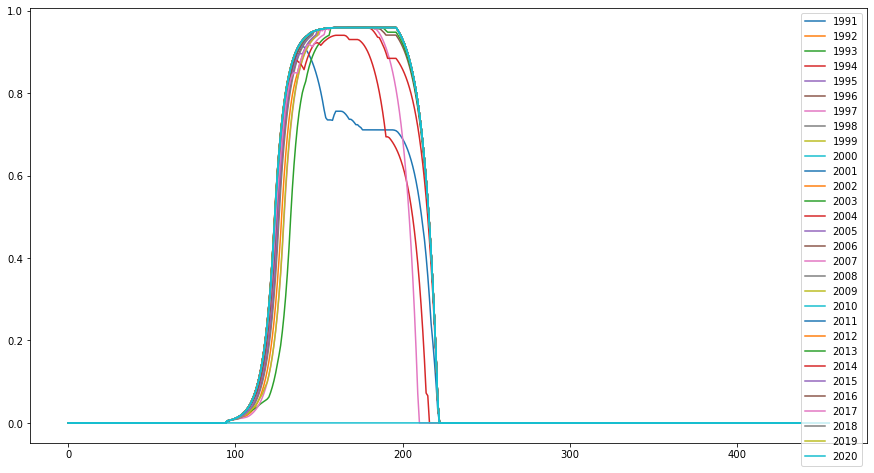

In [168]:
for i in Indicators.N_ID.unique():
    dftmp = Indicators.loc[Indicators['N_ID']==i]
    fig, ax = plt.subplots(figsize=(15,8))
    #dftmp.groupby('year')[['Wr']].plot(ax=ax, legend=False)
    #dftmp.groupby('year')['TrPot'].sum().plot(ax=ax, legend=True)
    #dftmp.groupby('year')['yield_'].sum().plot(ax=ax, legend=True)
    dftmp.groupby('year')['canopy_cover'].plot(ax=ax, legend=True)
    plt.savefig('indicators__canopycover_{}.png'.format(i))

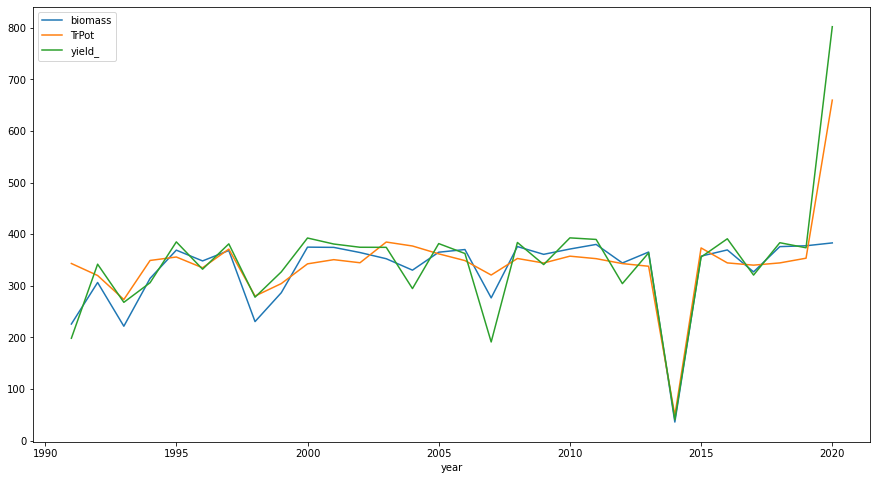

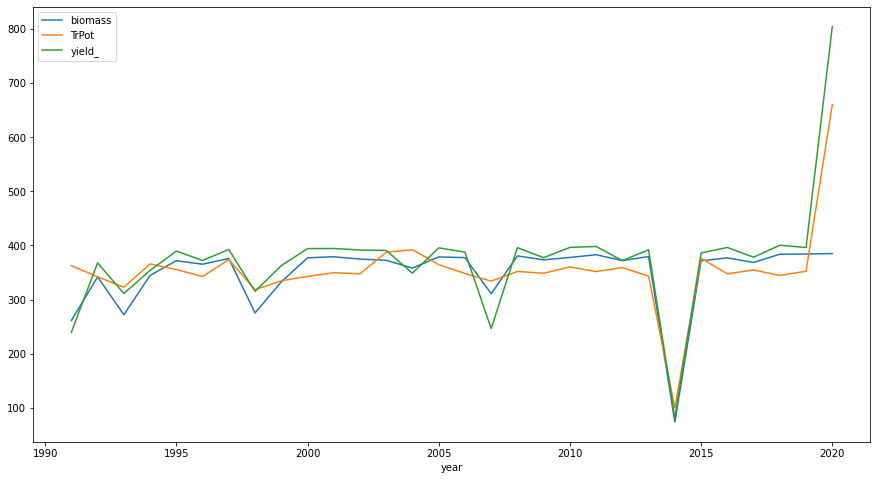

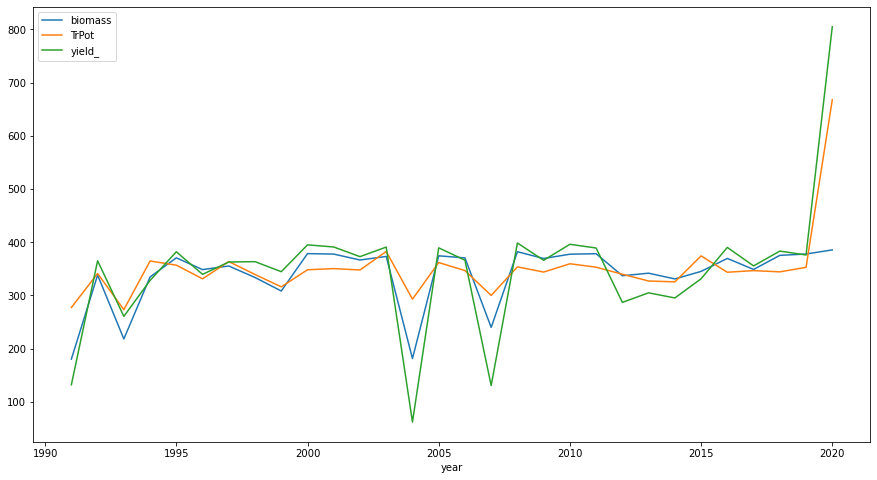

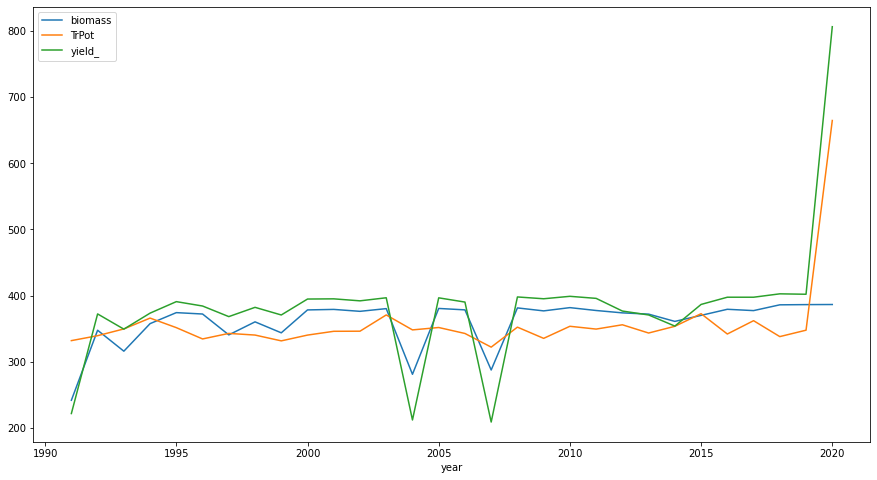

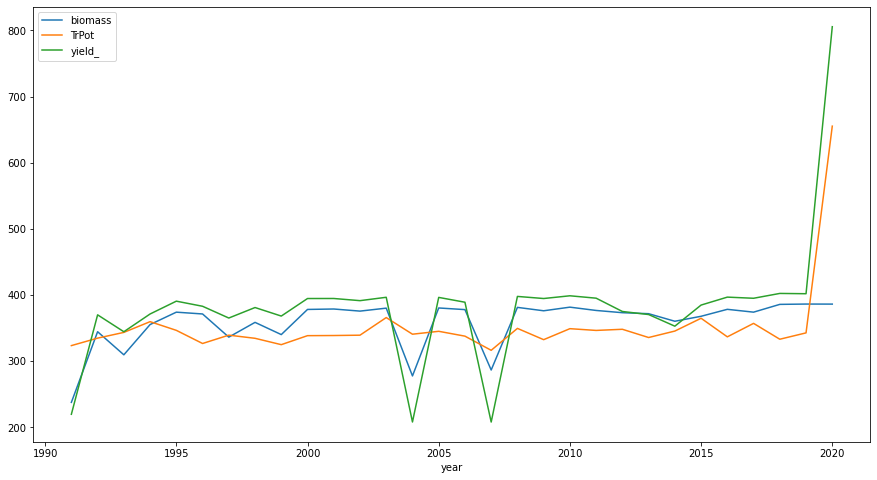

In [149]:
for i in Indicators.N_ID.unique():
    dftmp = Indicators.loc[Indicators['N_ID']==i]
    fig, ax = plt.subplots(figsize=(15,8))
    dftmp.groupby('year')[['biomass']].mean().plot(ax=ax, legend=True)
    dftmp.groupby('year')['TrPot'].sum().plot(ax=ax, legend=True)
    dftmp.groupby('year')['yield_'].sum().plot(ax=ax, legend=True)
    plt.savefig('indicators_{}.png'.format(i))

<AxesSubplot: >

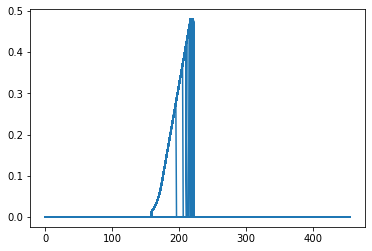

In [154]:
CropGrowth['harvest_index'].plot()

<AxesSubplot: >

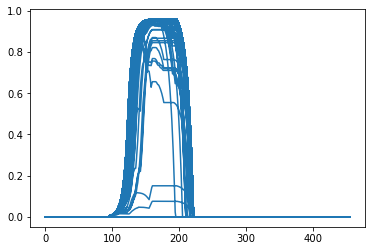

In [166]:
CropGrowth['canopy_cover'].plot()

In [121]:
Dates = pd.DataFrame()
Dates['Date'] = pd.date_range(start='1991-01-01', end='2021-12-30')

In [141]:
Dates = pd.concat([Dates, Yields[['Harvest Date (Step)','plant_date']]])

In [139]:
Yields['plant_date'] = pd.to_datetime(Yields['plant_date'], format='%Y-%m-%d')

<AxesSubplot: xlabel='plant_date'>

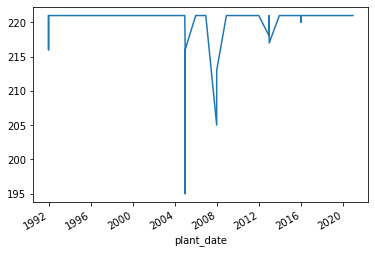

In [148]:
Yields.set_index('plant_date')['Harvest Date (Step)'].plot()

In [76]:
Combined.groupby(['Lat','Lon','Harvest Date (YYYY/MM/DD)']).mean()

Season  Harvest Date (Step)  \
Lat    Lon   Harvest Date (YYYY/MM/DD)                                
-13.05 33.05 1992-05-04                    0.0                221.0   
             1993-04-06                    0.0                221.0   
             1994-03-24                    0.0                221.0   
             1995-04-21                    0.0                221.0   
             1996-04-20                    0.0                221.0   
...                                        ...                  ...   
-13.85 33.05 2017-04-20                    0.0                221.0   
             2018-04-21                    0.0                221.0   
             2019-04-21                    0.0                221.0   
             2020-04-20                    0.0                221.0   
             2021-04-20                    0.0                221.0   

                                        Yield (tonne/ha)  \
Lat    Lon   Harvest Date (YYYY/MM/DD)                     
-13.05 33.05 1992-05-04                         6.480033   
             1993-04-06                        12.701962   
             1994-03-24                        10.053468   
             1995-04-21                         9.885041   
             1996-04-20                        13.763883   
...                                                  ...   
-13.85 33.05 2017-04-20                        14.507606   
             2018-04-21                        14.469897   
             2019-04-21                        14.698269   
             2020-04-20                        14.544034   
             2021-04-20                        14.696321   

                                        Seasonal irrigation (mm)  \
Lat    Lon   Harvest Date (YYYY/MM/DD)                             
-13.05 33.05 1992-05-04                                      0.0   
             1993-04-06                                      0.0   
             1994-03-24                                      0.0   
             1995-04-21                                      0.0   
             1996-04-20                                      0.0   
...                                                          ...   
-13.85 33.05 2017-04-20                                      0.0   
             2018-04-21                                      0.0   
             2019-04-21                                      0.0   
             2020-04-20                                      0.0   
             2021-04-20                                      0.0   

                                        time_step_counter  season_counter  \
Lat    Lon   Harvest Date (YYYY/MM/DD)                                      
-13.05 33.05 1992-05-04                               NaN             NaN   
             1993-04-06                               NaN             NaN   
             1994-03-24                               NaN             NaN   
             1995-04-21                               NaN             NaN   
             1996-04-20                               NaN             NaN   
...                                                   ...             ...   
-13.85 33.05 2017-04-20                               NaN             NaN   
             2018-04-21                               NaN             NaN   
             2019-04-21                               NaN             NaN   
             2020-04-20                               NaN             NaN   
             2021-04-20                               NaN             NaN   

                                        dap  gdd  gdd_cum  z_root  \
Lat    Lon   Harvest Date (YYYY/MM/DD)                              
-13.05 33.05 1992-05-04                 NaN  NaN      NaN     NaN   
             1993-04-06                 NaN  NaN      NaN     NaN   
             1994-03-24                 NaN  NaN      NaN     NaN   
             1995-04-21                 NaN  NaN      NaN     NaN   
             1996-04-20           

In [57]:
model._outputs.water_flux.head()

AttributeError: 'AquaCropModel' object has no attribute '_outputs'

In [ ]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
          {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]


Combined = pd.DataFrame()

for row in tqdm(countries_points_dict[2000:]):
    lon = "{:.2f}".format(float(row.get('lon')))
    lat = "{:.2f}".format(float(row.get('lat')))
    # Country
    country = row.get('ADMIN')
    # Elevation
    Elevation = row.get('Elev')
    # Soil
    point_soil_name = row.get('SoilName')
    point_soil = Soil(soil_type=point_soil_name)
    # Root Zone Depth
    pnt_rootzoneD = row.get('RZD')
    
    # Climate
    clim_filename = os.path.join('Data/Climate/4_sitefiles/','{}_{}_{}.csv'.format(country,lat,lon))
    
    if len(glob.glob(clim_filename)) == 0:
        SiteFile = get_climate(lat=lat, lon=lon,climate=climdat)
        SiteFile.to_csv(clim_filename)
    else:
        SiteFile = pd.read_csv(clim_filename,parse_dates=['Date'])
        SiteFile.drop(SiteFile.columns[[0]], axis=1, inplace=True)
    
        
    # Run scenarios for a specific grid point
    for scenario in Scenario:
    # Scenario
        scene = str(scenario.get('Name'))
    # Cropname and Irrigation
        cropname = scenario.get('Crop')
        irr_status = scenario.get('Irrigation')           
    # Planting date
        planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile, cropname=cropname)
    # Initial water
        InitWC = InitialWaterContent(value=['FC'])
    # Irrigation
        irr_num = scenario.get('IrrNum')
        soilmt = scenario.get('SMT')       
        if soilmt is None:
            net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
        else:
            net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))
            
        # Run model for each year    
        for year in SiteFile.Date.dt.year.unique():
            if ((year > SiteFile.Date.dt.year.min())) and ((year < SiteFile.Date.dt.year.max())):
        # Crop
                if cropname == 'Maize':
                    crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                else:
                    crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
        # Start and end Date
                end_year = year + 1
        # Run Aquacrop
                model = AquaCropModel(sim_start_time=f'{year}/06/06',
                                  sim_end_time=f'{end_year}/06/06',
                                  weather_df=SiteFile,
                                  soil=point_soil,
                                  crop=crop_sim,
                                  initial_water_content=InitWC,
                                  irrigation_management=net_irrigation)
                        
                try:
                    model.run_model(till_termination=True)
                    out = model._outputs.final_stats
                    out['Lat'] = lat
                    out['Lon'] = lon
                    out['Scenario'] = scene
                    out['Country'] = country 
                    
                except:
                        traceback_output = traceback.format_exc()
                        print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                        
                if len(Combined) == 0:
                    Combined = out
                else:
                    Combined = pd.concat([Combined, out], axis=0)
Combined.to_csv(os.path.join('Data/Output/CSVs','SADC_Baseline_Phase1_{}.csv'.format(dt.now())))

### Without soil profile

In [15]:
with open('countries_points_dict.json') as json_file:
    countries_points_dict = json.load(json_file)

In [21]:
len(countries_points_dict)

3130

In [20]:
for i in range(len(countries_points_dict)):
    if countries_points_dict[i]['SoilName'] == None:
        del countries_points_dict[i]
    elif countries_points_dict[i]['Elev'] == None:
        del countries_points_dict[i]
    elif countries_points_dict[i]['RZD'] == None:
        del countries_points_dict[i]

**Climate**

In [22]:
climdat = xr.open_mfdataset(glob.glob(os.path.join('Data/Climate/3_combined/','*SADC*')), parallel=True)

**Run Model**

In [23]:
countries_points_dict[0]

{'lat': -13.049999999994142,
 'lon': 22.049999999988515,
 'ADMIN': 'Zambia',
 'Elev': 1098.0,
 'SoilName': 'Loam',
 'RZD': 0.4}

In [25]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
          {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]

Combined = pd.DataFrame()

for row in tqdm(countries_points_dict[1000:2000]):
    lon = "{:.2f}".format(float(row.get('lon')))
    lat = "{:.2f}".format(float(row.get('lat')))
    # Country
    country = row.get('ADMIN')
    # Elevation
    Elevation = row.get('Elev')
    # Soil
    point_soil_name = row.get('SoilName')
    point_soil = Soil(soil_type=point_soil_name)
    # Root Zone Depth
    pnt_rootzoneD = row.get('RZD')
    
    # Climate
    clim_filename = os.path.join('Data/Climate/4_sitefiles/','{}_{}_{}.csv'.format(country,lat,lon))
    
    if len(glob.glob(clim_filename)) == 0:
        SiteFile = get_climate(lat=lat, lon=lon,climate=climdat)
        SiteFile.to_csv(clim_filename)
    else:
        SiteFile = pd.read_csv(clim_filename,parse_dates=['Date'])
        SiteFile.drop(SiteFile.columns[[0]], axis=1, inplace=True)
    
        
    # Run scenarios for a specific grid point
    for scenario in Scenario:
    # Scenario
        scene = str(scenario.get('Name'))
    # Cropname and Irrigation
        cropname = scenario.get('Crop')
        irr_status = scenario.get('Irrigation')           
    # Planting date
        planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile, cropname=cropname)
    # Initial water
        InitWC = InitialWaterContent(value=['FC'])
    # Irrigation
        irr_num = scenario.get('IrrNum')
        soilmt = scenario.get('SMT')       
        if soilmt is None:
            net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
        else:
            net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))
            
        # Run model for each year    
        for year in SiteFile.Date.dt.year.unique():
            if ((year > SiteFile.Date.dt.year.min())) and ((year < SiteFile.Date.dt.year.max())):
        # Crop
                if cropname == 'Maize':
                    crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                else:
                    crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
        # Start and end Date
                end_year = year + 1
        # Run Aquacrop
                model = AquaCropModel(sim_start_time=f'{year}/06/06',
                                  sim_end_time=f'{end_year}/06/06',
                                  weather_df=SiteFile,
                                  soil=point_soil,
                                  crop=crop_sim,
                                  initial_water_content=InitWC,
                                  irrigation_management=net_irrigation)
                        
                try:
                    model.run_model(till_termination=True)
                    out = model._outputs.final_stats
                    out['Lat'] = lat
                    out['Lon'] = lon
                    out['Scenario'] = scene
                    out['Country'] = country 
                    
                except:
                        traceback_output = traceback.format_exc()
                        print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                        
                if len(Combined) == 0:
                    Combined = out
                else:
                    Combined = pd.concat([Combined, out], axis=0)
Combined.to_csv(os.path.join('Data/Output/CSVs','SADC_Baseline_Phase1_{}.csv'.format(dt.now())))

 16%|█████▍                            | 159/1000 [4:33:49<24:21:21, 104.26s/it]

Model didnt run for: -17.45 44.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 44.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 16%|█████▍                            | 160/1000 [4:35:33<24:17:16, 104.09s/it]

Model didnt run for: -17.65 44.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 44.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 16%|█████▍                            | 161/1000 [4:37:16<24:11:22, 103.79s/it]

Model didnt run for: -17.85 44.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 16%|█████▌                            | 162/1000 [4:39:01<24:11:56, 103.96s/it]

Model didnt run for: -18.05 44.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 16%|█████▌                            | 163/1000 [4:40:45<24:11:22, 104.04s/it]

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -18.25 44.05 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero




 16%|█████▌                            | 164/1000 [4:42:26<23:59:35, 103.32s/it]

Model didnt run for: -17.05 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 16%|█████▌                            | 165/1000 [4:44:11<24:03:31, 103.73s/it]

Model didnt run for: -17.25 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 17%|█████▋                            | 166/1000 [4:45:54<23:59:34, 103.57s/it]

Model didnt run for: -17.45 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 17%|█████▋                            | 167/1000 [4:47:37<23:56:09, 103.44s/it]

Model didnt run for: -17.65 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 17%|█████▋                            | 168/1000 [4:49:21<23:56:49, 103.62s/it]

Model didnt run for: -17.85 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 17%|█████▋                            | 169/1000 [4:51:05<23:52:57, 103.46s/it]

Model didnt run for: -18.05 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 17%|█████▊                            | 170/1000 [4:52:49<23:53:21, 103.62s/it]

Model didnt run for: -18.25 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 17%|█████▊                            | 171/1000 [4:54:33<23:56:06, 103.94s/it]

Model didnt run for: -18.45 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.45 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 17%|█████▊                            | 172/1000 [4:56:16<23:51:27, 103.73s/it]

Model didnt run for: -18.65 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.65 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 17%|█████▉                            | 173/1000 [4:58:01<23:53:30, 104.00s/it]

Model didnt run for: -19.05 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.05 44.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 17%|█████▉                            | 174/1000 [4:59:45<23:50:35, 103.92s/it]

Model didnt run for: -16.25 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 18%|█████▉                            | 175/1000 [5:01:29<23:48:01, 103.86s/it]

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  Fi

Model didnt run for: -16.45 44.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_31735/2978368370.py", line 73, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 316, in solution_single_time_step
    NewCond = canopy_cover(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/solution/canopy_cover.py", line 111, in canopy_cover
    if (root_zone_depletion.Rz / taw.Rz) <= (root_zone_depletion.Zt / taw.Zt):
ZeroDivisionError: float division by zero




 18%|█████▉                            | 176/1000 [5:03:10<23:37:29, 103.22s/it]

Model didnt run for: -16.65 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 18%|██████                            | 177/1000 [5:04:54<23:39:15, 103.47s/it]

Model didnt run for: -16.85 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 18%|██████                            | 178/1000 [5:06:39<23:41:23, 103.75s/it]

Model didnt run for: -17.05 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 18%|██████                            | 179/1000 [5:08:22<23:38:17, 103.65s/it]

Model didnt run for: -17.25 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 18%|██████                            | 180/1000 [5:10:06<23:35:57, 103.61s/it]

Model didnt run for: -17.45 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 18%|██████▏                           | 181/1000 [5:11:50<23:35:36, 103.71s/it]

Model didnt run for: -17.65 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 18%|██████▏                           | 182/1000 [5:13:33<23:32:44, 103.62s/it]

Model didnt run for: -17.85 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 18%|██████▏                           | 183/1000 [5:15:17<23:34:09, 103.85s/it]

Model didnt run for: -18.05 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 18%|██████▎                           | 184/1000 [5:17:01<23:32:57, 103.89s/it]

Model didnt run for: -18.25 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 18%|██████▎                           | 185/1000 [5:18:46<23:34:46, 104.15s/it]

Model didnt run for: -18.45 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.45 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▎                           | 186/1000 [5:20:31<23:33:56, 104.22s/it]

Model didnt run for: -18.65 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.65 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▎                           | 187/1000 [5:22:14<23:30:41, 104.11s/it]

Model didnt run for: -18.85 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.85 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▍                           | 188/1000 [5:23:59<23:31:20, 104.29s/it]

Model didnt run for: -19.05 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.05 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▍                           | 189/1000 [5:25:43<23:28:40, 104.22s/it]

Model didnt run for: -19.25 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.25 44.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▍                           | 190/1000 [5:27:28<23:28:24, 104.33s/it]

Model didnt run for: -16.25 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▍                           | 191/1000 [5:29:12<23:25:12, 104.22s/it]

Model didnt run for: -16.45 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▌                           | 192/1000 [5:30:55<23:19:01, 103.89s/it]

Model didnt run for: -16.65 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▌                           | 193/1000 [5:32:38<23:14:56, 103.71s/it]

Model didnt run for: -16.85 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 19%|██████▌                           | 194/1000 [5:34:22<23:12:44, 103.68s/it]

Model didnt run for: -17.05 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 20%|██████▋                           | 195/1000 [5:36:06<23:13:59, 103.90s/it]

Model didnt run for: -17.25 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 20%|██████▋                           | 196/1000 [5:37:50<23:13:42, 104.01s/it]

Model didnt run for: -17.45 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 20%|██████▋                           | 197/1000 [5:39:34<23:10:32, 103.90s/it]

Model didnt run for: -17.65 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 20%|██████▋                           | 198/1000 [5:41:17<23:05:55, 103.68s/it]

Model didnt run for: -17.85 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 20%|██████▊                           | 199/1000 [5:43:00<23:01:54, 103.51s/it]

Model didnt run for: -18.05 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 20%|██████▊                           | 200/1000 [5:44:44<23:02:41, 103.70s/it]

Model didnt run for: -18.25 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 20%|██████▊                           | 201/1000 [5:46:27<22:57:18, 103.43s/it]

Model didnt run for: -18.45 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.45 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 20%|██████▊                           | 202/1000 [5:48:11<22:55:16, 103.40s/it]

Model didnt run for: -18.65 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.65 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 20%|██████▉                           | 203/1000 [5:49:54<22:52:59, 103.36s/it]

Model didnt run for: -18.85 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.85 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 20%|██████▉                           | 204/1000 [5:51:37<22:52:06, 103.43s/it]

Model didnt run for: -19.05 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.05 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 20%|██████▉                           | 205/1000 [5:53:22<22:54:08, 103.71s/it]

Model didnt run for: -19.25 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.25 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████                           | 206/1000 [5:55:05<22:52:08, 103.69s/it]

Model didnt run for: -19.45 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.45 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████                           | 207/1000 [5:56:49<22:50:09, 103.67s/it]

Model didnt run for: -19.65 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.65 44.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████                           | 208/1000 [5:58:34<22:52:56, 104.01s/it]

Model didnt run for: -16.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████                           | 209/1000 [6:00:19<22:53:35, 104.19s/it]

Model didnt run for: -16.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████▏                          | 210/1000 [6:02:02<22:50:07, 104.06s/it]

Model didnt run for: -16.65 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████▏                          | 211/1000 [6:03:46<22:48:01, 104.03s/it]

Model didnt run for: -16.85 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████▏                          | 212/1000 [6:05:30<22:46:13, 104.03s/it]

Model didnt run for: -17.05 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████▏                          | 213/1000 [6:07:14<22:42:38, 103.89s/it]

Model didnt run for: -17.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 21%|███████▎                          | 214/1000 [6:08:58<22:40:36, 103.86s/it]

Model didnt run for: -17.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 22%|███████▎                          | 215/1000 [6:10:42<22:39:42, 103.93s/it]

Model didnt run for: -17.65 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 22%|███████▎                          | 216/1000 [6:12:25<22:36:52, 103.84s/it]

Model didnt run for: -17.85 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 22%|███████▍                          | 217/1000 [6:14:09<22:35:47, 103.89s/it]

Model didnt run for: -18.05 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 22%|███████▍                          | 218/1000 [6:15:54<22:35:21, 103.99s/it]

Model didnt run for: -18.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 22%|███████▍                          | 219/1000 [6:17:37<22:33:12, 103.96s/it]

Model didnt run for: -18.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 22%|███████▍                          | 220/1000 [6:19:21<22:30:21, 103.87s/it]

Model didnt run for: -18.65 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.65 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 22%|███████▌                          | 221/1000 [6:21:06<22:32:14, 104.15s/it]

Model didnt run for: -18.85 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.85 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 22%|███████▌                          | 222/1000 [6:22:50<22:28:39, 104.01s/it]

Model didnt run for: -19.05 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 22%|███████▌                          | 223/1000 [6:24:33<22:24:44, 103.84s/it]

Model didnt run for: -19.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 22%|███████▌                          | 224/1000 [6:26:18<22:27:49, 104.21s/it]

Model didnt run for: -19.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 22%|███████▋                          | 225/1000 [6:28:02<22:23:21, 104.00s/it]

Model didnt run for: -20.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.45 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▋                          | 226/1000 [6:29:46<22:22:35, 104.08s/it]

Model didnt run for: -20.65 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.65 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▋                          | 227/1000 [6:31:30<22:19:08, 103.94s/it]

Model didnt run for: -20.85 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.85 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▊                          | 228/1000 [6:33:14<22:19:11, 104.08s/it]

Model didnt run for: -21.05 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.05 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▊                          | 229/1000 [6:34:57<22:14:33, 103.86s/it]

Model didnt run for: -21.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.25 44.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▊                          | 230/1000 [6:36:40<22:10:11, 103.65s/it]

Model didnt run for: -16.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▊                          | 231/1000 [6:38:24<22:09:42, 103.75s/it]

Model didnt run for: -16.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▉                          | 232/1000 [6:40:09<22:11:47, 104.05s/it]

Model didnt run for: -16.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▉                          | 233/1000 [6:41:54<22:11:51, 104.19s/it]

Model didnt run for: -16.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 23%|███████▉                          | 234/1000 [6:43:39<22:12:55, 104.41s/it]

Model didnt run for: -17.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|███████▉                          | 235/1000 [6:45:23<22:11:03, 104.40s/it]

Model didnt run for: -17.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████                          | 236/1000 [6:47:06<22:04:50, 104.05s/it]

Model didnt run for: -17.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████                          | 237/1000 [6:48:49<21:59:07, 103.73s/it]

Model didnt run for: -17.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████                          | 238/1000 [6:50:34<21:59:53, 103.93s/it]

Model didnt run for: -17.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████▏                         | 239/1000 [6:52:18<21:58:39, 103.97s/it]

Model didnt run for: -18.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████▏                         | 240/1000 [6:54:01<21:55:15, 103.84s/it]

Model didnt run for: -18.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████▏                         | 241/1000 [6:55:45<21:53:45, 103.85s/it]

Model didnt run for: -18.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████▏                         | 242/1000 [6:57:29<21:51:03, 103.78s/it]

Model didnt run for: -18.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████▎                         | 243/1000 [6:59:13<21:52:22, 104.02s/it]

Model didnt run for: -18.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 24%|████████▎                         | 244/1000 [7:00:57<21:50:03, 103.97s/it]

Model didnt run for: -19.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 24%|████████▎                         | 245/1000 [7:02:40<21:44:57, 103.71s/it]

Model didnt run for: -19.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 25%|████████▎                         | 246/1000 [7:04:25<21:46:17, 103.95s/it]

Model didnt run for: -19.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 25%|████████▍                         | 247/1000 [7:06:08<21:43:39, 103.88s/it]

Model didnt run for: -19.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 25%|████████▍                         | 248/1000 [7:07:53<21:42:49, 103.95s/it]

Model didnt run for: -19.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 25%|████████▍                         | 249/1000 [7:09:37<21:43:15, 104.12s/it]

Model didnt run for: -20.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 25%|████████▌                         | 250/1000 [7:11:21<21:40:43, 104.06s/it]

Model didnt run for: -20.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 25%|████████▌                         | 251/1000 [7:13:05<21:40:39, 104.19s/it]

Model didnt run for: -20.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.45 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 25%|████████▌                         | 252/1000 [7:14:49<21:37:30, 104.08s/it]

Model didnt run for: -20.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.65 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 25%|████████▌                         | 253/1000 [7:16:33<21:34:12, 103.95s/it]

Model didnt run for: -20.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.85 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 25%|████████▋                         | 254/1000 [7:18:17<21:33:41, 104.05s/it]

Model didnt run for: -21.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.05 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▋                         | 255/1000 [7:20:01<21:31:16, 103.99s/it]

Model didnt run for: -21.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.25 45.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▋                         | 256/1000 [7:21:45<21:28:08, 103.88s/it]

Model didnt run for: -16.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▋                         | 257/1000 [7:23:29<21:28:46, 104.07s/it]

Model didnt run for: -16.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▊                         | 258/1000 [7:25:12<21:23:58, 103.82s/it]

Model didnt run for: -16.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▊                         | 259/1000 [7:26:56<21:21:59, 103.81s/it]

Model didnt run for: -16.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▊                         | 260/1000 [7:28:40<21:19:32, 103.75s/it]

Model didnt run for: -16.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▊                         | 261/1000 [7:30:23<21:16:50, 103.67s/it]

Model didnt run for: -17.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▉                         | 262/1000 [7:32:08<21:17:44, 103.88s/it]

Model didnt run for: -17.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▉                         | 263/1000 [7:33:51<21:12:37, 103.61s/it]

Model didnt run for: -17.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|████████▉                         | 264/1000 [7:35:35<21:13:00, 103.78s/it]

Model didnt run for: -17.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 26%|█████████                         | 265/1000 [7:37:19<21:11:00, 103.76s/it]

Model didnt run for: -17.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 27%|█████████                         | 266/1000 [7:39:02<21:08:17, 103.68s/it]

Model didnt run for: -18.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 27%|█████████                         | 267/1000 [7:40:46<21:08:19, 103.82s/it]

Model didnt run for: -18.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 27%|█████████                         | 268/1000 [7:42:30<21:06:06, 103.78s/it]

Model didnt run for: -18.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 27%|█████████▏                        | 269/1000 [7:44:14<21:04:52, 103.82s/it]

Model didnt run for: -18.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 27%|█████████▏                        | 270/1000 [7:45:58<21:06:11, 104.07s/it]

Model didnt run for: -18.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 27%|█████████▏                        | 271/1000 [7:47:42<21:02:30, 103.91s/it]

Model didnt run for: -19.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 27%|█████████▏                        | 272/1000 [7:49:26<21:01:51, 104.00s/it]

Model didnt run for: -19.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 27%|█████████▎                        | 273/1000 [7:51:10<20:58:13, 103.84s/it]

Model didnt run for: -19.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 27%|█████████▎                        | 274/1000 [7:52:54<20:57:31, 103.93s/it]

Model didnt run for: -19.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 28%|█████████▎                        | 275/1000 [7:54:38<20:55:57, 103.94s/it]

Model didnt run for: -19.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 28%|█████████▍                        | 276/1000 [7:56:22<20:54:43, 103.98s/it]

Model didnt run for: -20.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 28%|█████████▍                        | 277/1000 [7:58:06<20:54:44, 104.13s/it]

Model didnt run for: -20.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 28%|█████████▍                        | 278/1000 [7:59:51<20:54:45, 104.27s/it]

Model didnt run for: -20.45 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 28%|█████████▍                        | 279/1000 [8:01:35<20:52:08, 104.20s/it]

Model didnt run for: -20.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.65 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 28%|█████████▌                        | 280/1000 [8:03:19<20:51:21, 104.28s/it]

Model didnt run for: -20.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.85 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 28%|█████████▌                        | 281/1000 [8:05:03<20:48:46, 104.21s/it]

Model didnt run for: -21.05 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 28%|█████████▌                        | 282/1000 [8:06:47<20:45:29, 104.08s/it]

Model didnt run for: -21.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.25 45.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 28%|█████████▌                        | 283/1000 [8:08:32<20:44:30, 104.14s/it]

Model didnt run for: -16.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 28%|█████████▋                        | 284/1000 [8:10:16<20:45:26, 104.37s/it]

Model didnt run for: -16.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 28%|█████████▋                        | 285/1000 [8:12:01<20:45:07, 104.49s/it]

Model didnt run for: -16.45 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▋                        | 286/1000 [8:13:45<20:40:44, 104.26s/it]

Model didnt run for: -16.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▊                        | 287/1000 [8:15:29<20:39:13, 104.28s/it]

Model didnt run for: -16.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▊                        | 288/1000 [8:17:13<20:37:01, 104.24s/it]

Model didnt run for: -17.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▊                        | 289/1000 [8:18:57<20:34:18, 104.16s/it]

Model didnt run for: -17.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▊                        | 290/1000 [8:20:42<20:34:33, 104.33s/it]

Model didnt run for: -17.45 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▉                        | 291/1000 [8:22:26<20:31:37, 104.23s/it]

Model didnt run for: -17.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▉                        | 292/1000 [8:24:10<20:29:57, 104.23s/it]

Model didnt run for: -17.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▉                        | 293/1000 [8:25:55<20:28:32, 104.26s/it]

Model didnt run for: -18.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 29%|█████████▉                        | 294/1000 [8:27:38<20:23:23, 103.97s/it]

Model didnt run for: -18.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 30%|██████████                        | 295/1000 [8:29:22<20:23:10, 104.10s/it]

Model didnt run for: -18.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 30%|██████████                        | 296/1000 [8:31:07<20:22:04, 104.15s/it]

Model didnt run for: -19.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993945600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-07-01 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 30%|██████████                        | 297/1000 [8:32:50<20:16:48, 103.85s/it]

Model didnt run for: -19.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 30%|██████████▏                       | 298/1000 [8:34:33<20:12:36, 103.64s/it]

Model didnt run for: -19.45 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 30%|██████████▏                       | 299/1000 [8:36:17<20:11:35, 103.70s/it]

Model didnt run for: -19.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 30%|██████████▏                       | 300/1000 [8:38:00<20:09:10, 103.64s/it]

Model didnt run for: -19.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 30%|██████████▏                       | 301/1000 [8:39:44<20:08:33, 103.74s/it]

Model didnt run for: -20.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 30%|██████████▎                       | 302/1000 [8:41:29<20:11:36, 104.15s/it]

Model didnt run for: -20.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 30%|██████████▎                       | 303/1000 [8:43:14<20:09:51, 104.15s/it]

Model didnt run for: -20.45 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.45 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 30%|██████████▎                       | 304/1000 [8:44:58<20:07:44, 104.12s/it]

Model didnt run for: -20.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.65 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 30%|██████████▎                       | 305/1000 [8:46:42<20:08:23, 104.32s/it]

Model didnt run for: -20.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.85 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▍                       | 306/1000 [8:48:27<20:06:17, 104.29s/it]

Model didnt run for: -21.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.05 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▍                       | 307/1000 [8:50:11<20:05:12, 104.35s/it]

Model didnt run for: -21.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.25 45.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▍                       | 308/1000 [8:51:55<20:02:49, 104.29s/it]

Model didnt run for: -15.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▌                       | 309/1000 [8:53:40<20:01:15, 104.31s/it]

Model didnt run for: -16.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▌                       | 310/1000 [8:55:24<19:59:03, 104.27s/it]

Model didnt run for: -16.25 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▌                       | 311/1000 [8:57:09<19:59:35, 104.46s/it]

Model didnt run for: -16.45 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▌                       | 312/1000 [8:58:53<19:58:37, 104.53s/it]

Model didnt run for: -16.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▋                       | 313/1000 [9:00:37<19:55:26, 104.40s/it]

Model didnt run for: -16.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 31%|██████████▋                       | 314/1000 [9:02:21<19:51:41, 104.23s/it]

Model didnt run for: -17.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|██████████▋                       | 315/1000 [9:04:06<19:51:07, 104.33s/it]

Model didnt run for: -17.25 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|██████████▋                       | 316/1000 [9:05:50<19:48:24, 104.25s/it]

Model didnt run for: -17.45 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|██████████▊                       | 317/1000 [9:07:33<19:42:59, 103.92s/it]

Model didnt run for: -17.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|██████████▊                       | 318/1000 [9:09:18<19:46:06, 104.35s/it]

Model didnt run for: -17.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|██████████▊                       | 319/1000 [9:11:01<19:39:38, 103.93s/it]

Model didnt run for: -18.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|██████████▉                       | 320/1000 [9:12:45<19:36:56, 103.85s/it]

Model didnt run for: -18.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 32%|██████████▉                       | 321/1000 [9:14:30<19:38:32, 104.14s/it]

Model didnt run for: -19.45 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 32%|██████████▉                       | 322/1000 [9:16:14<19:36:08, 104.08s/it]

Model didnt run for: -19.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|██████████▉                       | 323/1000 [9:17:58<19:34:01, 104.05s/it]

Model didnt run for: -19.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|███████████                       | 324/1000 [9:19:41<19:30:09, 103.86s/it]

Model didnt run for: -20.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 32%|███████████                       | 325/1000 [9:21:25<19:29:37, 103.97s/it]

Model didnt run for: -20.25 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.25 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████                       | 326/1000 [9:23:10<19:30:28, 104.20s/it]

Model didnt run for: -20.45 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.45 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████                       | 327/1000 [9:24:54<19:27:44, 104.11s/it]

Model didnt run for: -20.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.65 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████▏                      | 328/1000 [9:26:38<19:26:20, 104.14s/it]

Model didnt run for: -20.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.85 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████▏                      | 329/1000 [9:28:23<19:25:06, 104.18s/it]

Model didnt run for: -21.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.05 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████▏                      | 330/1000 [9:30:06<19:21:39, 104.03s/it]

Model didnt run for: -21.25 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.25 45.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████▎                      | 331/1000 [9:31:51<19:22:52, 104.29s/it]

Model didnt run for: -15.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████▎                      | 332/1000 [9:33:36<19:21:32, 104.33s/it]

Model didnt run for: -16.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████▎                      | 333/1000 [9:35:20<19:20:39, 104.41s/it]

Model didnt run for: -16.25 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 33%|███████████▎                      | 334/1000 [9:37:05<19:19:49, 104.49s/it]

Model didnt run for: -16.45 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▍                      | 335/1000 [9:38:49<19:16:36, 104.36s/it]

Model didnt run for: -16.65 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▍                      | 336/1000 [9:40:33<19:13:48, 104.26s/it]

Model didnt run for: -16.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▍                      | 337/1000 [9:42:17<19:10:51, 104.15s/it]

Model didnt run for: -17.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▍                      | 338/1000 [9:44:01<19:08:00, 104.05s/it]

Model didnt run for: -17.25 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▌                      | 339/1000 [9:45:45<19:06:04, 104.03s/it]

Model didnt run for: -17.45 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▌                      | 340/1000 [9:47:29<19:05:41, 104.15s/it]

Model didnt run for: -17.65 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▌                      | 341/1000 [9:49:13<19:04:27, 104.20s/it]

Model didnt run for: -17.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▋                      | 342/1000 [9:50:57<19:01:20, 104.07s/it]

Model didnt run for: -18.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 34%|███████████▋                      | 343/1000 [9:52:41<18:59:58, 104.11s/it]

Model didnt run for: -18.65 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 34%|███████████▋                      | 344/1000 [9:54:26<18:59:29, 104.22s/it]

Model didnt run for: -19.45 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 34%|███████████▋                      | 345/1000 [9:56:09<18:55:06, 103.98s/it]

Model didnt run for: -19.65 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 35%|███████████▊                      | 346/1000 [9:57:54<18:56:27, 104.26s/it]

Model didnt run for: -19.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 35%|███████████▊                      | 347/1000 [9:59:38<18:52:25, 104.05s/it]

Model didnt run for: -20.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 35%|███████████▍                     | 348/1000 [10:01:21<18:50:00, 103.99s/it]

Model didnt run for: -20.25 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 35%|███████████▌                     | 349/1000 [10:03:06<18:49:39, 104.12s/it]

Model didnt run for: -20.45 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 35%|███████████▌                     | 350/1000 [10:04:51<18:50:35, 104.36s/it]

Model didnt run for: -20.65 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.65 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 35%|███████████▌                     | 351/1000 [10:06:35<18:46:40, 104.16s/it]

Model didnt run for: -20.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.85 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 35%|███████████▌                     | 352/1000 [10:08:20<18:48:20, 104.48s/it]

Model didnt run for: -21.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.05 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 35%|███████████▋                     | 353/1000 [10:10:04<18:44:46, 104.31s/it]

Model didnt run for: -21.25 45.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 35%|███████████▋                     | 354/1000 [10:11:47<18:41:04, 104.12s/it]

Model didnt run for: -16.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▋                     | 355/1000 [10:13:32<18:40:52, 104.27s/it]

Model didnt run for: -16.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▋                     | 356/1000 [10:15:16<18:38:53, 104.25s/it]

Model didnt run for: -16.45 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▊                     | 357/1000 [10:17:00<18:36:30, 104.18s/it]

Model didnt run for: -16.65 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▊                     | 358/1000 [10:18:45<18:35:11, 104.22s/it]

Model didnt run for: -16.85 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▊                     | 359/1000 [10:20:29<18:34:01, 104.28s/it]

Model didnt run for: -17.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▉                     | 360/1000 [10:22:14<18:36:19, 104.66s/it]

Model didnt run for: -17.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▉                     | 361/1000 [10:23:59<18:33:30, 104.55s/it]

Model didnt run for: -17.45 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▉                     | 362/1000 [10:25:43<18:30:54, 104.47s/it]

Model didnt run for: -17.65 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|███████████▉                     | 363/1000 [10:27:27<18:27:54, 104.36s/it]

Model didnt run for: -17.85 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|████████████                     | 364/1000 [10:29:12<18:26:25, 104.38s/it]

Model didnt run for: -18.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 36%|████████████                     | 365/1000 [10:30:55<18:22:53, 104.21s/it]

Model didnt run for: -18.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 37%|████████████                     | 366/1000 [10:32:40<18:21:16, 104.22s/it]

Model didnt run for: -18.65 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.65 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 37%|████████████                     | 367/1000 [10:34:24<18:19:32, 104.22s/it]

Model didnt run for: -19.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 37%|████████████▏                    | 368/1000 [10:36:08<18:16:56, 104.14s/it]

Model didnt run for: -19.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 37%|████████████▏                    | 369/1000 [10:37:52<18:15:09, 104.13s/it]

Model didnt run for: -19.45 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.45 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 37%|████████████▏                    | 370/1000 [10:39:36<18:11:50, 103.98s/it]

Model didnt run for: -19.65 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 37%|████████████▏                    | 371/1000 [10:41:20<18:11:17, 104.10s/it]

Model didnt run for: -20.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 37%|████████████▎                    | 372/1000 [10:43:04<18:09:35, 104.10s/it]

Model didnt run for: -20.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 37%|████████████▎                    | 373/1000 [10:44:49<18:09:37, 104.27s/it]

Model didnt run for: -20.45 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 37%|████████████▎                    | 374/1000 [10:46:33<18:08:21, 104.32s/it]

Model didnt run for: -20.65 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 38%|████████████▍                    | 375/1000 [10:48:17<18:05:33, 104.21s/it]

Model didnt run for: -20.85 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 38%|████████████▍                    | 376/1000 [10:50:01<18:03:41, 104.20s/it]

Model didnt run for: -21.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -21.05 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 38%|████████████▍                    | 377/1000 [10:51:45<18:01:59, 104.20s/it]

Model didnt run for: -21.25 46.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 38%|████████████▍                    | 378/1000 [10:53:30<18:00:52, 104.26s/it]

Model didnt run for: -16.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 38%|████████████▌                    | 379/1000 [10:55:14<17:59:10, 104.27s/it]

Model didnt run for: -16.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 38%|████████████▌                    | 380/1000 [10:56:58<17:57:14, 104.25s/it]

Model didnt run for: -16.45 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 38%|████████████▌                    | 381/1000 [10:58:43<17:55:59, 104.30s/it]

Model didnt run for: -16.65 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 38%|████████████▌                    | 382/1000 [11:00:26<17:51:46, 104.06s/it]

Model didnt run for: -16.85 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 38%|████████████▋                    | 383/1000 [11:02:10<17:49:55, 104.05s/it]

Model didnt run for: -17.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 38%|████████████▋                    | 384/1000 [11:03:54<17:48:31, 104.08s/it]

Model didnt run for: -17.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 38%|████████████▋                    | 385/1000 [11:05:39<17:48:44, 104.27s/it]

Model didnt run for: -17.45 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 39%|████████████▋                    | 386/1000 [11:07:23<17:46:57, 104.26s/it]

Model didnt run for: -17.65 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 39%|████████████▊                    | 387/1000 [11:09:08<17:46:55, 104.43s/it]

Model didnt run for: -17.85 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 39%|████████████▊                    | 388/1000 [11:10:53<17:45:26, 104.46s/it]

Model didnt run for: -18.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 39%|████████████▊                    | 389/1000 [11:12:37<17:42:18, 104.32s/it]

Model didnt run for: -19.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 39%|████████████▊                    | 390/1000 [11:14:21<17:41:19, 104.39s/it]

Model didnt run for: -19.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 39%|████████████▉                    | 391/1000 [11:16:05<17:36:34, 104.10s/it]

Model didnt run for: -19.45 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -19.45 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 39%|████████████▉                    | 392/1000 [11:17:48<17:33:05, 103.92s/it]

Model didnt run for: -20.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -20.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 39%|████████████▉                    | 393/1000 [11:19:32<17:30:21, 103.83s/it]

Model didnt run for: -20.85 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 39%|█████████████                    | 394/1000 [11:21:16<17:30:06, 103.97s/it]

Model didnt run for: -21.05 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 40%|█████████████                    | 395/1000 [11:23:01<17:29:35, 104.09s/it]

Model didnt run for: -21.25 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 40%|█████████████                    | 396/1000 [11:24:45<17:29:39, 104.27s/it]

Model didnt run for: -21.45 46.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 40%|█████████████                    | 397/1000 [11:26:29<17:25:20, 104.01s/it]

Model didnt run for: -15.65 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.65 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 40%|█████████████▏                   | 398/1000 [11:28:14<17:28:10, 104.47s/it]

Model didnt run for: -15.85 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 40%|█████████████▏                   | 399/1000 [11:29:59<17:26:46, 104.50s/it]

Model didnt run for: -16.05 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 40%|█████████████▏                   | 400/1000 [11:31:44<17:28:08, 104.81s/it]

Model didnt run for: -16.25 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 40%|█████████████▏                   | 401/1000 [11:33:29<17:24:48, 104.66s/it]

Model didnt run for: -16.45 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 40%|█████████████▎                   | 402/1000 [11:35:14<17:26:40, 105.02s/it]

Model didnt run for: -16.65 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 40%|█████████████▎                   | 403/1000 [11:36:59<17:23:21, 104.86s/it]

Model didnt run for: -16.85 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 40%|█████████████▎                   | 404/1000 [11:38:43<17:19:12, 104.62s/it]

Model didnt run for: -17.05 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 40%|█████████████▎                   | 405/1000 [11:40:28<17:17:39, 104.64s/it]

Model didnt run for: -17.25 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 41%|█████████████▍                   | 406/1000 [11:42:12<17:14:14, 104.47s/it]

Model didnt run for: -17.45 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 41%|█████████████▍                   | 407/1000 [11:43:55<17:09:45, 104.19s/it]

Model didnt run for: -17.65 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 41%|█████████████▍                   | 408/1000 [11:45:39<17:07:13, 104.11s/it]

Model didnt run for: -17.85 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 41%|█████████████▍                   | 409/1000 [11:47:23<17:05:22, 104.10s/it]

Model didnt run for: -18.05 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 41%|█████████████▌                   | 410/1000 [11:49:08<17:06:12, 104.36s/it]

Model didnt run for: -18.25 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 41%|█████████████▌                   | 411/1000 [11:50:52<17:01:46, 104.09s/it]

Model didnt run for: -21.05 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 41%|█████████████▌                   | 412/1000 [11:52:36<17:01:16, 104.21s/it]

Model didnt run for: -21.45 46.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 41%|█████████████▋                   | 413/1000 [11:54:20<16:59:28, 104.21s/it]

Model didnt run for: -15.45 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.45 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 41%|█████████████▋                   | 414/1000 [11:56:05<16:59:36, 104.40s/it]

Model didnt run for: -15.65 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▋                   | 415/1000 [11:57:50<16:57:34, 104.37s/it]

Model didnt run for: -15.85 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▋                   | 416/1000 [11:59:34<16:55:20, 104.32s/it]

Model didnt run for: -16.05 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▊                   | 417/1000 [12:01:19<16:55:58, 104.56s/it]

Model didnt run for: -16.25 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▊                   | 418/1000 [12:03:03<16:52:53, 104.42s/it]

Model didnt run for: -16.45 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▊                   | 419/1000 [12:04:48<16:51:59, 104.51s/it]

Model didnt run for: -16.65 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▊                   | 420/1000 [12:06:33<16:52:02, 104.69s/it]

Model didnt run for: -16.85 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▉                   | 421/1000 [12:08:17<16:49:21, 104.60s/it]

Model didnt run for: -17.05 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▉                   | 422/1000 [12:10:01<16:45:21, 104.36s/it]

Model didnt run for: -17.25 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▉                   | 423/1000 [12:11:46<16:44:14, 104.43s/it]

Model didnt run for: -17.45 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|█████████████▉                   | 424/1000 [12:13:30<16:42:12, 104.40s/it]

Model didnt run for: -17.65 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 42%|██████████████                   | 425/1000 [12:15:14<16:39:27, 104.29s/it]

Model didnt run for: -17.85 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 46.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 43%|██████████████                   | 426/1000 [12:16:58<16:38:01, 104.32s/it]

Model didnt run for: -15.45 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.45 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 43%|██████████████                   | 427/1000 [12:18:43<16:37:54, 104.49s/it]

Model didnt run for: -15.65 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 43%|██████████████                   | 428/1000 [12:20:28<16:36:20, 104.51s/it]

Model didnt run for: -15.85 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 43%|██████████████▏                  | 429/1000 [12:22:12<16:33:14, 104.37s/it]

Model didnt run for: -16.05 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 43%|██████████████▏                  | 430/1000 [12:23:57<16:34:25, 104.68s/it]

Model didnt run for: -16.25 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 43%|██████████████▏                  | 431/1000 [12:25:43<16:34:46, 104.90s/it]

Model didnt run for: -16.45 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 43%|██████████████▎                  | 432/1000 [12:27:27<16:30:45, 104.66s/it]

Model didnt run for: -16.65 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 43%|██████████████▎                  | 433/1000 [12:29:11<16:27:57, 104.55s/it]

Model didnt run for: -16.85 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 43%|██████████████▎                  | 434/1000 [12:30:55<16:24:57, 104.41s/it]

Model didnt run for: -17.05 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▎                  | 435/1000 [12:32:39<16:22:56, 104.38s/it]

Model didnt run for: -17.25 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▍                  | 436/1000 [12:34:24<16:22:29, 104.52s/it]

Model didnt run for: -17.45 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▍                  | 437/1000 [12:36:09<16:21:34, 104.61s/it]

Model didnt run for: -17.65 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▍                  | 438/1000 [12:37:53<16:18:49, 104.50s/it]

Model didnt run for: -18.05 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -18.05 46.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▍                  | 439/1000 [12:39:38<16:16:25, 104.43s/it]

Model didnt run for: -15.65 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▌                  | 440/1000 [12:41:22<16:15:20, 104.50s/it]

Model didnt run for: -15.85 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▌                  | 441/1000 [12:43:07<16:15:15, 104.68s/it]

Model didnt run for: -16.05 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▌                  | 442/1000 [12:44:52<16:12:14, 104.54s/it]

Model didnt run for: -16.25 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 44%|██████████████▌                  | 443/1000 [12:46:37<16:14:11, 104.94s/it]

Model didnt run for: -16.45 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▋                  | 444/1000 [12:48:21<16:09:54, 104.67s/it]

Model didnt run for: -16.65 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 44%|██████████████▋                  | 445/1000 [12:50:06<16:07:18, 104.57s/it]

Model didnt run for: -16.85 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▋                  | 446/1000 [12:51:50<16:04:12, 104.43s/it]

Model didnt run for: -17.05 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▊                  | 447/1000 [12:53:34<16:02:03, 104.38s/it]

Model didnt run for: -17.25 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 47.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▊                  | 448/1000 [12:55:19<16:01:52, 104.55s/it]

Model didnt run for: -15.05 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▊                  | 449/1000 [12:57:03<15:59:31, 104.49s/it]

Model didnt run for: -15.25 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▊                  | 450/1000 [12:58:48<15:57:51, 104.49s/it]

Model didnt run for: -15.45 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▉                  | 451/1000 [13:00:32<15:54:35, 104.33s/it]

Model didnt run for: -15.65 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▉                  | 452/1000 [13:02:16<15:51:02, 104.13s/it]

Model didnt run for: -15.85 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▉                  | 453/1000 [13:03:59<15:48:15, 104.01s/it]

Model didnt run for: -16.05 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 45%|██████████████▉                  | 454/1000 [13:05:44<15:47:38, 104.14s/it]

Model didnt run for: -16.25 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████                  | 455/1000 [13:07:27<15:44:48, 104.02s/it]

Model didnt run for: -16.45 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████                  | 456/1000 [13:09:12<15:45:45, 104.31s/it]

Model didnt run for: -16.65 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████                  | 457/1000 [13:10:57<15:43:48, 104.29s/it]

Model didnt run for: -16.85 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████                  | 458/1000 [13:12:42<15:44:26, 104.55s/it]

Model didnt run for: -17.05 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████▏                 | 459/1000 [13:14:26<15:41:52, 104.46s/it]

Model didnt run for: -17.45 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████▏                 | 460/1000 [13:16:11<15:41:31, 104.61s/it]

Model didnt run for: -17.65 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████▏                 | 461/1000 [13:17:57<15:44:30, 105.14s/it]

Model didnt run for: -17.85 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.85 47.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████▏                 | 462/1000 [13:19:43<15:42:55, 105.16s/it]

Model didnt run for: -14.85 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████▎                 | 463/1000 [13:21:28<15:40:32, 105.09s/it]

Model didnt run for: -15.25 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 46%|███████████████▎                 | 464/1000 [13:23:15<15:44:27, 105.72s/it]

Model didnt run for: -15.45 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 46%|███████████████▎                 | 465/1000 [13:25:01<15:42:45, 105.73s/it]

Model didnt run for: -15.65 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.65 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▍                 | 466/1000 [13:26:47<15:41:51, 105.83s/it]

Model didnt run for: -15.85 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▍                 | 467/1000 [13:28:32<15:38:29, 105.65s/it]

Model didnt run for: -16.05 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▍                 | 468/1000 [13:30:19<15:40:08, 106.03s/it]

Model didnt run for: -16.25 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▍                 | 469/1000 [13:32:06<15:40:40, 106.29s/it]

Model didnt run for: -16.45 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▌                 | 470/1000 [13:33:52<15:40:07, 106.43s/it]

Model didnt run for: -16.65 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▌                 | 471/1000 [13:35:40<15:41:21, 106.77s/it]

Model didnt run for: -16.85 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▌                 | 472/1000 [13:37:26<15:38:32, 106.65s/it]

Model didnt run for: -17.65 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 47.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▌                 | 473/1000 [13:39:12<15:34:53, 106.44s/it]

Model didnt run for: -14.85 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 47%|███████████████▋                 | 474/1000 [13:40:59<15:33:46, 106.51s/it]

Model didnt run for: -15.05 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▋                 | 475/1000 [13:42:45<15:30:39, 106.36s/it]

Model didnt run for: -15.25 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▋                 | 476/1000 [13:44:30<15:25:59, 106.03s/it]

Model didnt run for: -15.45 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 48%|███████████████▋                 | 477/1000 [13:46:17<15:25:57, 106.23s/it]

Model didnt run for: -15.65 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.65 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▊                 | 478/1000 [13:48:02<15:22:27, 106.03s/it]

Model didnt run for: -15.85 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▊                 | 479/1000 [13:49:49<15:20:51, 106.05s/it]

Model didnt run for: -16.05 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▊                 | 480/1000 [13:51:34<15:17:33, 105.87s/it]

Model didnt run for: -16.25 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▊                 | 481/1000 [13:53:20<15:16:17, 105.93s/it]

Model didnt run for: -16.45 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▉                 | 482/1000 [13:55:06<15:14:19, 105.91s/it]

Model didnt run for: -16.65 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▉                 | 483/1000 [13:56:52<15:12:52, 105.94s/it]

Model didnt run for: -16.85 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|███████████████▉                 | 484/1000 [13:58:38<15:12:17, 106.08s/it]

Model didnt run for: -17.05 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 48%|████████████████                 | 485/1000 [14:00:24<15:10:30, 106.08s/it]

Model didnt run for: -17.25 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 49%|████████████████                 | 486/1000 [14:02:11<15:08:46, 106.08s/it]

Model didnt run for: -17.45 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 49%|████████████████                 | 487/1000 [14:03:57<15:07:30, 106.14s/it]

Model didnt run for: -17.65 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.65 47.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

 49%|████████████████▏                | 490/1000 [14:09:16<15:03:17, 106.27s/it]

Model didnt run for: -14.85 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 49%|████████████████▏                | 491/1000 [14:11:01<14:59:20, 106.01s/it]

Model didnt run for: -15.05 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 49%|████████████████▏                | 492/1000 [14:12:47<14:56:36, 105.90s/it]

Model didnt run for: -15.25 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 49%|████████████████▎                | 493/1000 [14:14:33<14:55:33, 105.98s/it]

Model didnt run for: -15.45 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 49%|████████████████▎                | 494/1000 [14:16:20<14:55:18, 106.16s/it]

Model didnt run for: -15.65 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.65 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 50%|████████████████▎                | 495/1000 [14:18:05<14:52:27, 106.03s/it]

Model didnt run for: -15.85 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 50%|████████████████▎                | 496/1000 [14:19:52<14:51:11, 106.10s/it]

Model didnt run for: -16.05 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 50%|████████████████▍                | 497/1000 [14:21:37<14:48:51, 106.03s/it]

Model didnt run for: -16.25 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.25 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 50%|████████████████▍                | 498/1000 [14:23:24<14:47:18, 106.05s/it]

Model didnt run for: -16.45 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 50%|████████████████▍                | 499/1000 [14:25:09<14:44:36, 105.94s/it]

Model didnt run for: -17.05 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 50%|████████████████▌                | 500/1000 [14:26:55<14:42:01, 105.84s/it]

Model didnt run for: -17.25 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 50%|████████████████▌                | 501/1000 [14:28:41<14:41:06, 105.95s/it]

Model didnt run for: -17.45 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 47.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

 50%|████████████████▋                | 505/1000 [14:35:45<14:35:09, 106.08s/it]

Model didnt run for: -14.85 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 51%|████████████████▋                | 506/1000 [14:37:32<14:34:24, 106.20s/it]

Model didnt run for: -15.05 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 51%|████████████████▋                | 507/1000 [14:39:17<14:30:54, 105.99s/it]

Model didnt run for: -15.25 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 51%|████████████████▊                | 508/1000 [14:41:03<14:28:28, 105.91s/it]

Model didnt run for: -15.45 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 51%|████████████████▊                | 509/1000 [14:42:49<14:26:26, 105.88s/it]

Model didnt run for: -15.65 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 51%|████████████████▊                | 510/1000 [14:44:34<14:23:57, 105.79s/it]

Model didnt run for: -15.85 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 51%|████████████████▊                | 511/1000 [14:46:20<14:22:59, 105.89s/it]

Model didnt run for: -16.05 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 51%|████████████████▉                | 512/1000 [14:48:06<14:20:33, 105.81s/it]

Model didnt run for: -16.25 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 51%|████████████████▉                | 513/1000 [14:49:52<14:18:26, 105.76s/it]

Model didnt run for: -16.45 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 51%|████████████████▉                | 514/1000 [14:51:38<14:17:00, 105.80s/it]

Model didnt run for: -16.65 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 52%|████████████████▉                | 515/1000 [14:53:23<14:14:47, 105.75s/it]

Model didnt run for: -17.25 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 48.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

 52%|█████████████████▏               | 519/1000 [15:00:27<14:08:15, 105.81s/it]

Model didnt run for: -14.85 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 52%|█████████████████▏               | 520/1000 [15:02:13<14:07:33, 105.94s/it]

Model didnt run for: -15.05 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 52%|█████████████████▏               | 521/1000 [15:03:59<14:06:36, 106.05s/it]

Model didnt run for: -15.25 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 52%|█████████████████▏               | 522/1000 [15:05:46<14:07:23, 106.37s/it]

Model didnt run for: -15.45 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.45 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 52%|█████████████████▎               | 523/1000 [15:07:33<14:06:21, 106.46s/it]

Model didnt run for: -15.65 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.65 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 52%|█████████████████▎               | 524/1000 [15:09:20<14:05:00, 106.51s/it]

Model didnt run for: -15.85 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 52%|█████████████████▎               | 525/1000 [15:11:07<14:04:15, 106.64s/it]

Model didnt run for: -16.05 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 53%|█████████████████▎               | 526/1000 [15:12:52<13:59:24, 106.25s/it]

Model didnt run for: -16.45 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.45 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 53%|█████████████████▍               | 527/1000 [15:14:40<14:00:56, 106.67s/it]

Model didnt run for: -16.65 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 48.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 53%|█████████████████▍               | 528/1000 [15:16:26<13:59:12, 106.68s/it]

Model didnt run for: -14.85 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1120089600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2005-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 53%|█████████████████▍               | 529/1000 [15:18:12<13:55:33, 106.44s/it]

Model didnt run for: -15.05 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 53%|█████████████████▍               | 530/1000 [15:19:58<13:52:07, 106.23s/it]

Model didnt run for: -15.25 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 53%|█████████████████▌               | 531/1000 [15:21:43<13:48:11, 105.95s/it]

Model didnt run for: -15.45 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.45 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 53%|█████████████████▌               | 532/1000 [15:23:30<13:49:00, 106.28s/it]

Model didnt run for: -15.65 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.65 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 53%|█████████████████▌               | 533/1000 [15:25:17<13:48:24, 106.43s/it]

Model didnt run for: -15.85 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 53%|█████████████████▌               | 534/1000 [15:27:02<13:43:34, 106.04s/it]

Model didnt run for: -16.05 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 48.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 54%|█████████████████▋               | 535/1000 [15:28:48<13:41:57, 106.06s/it]

Model didnt run for: -15.45 48.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.45 48.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1625011200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 54%|█████████████████▋               | 536/1000 [15:30:34<13:39:51, 106.02s/it]

Model didnt run for: -15.65 48.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.65 48.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1497052800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-10 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 54%|█████████████████▋               | 537/1000 [15:32:21<13:40:29, 106.33s/it]

Model didnt run for: -15.85 48.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -15.85 48.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1372550400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2013-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 54%|█████████████████▊               | 538/1000 [15:34:07<13:38:09, 106.26s/it]

Model didnt run for: -16.05 48.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 741398400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1993-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.05 48.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1372550400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2013-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 54%|█████████████████▊               | 539/1000 [15:35:54<13:36:31, 106.27s/it]

Model didnt run for: -12.45 48.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 54%|█████████████████▊               | 540/1000 [15:37:40<13:35:10, 106.33s/it]

Model didnt run for: -13.45 48.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1246320000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2009-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

 54%|█████████████████▉               | 542/1000 [15:41:12<13:29:35, 106.06s/it]

Model didnt run for: -12.45 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 54%|█████████████████▉               | 543/1000 [15:42:58<13:27:46, 106.05s/it]

Model didnt run for: -12.65 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 54%|█████████████████▉               | 544/1000 [15:44:44<13:27:08, 106.20s/it]

Model didnt run for: -12.85 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 55%|█████████████████▉               | 545/1000 [15:46:31<13:26:45, 106.39s/it]

Model didnt run for: -13.05 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -13.05 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 55%|██████████████████               | 546/1000 [15:48:17<13:24:39, 106.34s/it]

Model didnt run for: -13.25 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -13.25 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 55%|██████████████████               | 547/1000 [15:50:03<13:20:37, 106.04s/it]

Model didnt run for: -13.45 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 55%|██████████████████               | 548/1000 [15:51:48<13:17:57, 105.92s/it]

Model didnt run for: -13.65 49.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 55%|██████████████████               | 549/1000 [15:53:35<13:16:39, 105.98s/it]

Model didnt run for: -12.05 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 55%|██████████████████▏              | 550/1000 [15:55:22<13:17:53, 106.39s/it]

Model didnt run for: -12.25 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 55%|██████████████████▏              | 551/1000 [15:57:08<13:15:45, 106.34s/it]

Model didnt run for: -12.45 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 55%|██████████████████▏              | 552/1000 [15:58:53<13:11:45, 106.04s/it]

Model didnt run for: -12.65 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 55%|██████████████████▏              | 553/1000 [16:00:39<13:09:28, 105.97s/it]

Model didnt run for: -12.85 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 55%|██████████████████▎              | 554/1000 [16:02:27<13:10:55, 106.40s/it]

Model didnt run for: -13.05 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -13.05 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 56%|██████████████████▎              | 555/1000 [16:04:13<13:08:52, 106.37s/it]

Model didnt run for: -13.25 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -13.25 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1498780800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 56%|██████████████████▎              | 556/1000 [16:05:59<13:07:04, 106.36s/it]

Model didnt run for: -13.45 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 56%|██████████████████▍              | 557/1000 [16:07:45<13:04:16, 106.22s/it]

Model didnt run for: -13.65 49.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 56%|██████████████████▍              | 558/1000 [16:09:31<13:02:30, 106.22s/it]

Model didnt run for: -12.45 49.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 995760000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-07-22 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 56%|██████████████████▍              | 559/1000 [16:11:17<13:00:05, 106.13s/it]

Model didnt run for: -12.65 49.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -12.65 49.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1624492800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2021-06-24 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 56%|██████████████████▍              | 560/1000 [16:13:04<12:58:25, 106.15s/it]

Model didnt run for: -12.85 49.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -12.85 49.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1497052800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-10 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 56%|██████████████████▌              | 561/1000 [16:14:51<12:58:39, 106.42s/it]

Model didnt run for: -13.05 49.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 56%|██████████████████▌              | 562/1000 [16:16:37<12:56:43, 106.40s/it]

Model didnt run for: -13.25 49.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 56%|██████████████████▌              | 563/1000 [16:18:23<12:53:22, 106.18s/it]

Model didnt run for: -13.45 49.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 993859200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2001-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 56%|██████████████████▌              | 564/1000 [16:20:09<12:50:58, 106.10s/it]

Model didnt run for: -12.85 49.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 56%|██████████████████▋              | 565/1000 [16:21:55<12:50:08, 106.23s/it]

Model didnt run for: -13.05 49.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -13.05 49.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1497052800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-10 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 57%|██████████████████▋              | 566/1000 [16:23:42<12:48:55, 106.30s/it]

Model didnt run for: -13.25 49.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -13.25 49.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1497052800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-10 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 57%|██████████████████▋              | 567/1000 [16:25:28<12:47:02, 106.29s/it]

Model didnt run for: -13.45 49.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)


 57%|██████████████████▋              | 568/1000 [16:27:14<12:45:12, 106.28s/it]

Model didnt run for: -13.05 49.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -13.05 49.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1497052800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-10 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 57%|██████████████████▊              | 569/1000 [16:29:00<12:42:56, 106.21s/it]

Model didnt run for: -13.25 49.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -13.25 49.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1497052800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2017-06-10 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 57%|██████████████████▊              | 570/1000 [16:30:46<12:41:28, 106.25s/it]

Model didnt run for: -13.45 49.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 867628800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1997-06-30 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

 64%|█████████████████████            | 639/1000 [18:32:59<10:40:20, 106.43s/it]

Model didnt run for: -16.65 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 802828800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1995-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.65 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1402444800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2014-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -16.65 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 64%|█████████████████████            | 640/1000 [18:34:45<10:38:35, 106.43s/it]

Model didnt run for: -16.65 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -16.85 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1402444800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2014-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -16.85 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1402444800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2014-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 64%|█████████████████████▏           | 641/1000 [18:36:32<10:37:25, 106.53s/it]

Model didnt run for: -16.85 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1528675200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2018-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1402444800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2014-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 64%|█████████████████████▏           | 642/1000 [18:38:18<10:34:47, 106.39s/it]

Model didnt run for: -17.05 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 64%|█████████████████████▏           | 643/1000 [18:40:05<10:34:03, 106.57s/it]

Model didnt run for: -17.25 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 64%|█████████████████████▎           | 644/1000 [18:41:52<10:32:31, 106.61s/it]

Model didnt run for: -17.45 23.65 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -16.85 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1402444800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2014-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -16.85 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -16.85 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1402444800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2014-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 64%|█████████████████████▎           | 645/1000 [18:43:37<10:28:26, 106.22s/it]

Model didnt run for: -16.85 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1528675200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2018-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▎           | 646/1000 [18:45:23<10:25:32, 106.02s/it]

Model didnt run for: -17.05 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 771292800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1994-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1528675200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2018-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▎           | 647/1000 [18:47:09<10:23:57, 106.06s/it]

Model didnt run for: -17.25 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 771292800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1994-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1528675200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2018-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▍           | 648/1000 [18:48:55<10:21:42, 105.97s/it]

Model didnt run for: -17.45 23.85 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▍           | 649/1000 [18:50:41<10:20:51, 106.13s/it]

Model didnt run for: -17.05 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▍           | 650/1000 [18:52:28<10:19:56, 106.28s/it]

Model didnt run for: -17.25 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▍           | 651/1000 [18:54:14<10:17:32, 106.17s/it]

Model didnt run for: -17.45 24.05 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▌           | 652/1000 [18:55:59<10:14:01, 105.87s/it]

Model didnt run for: -17.25 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 929059200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1999-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▌           | 653/1000 [18:57:45<10:12:15, 105.86s/it]

Model didnt run for: -17.45 24.25 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 897523200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1998-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.05 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 897523200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1998-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.05 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1339372800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2012-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 65%|█████████████████████▌           | 654/1000 [18:59:31<10:10:56, 105.94s/it]

Model didnt run for: -17.05 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 897523200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1998-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1307750400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2011-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.25 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 771292800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1994-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.25 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 66%|█████████████████████▌           | 655/1000 [19:01:16<10:08:24, 105.81s/it]

Model didnt run for: -17.25 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 897523200000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1998-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1307750400000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2011-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

Model didnt run for: -17.45 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 771292800000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1994-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last)

Model didnt run for: -17.45 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1181520000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2007-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last


 66%|█████████████████████▋           | 656/1000 [19:03:03<10:07:37, 105.98s/it]

Model didnt run for: -17.45 24.45 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 1654905600000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('2022-06-11 00:00:00')

The above exception was the direct cause of the following exception:

Traceback (most recent call last

100%|███████████████████████████████████| 1000/1000 [29:20:24<00:00, 105.62s/it]


In [130]:
test = Combined.groupby(['Lat','Lon','Harvest Date (YYYY/MM/DD)','Country','Scenario']).mean()

In [131]:
test

Season  \
Lat    Lon   Harvest Date (YYYY/MM/DD) Country Scenario             
-13.05 22.05 1992                      Zambia  High_Input     0.0   
                                               Low_Input      0.0   
             1993                      Zambia  High_Input     0.0   
                                               Low_Input      0.0   
             1994                      Zambia  High_Input     0.0   
...                                                           ...   
-13.25 22.05 2020                      Zambia  Low_Input      0.0   
             2021                      Zambia  High_Input     0.0   
                                               Low_Input      0.0   
             2022                      Zambia  High_Input     0.0   
                                               Low_Input      0.0   

                                                           Harvest Date (Step)  \
Lat    Lon   Harvest Date (YYYY/MM/DD) Country Scenario                          
-13.05 22.05 1992                      Zambia  High_Input           284.000000   
                                               Low_Input            284.000000   
             1993                      Zambia  High_Input           255.000000   
                                               Low_Input            255.000000   
             1994                      Zambia  High_Input           284.000000   
...                                                                        ...   
-13.25 22.05 2020                      Zambia  Low_Input            284.000000   
             2021                      Zambia  High_Input           273.666667   
                                               Low_Input            273.666667   
             2022                      Zambia  High_Input           288.666667   
                                               Low_Input            288.666667   

                                                           Yield (tonne/ha)  \
Lat    Lon   Harvest Date (YYYY/MM/DD) Country Scenario                       
-13.05 22.05 1992                      Zambia  High_Input          7.753324   
                                               Low_Input           7.755087   
             1993                      Zambia  High_Input          7.748419   
                                               Low_Input           7.699364   
             1994                      Zambia  High_Input          7.766740   
...                                                                     ...   
-13.25 22.05 2020                      Zambia  Low_Input           7.946124   
             2021                      Zambia  High_Input          8.003950   
                                               Low_Input           7.978603   
             2022                      Zambia  High_Input          8.012269   
                                               Low_Input           8.005492   

                                                           Seasonal irrigation (mm)  
Lat    Lon   Harvest Date (YYYY/MM/DD) Country Scenario                              
-13.05 22.05 1992                      Zambia  High_Input                  6.954974  
                                               Low_Input                   0.000000  
             1993                      Zambia  High_Input                 15.449784  
                                               Low_Input                   0.000000  
             1994                      Zambia  High_Input                 49.930386  
...                                                                             ...  
-13.25 22.05 2020                      Zambia  Low_Input                   0.000000  
             2021                      Zambia  High_Input                 13.970539  
                                               Low_Input                   0.000000  
             2022                      Zambia  High_Input                  6.564385  
                                  

In [132]:
test = test[['Yield (tonne/ha)']].to_xarray()

TypeError: Plotting requires coordinates to be numeric, boolean, or dates of type numpy.datetime64, datetime.datetime, cftime.datetime or pandas.Interval. Received data of type object instead.

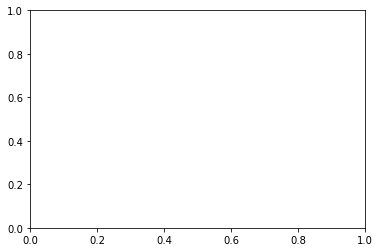

In [135]:
test['Yield (tonne/ha)'][:,:,0,0,0].plot()

In [119]:
Combined.head()

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Yield (tonne/ha),Seasonal irrigation (mm),Lat,Lon,Scenario,Country
0,0,SugarCane,1992,245,0.099220,0.0,-13.25,22.05,High_Input,Zambia
0,0,SugarCane,1993,245,0.099308,0.0,-13.25,22.05,High_Input,Zambia
0,0,SugarCane,1994,245,0.099322,0.0,-13.25,22.05,High_Input,Zambia
0,0,SugarCane,1995,245,0.099785,0.0,-13.25,22.05,High_Input,Zambia
0,0,SugarCane,1996,245,0.099982,0.0,-13.25,22.05,High_Input,Zambia


In [65]:
if len(glob.glob(clim_filename)) == 0:
    print(1)

1


In [38]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
          {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]


for row in tqdm(gridpoints_test[:10]):
    lon = "{:.2f}".format(float(row.get('lon')))
    lat = "{:.2f}".format(float(row.get('lat')))
    # Country
    country = row.get('ADMIN')
    # Elevation
    Elevation = row.get('Elev')
    # Soil
    pnt_soil = row.get('SoilName')
    # Root Zone Depth
    pnt_rootzoneD = row.get('RZD')
        
    # Climate
    
    SiteFile = get_climate(lat=lat, lon=lon,climate=climdat)
        
    # Run scenarios for a specific grid point
    for scenario in Scenario:
    # Scenario
        scene = str(scenario.get('Name'))
    # Cropname and Irrigation
        cropname = scenario.get('Crop')
        irr_status = scenario.get('Irrigation')
                
    # Planting date
        planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile, cropname=cropname)    
    # Initial water
        InitWC = InitialWaterContent(value=['FC'])
    # Irrigation
        irr_num = scenario.get('IrrNum')
        soilmt = scenario.get('SMT')
                
       if soilmt is None:
            net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
        else:
            net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))          
        # Run model for each year    
       for year in SiteFile.Date.dt.year.unique():
            if ((year > SiteFile.Date.dt.year.min())) and ((year < SiteFile.Date.dt.year.max())):
        # Crop
                if cropname == 'Maize':
                    crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                else:
                    crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
        # Start and end Date
                start_sim = get_startdate(year=year)
                end_sim = get_enddate(year=year)
        # Run Aquacrop
                model = AquaCropModel(sim_start_time=f'{start_sim}',
                                  sim_end_time=f'{end_sim}',
                                  weather_df=SiteFile,
                                  soil=point_soil,
                                  crop=crop_sim,
                                  initial_water_content=InitWC,
                                  irrigation_management=net_irrigation)
                        
                    try:
                        model.run_model(till_termination=True)
                        #print('Model ran for ', lat, lon, year)
                        out = model._outputs.final_stats
                        out['Lat'] = lat
                        out['Lon'] = lon
                        out['Scenario'] = scene
                        out['Country'] = country
                        out['Year'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
                          
                        if len(Aggregated) == 0:
                            Aggregated = out
                        else:
                            Aggregated = pd.concat([Aggregated, out])
                                
                    except:
                        traceback_output = traceback.format_exc()
                        print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                            
                            
                                
    print('Finished with ', country, '. Ran for ',dt.now()-start)
    Aggregated.to_csv((os.path.join(DataDir,'Output','CSVs','{}_Yield_{}.csv'.format(country, start))))"""

Starting with  eSwatini


TypeError: 'generator' object is not subscriptable

In [34]:
ErrorLog

,Lat,Lon,Soil


In [ ]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
          {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]

Combined = pd.DataFrame()

for country in countries_adm.ADMIN.unique()[2:6]:
    start=dt.now()
    Aggregated = pd.DataFrame()
    print('Starting with ', country)
    countryshape = countries_adm.loc[countries_adm.ADMIN == country]
    country_wsheds = gpd.clip(combined_wsheds,countryshape)
    wshed_count = len(country_wsheds.HYBAS_ID.unique())
    n = 1
    for wshed in country_wsheds.HYBAS_ID.unique():
        print('Running watershed ', n, 'out of ', wshed_count)
        n = n+1
        n_wshed = country_wsheds.loc[country_wsheds.HYBAS_ID == wshed]
        wshed_grid = gpd.sjoin(climgrid_points, n_wshed, predicate='within')
        if len(wshed_grid) >0:
            gp = 1
            for idx, row in wshed_grid.iterrows():
                lon = "{:.2f}".format(float(row.geometry.x))
                lat = "{:.2f}".format(float(row.geometry.y))
                #print(lat, lon)
                # Elevation
                try:
                    Elevation = altitudo(lat=[lat], lon=[lon])
                    Elevation = Elevation[0].get('elevation')
                except:
                    print('Something wrong with elevation')
                # Soil profile
                try:
                    point_soil = get_soil_name(lon=lon, lat=lat)
                except:
                    print('Couldnt get soilname')
                
                print(point_soil)
                
                print('Gridpoint', gp, 'out of ', len(wshed_grid))
                gp = gp+1
                # Climate
                SiteFile = get_climate(lat=lat, lon=lon,climate=climdat)
                # Run scenarios for a specific grid point
                for scenario in Scenario:
                # Scenario
                    scene = scenario.get('Name')
                # Cropname and Irrigation
                    cropname = scenario.get('Crop')
                    irr_status = scenario.get('Irrigation')
                    
                # Root Zone Depth
                    pnt_rootzoneD = gyga_rootzonedepth.sel(x=lon,y=lat,  method="nearest")
                    if pd.isna(pnt_rootzoneD.band_data.values) == True:
                        pnt_rootzoneD = 0
                    else:  
                        pnt_rootzoneD = int(pnt_rootzoneD.band_data.values) / 100
                # Planting date
                    planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile, cropname=cropname)    
                # Initial water
                    InitWC = InitialWaterContent(value=['FC'])
                # Irrigation
                    irr_num = scenario.get('IrrNum')
                    soilmt = scenario.get('SMT')
                    
                    if soilmt is None:
                        net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
                    else:
                        net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))          
                # Run model for each year    
                    for year in SiteFile.Date.dt.year.unique():
                        if ((year > SiteFile.Date.dt.year.min())) and ((year < SiteFile.Date.dt.year.max())):
                    # Crop
                            if cropname == 'Maize':
                                crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                            else:
                                crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
                    # Start and end Date
                            start_sim = get_startdate(year=year)
                            end_sim = get_enddate(year=year)
                            #print('Year: ',year, 'Country:', country,cropname, planting_dates.get(year), start_sim, end_sim)
                    # Run Aquacrop
                            model = AquaCropModel(sim_start_time=f'{start_sim}',
                                  sim_end_time=f'{end_sim}',
                                  weather_df=SiteFile,
                                  soil=point_soil,
                                  crop=crop_sim,
                                  initial_water_content=InitWC,
                                  irrigation_management=net_irrigation)
                        
                            try:
                                model.run_model(till_termination=True)
                                #print('Model ran for ', lat, lon, year)
                                out = model._outputs.final_stats
                                out['Lat'] = lat
                                out['Lon'] = lon
                                out['Watershed_No'] = wshed
                                scene = str(scenario.get('Name'))
                                out['Scenario'] = scene
                                out['Country'] = country
                                out['Year'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
                                
                                if len(Aggregated) == 0:
                                    Aggregated = out
                                else:
                                    Aggregated = pd.concat([Aggregated, out])
                                
                            except:
                                traceback_output = traceback.format_exc()
                                print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                            
                            
                                
    print('Finished with ', country, '. Ran for ',dt.now()-start)
    Aggregated.to_csv((os.path.join(DataDir,'Output','CSVs','{}_Yield_{}.csv'.format(country, start))))

Starting with  eSwatini
Running watershed  1 out of  34
Loam
Gridpoint 1 out of  1
Calculating Evapotranspiration
Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_t

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.65 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.25 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

SiltClayLoam
Gridpoint 2 out of  4
Calculating Evapotranspiration
Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Loam
Gridpoint 3 out of  4
Calculating Evapotranspiration
Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/py

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.25 31.45 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_

Model didnt run for: -27.05 31.85 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_62022/1922384650.py", line 95, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 46, in read_model_parameters
    soil.fill_nan()
AttributeError: 'str' object has no attribute 'fill_nan'

Running watershed  5 out of  34


In [103]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
          {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]

Combined = pd.DataFrame()

for country in countries_adm.ADMIN.unique()[2:6]:
    start=dt.now()
    Aggregated = pd.DataFrame()
    print('Starting with ', country)
    countryshape = countries_adm.loc[countries_adm.ADMIN == country]
    country_wsheds = gpd.clip(combined_wsheds,countryshape)
    wshed_count = len(country_wsheds.HYBAS_ID.unique())
    n = 1
    for wshed in country_wsheds.HYBAS_ID.unique():
        print('Running watershed ', n, 'out of ', wshed_count)
        n = n+1
        n_wshed = country_wsheds.loc[country_wsheds.HYBAS_ID == wshed]
        wshed_grid = gpd.sjoin(climgrid_points, n_wshed, predicate='within')
        if len(wshed_grid) >0:
            gp = 1
            for idx, row in wshed_grid.iterrows():
                lon = "{:.2f}".format(float(row.geometry.x))
                lat = "{:.2f}".format(float(row.geometry.y))
                #print(lat, lon)
                # Elevation
                try:
                    Elevation = altitudo(lat=[lat], lon=[lon])
                    Elevation = Elevation[0].get('elevation')
                except:
                    print('Something wrong with elevation')
                # Soil profile
                try:
                    point_soil = get_soil_name(lon=lon, lat=lat)
                except:
                    print('Couldnt get soilname')
                
                print(point_soil)
                
                print('Gridpoint', gp, 'out of ', len(wshed_grid))
                gp = gp+1
                
                # Climate
                climatefile = glob.glob(os.path.join('Data/Climate/4_sitefiles/','{}_{}_{}.csv'.format(country,str(lat), str(lon))))
                if len(climatefile) > 0:
                    SiteFile = pd.read_csv(climatefile[0], index_col=0, parse_dates=['Date'])
                else:
                    SiteFile = get_climate(lat=lat, lon=lon,climate=climdat)
                    SiteFile.to_csv(os.path.join('Data/Climate/4_sitefiles/','{}_{}_{}.csv'.format(country,str(lat), str(lon))))
                
                SiteFile.dropna(inplace=True)
                # Run scenarios for a specific grid point
                for scenario in Scenario:
                # Scenario
                    scene = scenario.get('Name')
                # Cropname and Irrigation
                    cropname = scenario.get('Crop')
                    irr_status = scenario.get('Irrigation')
                    
                # Root Zone Depth
                    pnt_rootzoneD = gyga_rootzonedepth.sel(x=lon,y=lat,  method="nearest")
                    if pd.isna(pnt_rootzoneD.band_data.values) == True:
                        pnt_rootzoneD = 0
                    else:  
                        pnt_rootzoneD = int(pnt_rootzoneD.band_data.values) / 100
                # Planting date
                    planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile, cropname=cropname)    
                # Initial water
                    InitWC = InitialWaterContent(value=['FC'])
                # Irrigation
                    irr_num = scenario.get('IrrNum')
                    soilmt = scenario.get('SMT')
                    
                    if soilmt is None:
                        net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
                    else:
                        net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))          
                # Run model for each year    
                    for year in SiteFile.Date.dt.year.unique():
                        if ((year > SiteFile.Date.dt.year.min())) and ((year < SiteFile.Date.dt.year.max())):
                    # Crop
                            if cropname == 'Maize':
                                crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                            else:
                                crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
                    # Start and end Date
                            start_sim = get_startdate(year=year)
                            end_sim = get_enddate(year=year)
                            #print('Year: ',year, 'Country:', country,cropname, planting_dates.get(year), start_sim, end_sim)
                    # Run Aquacrop
                            model = AquaCropModel(sim_start_time=f'{start_sim}',
                                  sim_end_time=f'{end_sim}',
                                  weather_df=SiteFile,
                                  soil=point_soil,
                                  crop=crop_sim,
                                  initial_water_content=InitWC,
                                  irrigation_management=net_irrigation)
                        
                            try:
                                model.run_model(till_termination=True)
                                #print('Model ran for ', lat, lon, year)
                                out = model._outputs.final_stats
                                out['Lat'] = lat
                                out['Lon'] = lon
                                out['Watershed_No'] = wshed
                                scene = str(scenario.get('Name'))
                                out['Scenario'] = scene
                                out['Country'] = country
                                out['Year'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
                                
                                if len(Aggregated) == 0:
                                    Aggregated = out
                                else:
                                    Aggregated = pd.concat([Aggregated, out])
                                
                            except:
                                traceback_output = traceback.format_exc()
                                print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                            
                            
                                
    print('Finished with ', country, '. Ran for ',dt.now()-start)
    Aggregated.to_csv((os.path.join(DataDir,'Output','CSVs','{}_Yield_{}.csv'.format(country, start))))

Starting with  eSwatini
Running watershed  1 out of  34
Loam
Gridpoint 1 out of  1


KeyboardInterrupt: 

In [67]:
Aggregated

""


In [41]:
glob.glob(os.path.join(DataDir,'Output','CSVs','*'))

['/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_Low_Input_1081608210_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_Low_Input_1081608140_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_Low_Input_1081605920_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_Low_Input_1081605930_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_Low_Input_1081601440_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_Low_Input_1081601360_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_Low_Input_1081601690_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_Low_Input_1081600680_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Sorghum_High_Input_1081600970_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Swaziland_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_High_Input_1081599280_yield.csv',
 '/home/c4ubuntu/projDir/SADC/Data/Output/CSVs/Maize_High_Input_108

In [40]:
#Combined.to_csv((os.path.join(DataDir,'Output','CSVs','Swaziland_yield.csv')))

In [42]:
Combined = pd.read_csv(os.path.join(DataDir,'Output','CSVs','eSwatini_Yield_2023-01-03 08:13:40.665003.csv'))

In [44]:
Combined.Watershed_No.unique()

array([1081609500, 1081606180, 1081608140, 1081601440, 1081600610])

In [45]:
high_input_maize_copy = Combined[['Year','Lat', 'Lon','crop Type',
                                'Scenario','Watershed_No','Country','Yield (tonne/ha)']]

In [46]:
test = high_input_maize_copy.groupby(['Lat','Lon','Year','Watershed_No']).mean()

In [47]:
ds = test.to_xarray()

In [27]:
ds['Yield (tonne/ha)'].mean(dim='Watershed_No')[:,:,1].plot()

NameError: name 'ds' is not defined

In [283]:
ds['Yield (tonne/ha)'][:,:,0,:]

<xarray.DataArray 'Yield (tonne/ha)' (Lat: 16, Lon: 14, Watershed_No: 31)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ..., 6.62262721,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]]])
Coordinates:
  * Lat           (Lat) float64 -27.3 -27.2 -27.1 -27.0 ... -26.0 -25.9 -25.8
  * Lon           (Lon) float64 30.8 30.9 31.0 31.1 31.2 ... 31.8 31.9 32.0 32.1
    Year          int64 1981
  * Watershed_No  (Watershed_No) int64 1080012770 1081596080 ... 1081613850

# Dask stuff

In [ ]:
from dask.distributed import Client

client = Client(n_workers=4)
client

climdat = xr.open_mfdataset(glob.glob(os.path.join('Data/Climate/3_combined/','*SADC*')), parallel=True)

test = climdat.sel(lat=climgrid_points.iloc[0].lat,lon=climgrid_points.iloc[0].lon, method='nearest')

test = test.to_dask_dataframe()

test

test = climdat.sel(lat=climgrid_points.iloc[0].lat,lon=climgrid_points.iloc[0].lon, method='nearest')
test = test.to_dask_dataframe()
Elevation = 1000
df = test.drop(columns={'lon'})
Kelvin2Celsius = lambda x: x - 273.16

SiteFile = df.rename(columns={'Wind_Speed_10m_Mean':'WIND2', 'Vapour_Pressure_Mean':'VAP',
                                    'Solar_Radiation_Flux':'AVRAD',
                                    'Precipitation_Flux':'Precipitation', 'Temperature_Air_2m_Max_24h':'MaxTemp',
                                    'Temperature_Air_2m_Min_24h':'MinTemp', 'lat':'LAT', 'time':'Date'})

SiteFile['ELEV'] = float(Elevation)

SiteFile['MaxTemp'] = SiteFile['MaxTemp'].apply(lambda x: x - 273.16, meta=('MaxTemp', 'float64')).compute()
SiteFile['MinTemp'] = SiteFile['MinTemp'].apply(lambda x: x - 273.16, meta=('MinTemp', 'float64')).compute()

%%time

SiteFile['ReferenceET'] = SiteFile.apply(
         lambda row: penman_monteith(DAY=row['Date'], LAT=row['LAT'], 
                    ELEV=row['ELEV'],TMIN=row['MinTemp'],
                    TMAX=row['MaxTemp'],AVRAD=row['AVRAD'],
                    VAP=row['VAP'],WIND2=row['WIND2']), meta=('ReferenceET', 'float64'), axis=1).compute()



In [ ]:
- Reduced resolution

gridnc = xr.open_dataset(os.path.join(DataDir,'Climate','1_extraction','AgERA5_SADC_precipitation_flux_daily_2022','843c533e-8d59-4924-987d-476aae13475d-Precipitation-Flux_C3S-glob-agric_AgERA5_20221026_final-v1_area_subset.nc'))

gridnc = gridnc.rio.set_spatial_dims(x_dim='lon', y_dim='lat')

gridnc = gridnc.rio.write_crs(countries_adm.crs)

gridnc = gridnc.coarsen(lon=4,lat=4, boundary='trim').mean()

gridnc_clipped = gridnc.rio.clip(countries_adm.geometry.values, 
                                 countries_adm.crs, drop=True, invert=False)


climgrid = gridnc_clipped.to_dataframe().dropna()

climgrid = climgrid.reset_index(level=['time','lat','lon'])

climgrid = climgrid[['lat','lon']].copy().drop_duplicates()

climgrid_points = gpd.GeoDataFrame(climgrid,crs=countries_adm.crs,
                                   geometry=gpd.points_from_xy(climgrid.lon,climgrid.lat)).dropna()

# Remove gridpoints in Water GEZ zone

gez = gpd.read_file(os.path.join(DataDir,'GIS','gez_2010_wgs84.shp'))

gez = gez.to_crs(climgrid_points.crs)

climgrid_points = gpd.sjoin(climgrid_points,gez,predicate='within')

climgrid_points.loc[climgrid_points['gez_name']=='Water'] = np.nan

climgrid_points.dropna(inplace=True)

africa_waterbodies = gpd.read_file(os.path.join(DataDir,'GIS','nd124my6773.shp'))

africa_waterbodies = africa_waterbodies.to_crs(climgrid_points.crs)

climgrid_points.drop(columns='index_right', inplace=True)

climgrid_points = gpd.sjoin(climgrid_points,africa_waterbodies,how='left',predicate='within')

climgrid_points.loc[climgrid_points['index_right'].notna()] = np.nan

climgrid_points.dropna(how='all',inplace=True)

climgrid_points.drop(columns='index_right', inplace=True)

In [257]:
high_input_maize_copy = high_input_maize_copy.loc[(high_input_maize_copy['Scenario']=='High_Input')
                                                    & (high_input_maize_copy['crop Type']=='Maize')]

In [261]:
high_input_maize_copy

,,,,,,,Yield (tonne/ha)
Year,Lat,Lon,Watershed_No,Scenario,crop Type,Country,
1981,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,14.067828
1982,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,13.607584
1983,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,13.554642
1984,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,14.080223
1985,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,13.708611
...,...,...,...,...,...,...,...
2016,-25.8,31.5,1081596080,High_Input,Maize,eSwatini,14.562231
2017,-25.8,31.5,1081596080,High_Input,Maize,eSwatini,14.644038
2018,-25.8,31.5,1081596080,High_Input,Maize,eSwatini,14.529776


In [258]:
high_input_maize_copy.set_index(['Year','Lat','Lon','Watershed_No', 
                                                        'Scenario','crop Type', 'Country'], inplace=True)

In [259]:
high_input_maize_copy

,,,,,,,Yield (tonne/ha)
Year,Lat,Lon,Watershed_No,Scenario,crop Type,Country,
1981,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,14.067828
1982,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,13.607584
1983,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,13.554642
1984,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,14.080223
1985,-27.3,31.5,1081613260,High_Input,Maize,eSwatini,13.708611
...,...,...,...,...,...,...,...
2016,-25.8,31.5,1081596080,High_Input,Maize,eSwatini,14.562231
2017,-25.8,31.5,1081596080,High_Input,Maize,eSwatini,14.644038
2018,-25.8,31.5,1081596080,High_Input,Maize,eSwatini,14.529776


In [260]:
ds = high_input_maize_copy.to_xarray()

ValueError: cannot convert a DataFrame with a non-unique MultiIndex into xarray

In [124]:
high_input_maize_copy = high_input_maize.set_index(['Year','Lat','Lon','Scenario','Watershed_No','crop Type'])

In [123]:
high_input_maize_copy

Season crop Type  \
Lon   Lat    Year Scenario   Watershed_No                     
31.50 -27.30 1981 High_Input 1081613260         0     Maize   
             1982 High_Input 1081613260         0     Maize   
             1983 High_Input 1081613260         0     Maize   
             1984 High_Input 1081613260         0     Maize   
             1985 High_Input 1081613260         0     Maize   

                                          Harvest Date (YYYY/MM/DD)  \
Lon   Lat    Year Scenario   Watershed_No                             
31.50 -27.30 1981 High_Input 1081613260                  1981-03-23   
             1982 High_Input 1081613260                  1982-01-13   
             1983 High_Input 1081613260                  1983-01-13   
             1984 High_Input 1081613260                  1984-03-23   
             1985 High_Input 1081613260                  1985-01-12   

                                           Harvest Date (Step)  \
Lon   Lat    Year Scenario   Watershed_No                        
31.50 -27.30 1981 High_Input 1081613260                    221   
             1982 High_Input 1081613260                    221   
             1983 High_Input 1081613260                    221   
             1984 High_Input 1081613260                    221   
             1985 High_Input 1081613260                    221   

                                           Yield (tonne/ha)  \
Lon   Lat    Year Scenario   Watershed_No                     
31.50 -27.30 1981 High_Input 1081613260           14.067828   
             1982 High_Input 1081613260           13.607584   
             1983 High_Input 1081613260           13.554642   
             1984 High_Input 1081613260           14.080223   
             1985 High_Input 1081613260           13.708611   

                                           Seasonal irrigation (mm)   Country  
Lon   Lat    Year Scenario   Watershed_No                                      
31.50 -27.30 1981 High_Input 1081613260                  160.418797  eSwatini  
             1982 High_Input 1081613260                  192.440715  eSwatini  
             1983 High_Input 1081613260                  213.852541  eSwatini  
             1984 High_Input 1081613260                  173.444801  eSwatini  
             1985 High_Input 1081613260                   97.743159  eSwatini

In [ ]:

Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
          {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]

Combined = pd.DataFrame()



for country in countries_adm.ADMIN.unique()[2:3]:
    Aggregated = pd.DataFrame()
    countryshape = countries_adm.loc[countries_adm.ADMIN == country]
    country_wsheds = gpd.clip(combined_wsheds,countryshape)
    for wshed in country_wsheds.HYBAS_ID.unique()[0:1]:
        n_wshed = country_wsheds.loc[country_wsheds.HYBAS_ID == wshed]
        wshed_grid = gpd.sjoin(climgrid_points, n_wshed, predicate='within')
        if len(wshed_grid) >0:
            for idx, row in wshed_grid.iterrows():
                lon = "{:.2f}".format(float(row.geometry.x))
                lat = "{:.2f}".format(float(row.geometry.y))
                # Climate
                SiteFile = get_climate(lat=lat, lon=lon)                
                # Run scenarios for a specific grid point
                for scenario in Scenario:
                # Scenario
                    scene = scenario.get('Name')
                    print(scene)
                # Cropname and Irrigation
                    cropname = scenario.get('Crop')
                    irr_status = scenario.get('Irrigation')
                # Root Zone Depth
                    pnt_rootzoneD = gyga_rootzonedepth.sel(x=lon,y=lat,  method="nearest")
                    pnt_rootzoneD = int(pnt_rootzoneD.band_data.values) / 100
                # Elevation
                    try:
                        Elevation = altitudo(lat=[lat], lon=[lon])
                        Elevation = Elevation[0].get('elevation')
                    except:
                        print('Something wrong with elevation')
                # Soil profile
                    try:
                        point_soil = get_soil_profile(lon=lon, lat=lat)
                    except:
                        print('Soil didnt work for', lat,lon)
                # Planting date
                    planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile)    
                # Initial water
                    InitWC = InitialWaterContent(value=['FC'])
                # Irrigation
                    irr_num = scenario.get('IrrNum')
                    soilmt = scenario.get('SMT')
                    
                    if soilmt is None:
                        net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
                    else:
                        net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))          

                # Run model for each year    
                    for year in SiteFile.Date.dt.year.unique():
                        if ((year >= 1980)) and ((year <= 2019)):
                    # Crop
                            if cropname == 'Maize':
                                crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                            else:
                                crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
                    # end Date
                            start_sim = get_startdate(year=year)
                            end_sim = get_enddate(year=year)
                            print('Year: ',year, 'Country:', country,cropname, planting_dates.get(year), start_sim, end_sim)
                    # Run Aquacrop
                            output = run_aquacrop(country, scene, wshed, start_sim, end_sim, SiteFile,
                                                    point_soil, crop_sim, InitWC, net_irrigation)
                            if len(Aggregated) == 0:
                                Aggregated = output
                            else:
                                Aggregated = pd.concat([Aggregated, output], axis=0)

        Aggregated.to_csv(os.path.join(DataDir,'Output','CSVs','{}_yield.csv'.format(country)))

Calculating Evapotranspiration
High_Input
Year:  1980 Country: eSwatini SugarCane 01-08 1979/10/10 1981/01/07
Model didnt run for: -27.30 31.50 Error: Traceback (most recent call last):
  File "pandas/_libs/index.pyx", line 545, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 2131, in pandas._libs.hashtable.Int64HashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 2140, in pandas._libs.hashtable.Int64HashTable.get_item
KeyError: 347760000000000000

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexes/base.py", line 3621, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 513, in pandas._libs.index.DatetimeEngine.get_loc
  File "pandas/_libs/index.pyx", line 547, in pandas._libs.index.DatetimeEngine.get_loc
KeyError: Timestamp('1981-01-08 00:00

UnboundLocalError: local variable 'out' referenced before assignment

In [92]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
          {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]

Combined = pd.DataFrame()

Aggregated = pd.DataFrame()

for scenario in Scenario:
    print(scenario.get('Name'))
    for wshed in country_wsheds.hybas_id.unique()[0:1]:
        n_wshed = country_wsheds.loc[country_wsheds.hybas_id == wshed]
        clipped = gpd.sjoin(gridpoints, n_wshed, predicate='within')
        if len(clipped) >0:
            for idx, row in clipped.iterrows():
                lon = "{:.2f}".format(float(row.geometry.x))
                lat = "{:.2f}".format(float(row.geometry.y))
                # Metadata
                cropname = scenario.get('Crop')
                irr_status = scenario.get('Irrigation')
                # Root Zone Depth
                pnt_rootzoneD = gyga_rootzonedepth_country.sel(x=lon,y=lat,  method="nearest")
                pnt_rootzoneD = int(pnt_rootzoneD.band_data.values) / 100
                # Elevation
                try:
                    Elevation = altitudo(lat=[lat], lon=[lon])
                    Elevation = Elevation[0].get('elevation')
                except:
                    print('Something wrong with elevation')
                # Soil profile
                try:
                    point_soil = get_soil_profile(lon=lon, lat=lat)
                except:
                    print('Soil didnt work for', lat,lon)
               # Climate
                SiteFile = get_climate(lat=lat, lon=lon)
                # Planting date
                planting_dates = get_plantingdates(lat=lat, lon=lon, weatherfile=SiteFile)
                    
                 # Initial water
                InitWC = InitialWaterContent(value=['FC'])  
                
                # Irrigation
                irr_num = scenario.get('IrrNum')
                soilmt = scenario.get('SMT')
                
                if soilmt is None:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
                else:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))          
                           
                for year in SiteFile.Date.dt.year.unique():
                    if year != '2022':
                        # Crop
                        if cropname == 'Maize':
                            crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                        else:
                            crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
                        # Start Date
                        start_sim = get_startdate(year=year)
                        print(start_sim)
                    
                    #print('Year: ',year, 'Planting date: ', planting_dates.get(year))
                        

High_Input


NameError: name 'gridpoints' is not defined

In [98]:
def get_startdate(year):
    start_date = str(year) + '-' + planting_dates.get(year)
    start_date = pd.to_datetime(start_date)
    start_date = start_date - pd.DateOffset(90)
    start_date = start_date.strftime('%Y/%m/%d')
    return(start_date)

In [96]:
def get_startdate(year):
    try:
        start_date = str(year) + '-' + planting_dates.get(year)
        start_date = pd.to_datetime(start_date)
        start_date = start_date - pd.DateOffset(90)
        start_date = start_date.strftime('%Y/%m/%d')
    except:
        print('No planting date: ', planting_dates.get(year))
    return(start_date)

In [ ]:
def run_aquacrop(start_sim, end_sim, weatherfile, soil, crop, initial_water, irrigation, output_dir):
    model = AquaCropModel(sim_start_time=f'{start_sim}',
                                  sim_end_time=f'{end_sim}',
                                  weather_df=weatherfile,
                                  soil=soil,
                                  crop=crop,
                                  initial_water_content=initial_water,
                                  irrigation_management=irrigation)               
    try:
        model.run_model(till_termination=True)
        print('Model ran for ', lat, lon, year)
        out = model._outputs.final_stats
        out['Lat'] = lat
        out['Lon'] = lon
        out['Watershed_No'] = wshed
        scene = str(scenario.get('Name'))
        out['Scenario'] = scene
        out['Year'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
    except:
        traceback_output = traceback.format_exc()
        print('Model didnt run for:', lat,lon,'Error:', traceback_output)
    out.to_csv(os.path.join(DataDir,'Output','CSVs','{}_{}_{}_yield.csv'.format(cropname, scene, wshed)))
    return(out)


    if len(Combined) == 0:
        Combined = out
    else:
        Combined = pd.concat([Combined, out])
        
    Watershed = Combined[['crop Type','Harvest Date (Step)', 'Yield (tonne/ha)',
                          'Seasonal irrigation (mm)','Lat', 'Lon', 'Watershed_No', 
                                              'Scenario', 'Year']]
    
    

In [175]:
#Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
 #           {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'}]

Scenario =  [{'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'}]

Combined = pd.DataFrame()

Aggregated = pd.DataFrame()

for scenario in Scenario:
    print(scenario.get('Name'))
    for wshed in country_wsheds.hybas_id.unique()[0:]:
        n_wshed = country_wsheds.loc[country_wsheds.hybas_id == wshed]
        clipped = gpd.sjoin(gridpoints, n_wshed, predicate='within')
        if len(clipped) >0:
            for idx, row in clipped.iterrows():
                lon = "{:.2f}".format(float(row.geometry.x))
                lat = "{:.2f}".format(float(row.geometry.y))
                # Metadata
                cropname = scenario.get('Crop')
                irr_status = scenario.get('Irrigation')
                # Root Zone Depth
                pnt_rootzoneD = gyga_rootzonedepth_country.sel(x=lon,y=lat,  method="nearest")
                pnt_rootzoneD = int(pnt_rootzoneD.band_data.values) / 100
                # Elevation
                try:
                    Elevation = altitudo(lat=[lat], lon=[lon])
                    Elevation = Elevation[0].get('elevation')
                except:
                    print('Something wrong with elevation')
                # Soil profile
                try:
                    point_soil = get_soil_profile(lon=lon, lat=lat)
                except:
                    print('Soil didnt work for', lat,lon)
               # Climate
                SiteFile = get_climate(lat=lat, lon=lon)
                # Planting date
                

                 # Initial water
                InitWC = InitialWaterContent(value=['FC'])  
                
                # Irrigation
                irr_num = scenario.get('IrrNum')
                soilmt = scenario.get('SMT')
                
                if soilmt is None:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
                else:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))
                    
                planting_dates = {}
                for year in SiteFile.Date.dt.year.unique():
                    if year != 2022:
                        year_clim = SiteFile.set_index('Date').loc['{}'.format(year)]
                        year_clim.reset_index(inplace=True)
                        plant_date = get_plantdate(lat=lat, lon=lon, crop=cropname, irr_stat=irr_status, weatherfile=year_clim)
                        start_window = pd.to_datetime(plant_date, infer_datetime_format=True)-pd.DateOffset(90)
                        end_window = pd.to_datetime(plant_date, infer_datetime_format=True)+pd.DateOffset(90)
                        window_clim = year_clim.set_index('Date').resample('7D').sum()
                        arex = window_clim[start_window:end_window].loc[window_clim['Precipitation']>25].index[0]
                        planting_dates[year] = arex.strftime("%m-%d")
                        start_sim = arex-pd.DateOffset(90)
                        start_sim = start_sim.strftime('%Y/%m/%d')
                        end_sim = arex+pd.DateOffset(150)
                        end_sim = end_sim.strftime('%Y/%m/%d')
                        new_clim = SiteFile.set_index('Date').loc[start_sim:end_sim]
                        new_clim.reset_index(inplace=True)
                        
                        
                        # Crop
                        if cropname == 'Maize':
                            crop_sim = Crop('Maize', planting_date='{}'.format(planting_dates.get(year)), Zmax=pnt_rootzoneD)
                        else:
                            crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(planting_dates.get(year)))
                        
                        # Run the model
                        model = AquaCropModel(sim_start_time=f'{start_sim}',
                                  sim_end_time=f'{end_sim}',
                                  weather_df=SiteFile,
                                  soil=point_soil,
                                  crop=crop_sim,
                                  initial_water_content=InitWC,
                                  irrigation_management=net_irrigation)
                        
                        try:
                            model.run_model(till_termination=True)
                            print('Model ran for ', lat, lon, year)
                            out = model._outputs.final_stats
                            out['Lat'] = lat
                            out['Lon'] = lon
                            out['Watershed_No'] = wshed
                            scene = str(scenario.get('Name'))
                            out['Scenario'] = scene
                            out['Year'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
                        except:
                            traceback_output = traceback.format_exc()
                            print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                        
                        if len(Combined) == 0:
                            Combined = out
                        else:
                            Combined = pd.concat([Combined, out])
                            
                        Watershed = Combined[['crop Type','Harvest Date (Step)', 'Yield (tonne/ha)',
                                              'Seasonal irrigation (mm)','Lat', 'Lon', 'Watershed_No', 
                                              'Scenario', 'Year']]
  #  if len(Aggregated) == 0:
  #      Aggregated = Watershed
  #  else:
  #      Aggregated = pd.concat([Aggregated, Watershed])
                        
    # Write to csv
    #out.to_csv(os.path.join(DataDir,'Output','CSVs','{}_{}_{}_yield.csv'.format(cropname, scene, wshed)))"""

Low_Input
Soil didnt work for -26.00 31.60
Calculating Evapotranspiration
Model ran for  -26.00 31.60 1979
Model ran for  -26.00 31.60 1980
Model ran for  -26.00 31.60 1981
Model ran for  -26.00 31.60 1982
Model ran for  -26.00 31.60 1983
Model ran for  -26.00 31.60 1984
Model ran for  -26.00 31.60 1985
Model ran for  -26.00 31.60 1986
Model ran for  -26.00 31.60 1987
Model ran for  -26.00 31.60 1988
Model ran for  -26.00 31.60 1989
Model ran for  -26.00 31.60 1990
Model ran for  -26.00 31.60 1991
Model ran for  -26.00 31.60 1992
Model ran for  -26.00 31.60 1993
Model ran for  -26.00 31.60 1994
Model ran for  -26.00 31.60 1995
Model ran for  -26.00 31.60 1996
Model ran for  -26.00 31.60 1997
Model ran for  -26.00 31.60 1998
Model ran for  -26.00 31.60 1999
Model ran for  -26.00 31.60 2000
Model ran for  -26.00 31.60 2001
Model ran for  -26.00 31.60 2002
Model ran for  -26.00 31.60 2003
Model ran for  -26.00 31.60 2004
Model ran for  -26.00 31.60 2005
Model didnt run for: -26.00 31.60 E

Model ran for  -26.00 32.00 2009
Model ran for  -26.00 32.00 2010
Model ran for  -26.00 32.00 2011
Model ran for  -26.00 32.00 2012
Model ran for  -26.00 32.00 2013
Model ran for  -26.00 32.00 2014
Model ran for  -26.00 32.00 2015
Model ran for  -26.00 32.00 2016
Model ran for  -26.00 32.00 2017
Model ran for  -26.00 32.00 2018
Model ran for  -26.00 32.00 2019
Model ran for  -26.00 32.00 2020
Model ran for  -26.00 32.00 2021
Soil didnt work for -26.00 31.40
Calculating Evapotranspiration
Model ran for  -26.00 31.40 1979
Model ran for  -26.00 31.40 1980
Model ran for  -26.00 31.40 1981
Model ran for  -26.00 31.40 1982
Model ran for  -26.00 31.40 1983
Model ran for  -26.00 31.40 1984
Model ran for  -26.00 31.40 1985
Model ran for  -26.00 31.40 1986
Model ran for  -26.00 31.40 1987
Model ran for  -26.00 31.40 1988
Model ran for  -26.00 31.40 1989
Model ran for  -26.00 31.40 1990
Model ran for  -26.00 31.40 1991
Model ran for  -26.00 31.40 1992
Model ran for  -26.00 31.40 1993
Model ran fo

Model ran for  -26.00 31.10 2012
Model ran for  -26.00 31.10 2013
Model ran for  -26.00 31.10 2014
Model ran for  -26.00 31.10 2015
Model ran for  -26.00 31.10 2016
Model ran for  -26.00 31.10 2017
Model ran for  -26.00 31.10 2018
Model ran for  -26.00 31.10 2019
Model ran for  -26.00 31.10 2020
Model ran for  -26.00 31.10 2021
Soil didnt work for -25.90 31.50
Calculating Evapotranspiration
Model ran for  -25.90 31.50 1979
Model ran for  -25.90 31.50 1980
Model ran for  -25.90 31.50 1981
Model ran for  -25.90 31.50 1982
Model ran for  -25.90 31.50 1983
Model ran for  -25.90 31.50 1984
Model ran for  -25.90 31.50 1985
Model ran for  -25.90 31.50 1986
Model ran for  -25.90 31.50 1987
Model ran for  -25.90 31.50 1988
Model ran for  -25.90 31.50 1989
Model ran for  -25.90 31.50 1990
Model ran for  -25.90 31.50 1991
Model ran for  -25.90 31.50 1992
Model ran for  -25.90 31.50 1993
Model ran for  -25.90 31.50 1994
Model ran for  -25.90 31.50 1995
Model ran for  -25.90 31.50 1996
Model ran fo

Model ran for  -26.00 31.70 2010
Model ran for  -26.00 31.70 2011
Model ran for  -26.00 31.70 2012
Model ran for  -26.00 31.70 2013
Model ran for  -26.00 31.70 2014
Model ran for  -26.00 31.70 2015
Model ran for  -26.00 31.70 2016
Model ran for  -26.00 31.70 2017
Model ran for  -26.00 31.70 2018
Model ran for  -26.00 31.70 2019
Model ran for  -26.00 31.70 2020
Model ran for  -26.00 31.70 2021
Soil didnt work for -25.80 31.30
Calculating Evapotranspiration
Model ran for  -25.80 31.30 1979
Model ran for  -25.80 31.30 1980
Model ran for  -25.80 31.30 1981
Model ran for  -25.80 31.30 1982
Model ran for  -25.80 31.30 1983
Model ran for  -25.80 31.30 1984
Model ran for  -25.80 31.30 1985
Model ran for  -25.80 31.30 1986
Model ran for  -25.80 31.30 1987
Model ran for  -25.80 31.30 1988
Model ran for  -25.80 31.30 1989
Model ran for  -25.80 31.30 1990
Model ran for  -25.80 31.30 1991
Model ran for  -25.80 31.30 1992
Model ran for  -25.80 31.30 1993
Model ran for  -25.80 31.30 1994
Model ran fo

Model ran for  -25.80 31.50 2010
Model ran for  -25.80 31.50 2011
Model ran for  -25.80 31.50 2012
Model ran for  -25.80 31.50 2013
Model ran for  -25.80 31.50 2014
Model ran for  -25.80 31.50 2015
Model ran for  -25.80 31.50 2016
Model ran for  -25.80 31.50 2017
Model ran for  -25.80 31.50 2018
Model ran for  -25.80 31.50 2019
Model ran for  -25.80 31.50 2020
Model ran for  -25.80 31.50 2021
Soil didnt work for -25.90 31.20
Calculating Evapotranspiration
Model ran for  -25.90 31.20 1979
Model ran for  -25.90 31.20 1980
Model ran for  -25.90 31.20 1981
Model ran for  -25.90 31.20 1982
Model ran for  -25.90 31.20 1983
Model ran for  -25.90 31.20 1984
Model ran for  -25.90 31.20 1985
Model ran for  -25.90 31.20 1986
Model ran for  -25.90 31.20 1987
Model ran for  -25.90 31.20 1988
Model ran for  -25.90 31.20 1989
Model ran for  -25.90 31.20 1990
Model ran for  -25.90 31.20 1991
Model ran for  -25.90 31.20 1992
Model ran for  -25.90 31.20 1993
Model ran for  -25.90 31.20 1994
Model ran fo

Model ran for  -25.90 31.40 2010
Model ran for  -25.90 31.40 2011
Model ran for  -25.90 31.40 2012
Model ran for  -25.90 31.40 2013
Model ran for  -25.90 31.40 2014
Model ran for  -25.90 31.40 2015
Model ran for  -25.90 31.40 2016
Model ran for  -25.90 31.40 2017
Model ran for  -25.90 31.40 2018
Model ran for  -25.90 31.40 2019
Model ran for  -25.90 31.40 2020
Model ran for  -25.90 31.40 2021
Soil didnt work for -26.60 30.80
Calculating Evapotranspiration
Model ran for  -26.60 30.80 1979
Model ran for  -26.60 30.80 1980
Model ran for  -26.60 30.80 1981
Model ran for  -26.60 30.80 1982
Model ran for  -26.60 30.80 1983
Model ran for  -26.60 30.80 1984
Model ran for  -26.60 30.80 1985
Model ran for  -26.60 30.80 1986
Model ran for  -26.60 30.80 1987
Model ran for  -26.60 30.80 1988
Model ran for  -26.60 30.80 1989
Model ran for  -26.60 30.80 1990
Model ran for  -26.60 30.80 1991
Model ran for  -26.60 30.80 1992
Model ran for  -26.60 30.80 1993
Model ran for  -26.60 30.80 1994
Model ran fo

Model ran for  -26.70 30.80 2012
Model ran for  -26.70 30.80 2013
Model ran for  -26.70 30.80 2014
Model ran for  -26.70 30.80 2015
Model ran for  -26.70 30.80 2016
Model ran for  -26.70 30.80 2017
Model ran for  -26.70 30.80 2018
Model ran for  -26.70 30.80 2019
Model ran for  -26.70 30.80 2020
Model ran for  -26.70 30.80 2021
Soil didnt work for -26.70 30.90
Calculating Evapotranspiration
Model ran for  -26.70 30.90 1979
Model ran for  -26.70 30.90 1980
Model ran for  -26.70 30.90 1981
Model ran for  -26.70 30.90 1982
Model ran for  -26.70 30.90 1983
Model ran for  -26.70 30.90 1984
Model ran for  -26.70 30.90 1985
Model ran for  -26.70 30.90 1986
Model ran for  -26.70 30.90 1987
Model ran for  -26.70 30.90 1988
Model ran for  -26.70 30.90 1989
Model ran for  -26.70 30.90 1990
Model ran for  -26.70 30.90 1991
Model ran for  -26.70 30.90 1992
Model ran for  -26.70 30.90 1993
Model ran for  -26.70 30.90 1994
Model ran for  -26.70 30.90 1995
Model ran for  -26.70 30.90 1996
Model ran fo

Model ran for  -26.70 31.10 2012
Model ran for  -26.70 31.10 2013
Model ran for  -26.70 31.10 2014
Model ran for  -26.70 31.10 2015
Model ran for  -26.70 31.10 2016
Model ran for  -26.70 31.10 2017
Model ran for  -26.70 31.10 2018
Model ran for  -26.70 31.10 2019
Model ran for  -26.70 31.10 2020
Model ran for  -26.70 31.10 2021
Something wrong with elevation
Soil didnt work for -26.70 31.20
Calculating Evapotranspiration
Model ran for  -26.70 31.20 1979
Model ran for  -26.70 31.20 1980
Model ran for  -26.70 31.20 1981
Model ran for  -26.70 31.20 1982
Model ran for  -26.70 31.20 1983
Model ran for  -26.70 31.20 1984
Model ran for  -26.70 31.20 1985
Model ran for  -26.70 31.20 1986
Model ran for  -26.70 31.20 1987
Model ran for  -26.70 31.20 1988
Model ran for  -26.70 31.20 1989
Model ran for  -26.70 31.20 1990
Model ran for  -26.70 31.20 1991
Model ran for  -26.70 31.20 1992
Model ran for  -26.70 31.20 1993
Model ran for  -26.70 31.20 1994
Model ran for  -26.70 31.20 1995
Model ran for 

Model didnt run for: -26.70 31.40 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_3222/3715302466.py", line 88, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 159, in read_model_parameters
    pd.to_datetime(str(plant_years[0]) + "/" + crop.planting_date)
IndexError: list index out of range

Model ran for  -26.70 31.40 2010
Model didnt run for: -26.70 31.40 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_3222/3715302466.py", line 88, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/py

Model ran for  -26.80 31.00 1997
Model ran for  -26.80 31.00 1998
Model ran for  -26.80 31.00 1999
Model ran for  -26.80 31.00 2000
Model ran for  -26.80 31.00 2001
Model ran for  -26.80 31.00 2002
Model ran for  -26.80 31.00 2003
Model ran for  -26.80 31.00 2004
Model ran for  -26.80 31.00 2005
Model ran for  -26.80 31.00 2006
Model ran for  -26.80 31.00 2007
Model ran for  -26.80 31.00 2008
Model didnt run for: -26.80 31.00 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_3222/3715302466.py", line 88, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 274, in run_model
    self._initialize()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 209, in _initialize
    self._clock_struct, self._param_struct = read_model_parameters(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/initialize/read_model_parameters.py", line 1

Model ran for  -26.40 30.90 1985
Model ran for  -26.40 30.90 1986
Model ran for  -26.40 30.90 1987
Model ran for  -26.40 30.90 1988
Model ran for  -26.40 30.90 1989
Model ran for  -26.40 30.90 1990
Model ran for  -26.40 30.90 1991
Model ran for  -26.40 30.90 1992
Model ran for  -26.40 30.90 1993
Model ran for  -26.40 30.90 1994
Model ran for  -26.40 30.90 1995
Model ran for  -26.40 30.90 1996
Model ran for  -26.40 30.90 1997
Model ran for  -26.40 30.90 1998
Model ran for  -26.40 30.90 1999
Model ran for  -26.40 30.90 2000
Model ran for  -26.40 30.90 2001
Model ran for  -26.40 30.90 2002
Model ran for  -26.40 30.90 2003
Model ran for  -26.40 30.90 2004
Model ran for  -26.40 30.90 2005
Model ran for  -26.40 30.90 2006
Model ran for  -26.40 30.90 2007
Model ran for  -26.40 30.90 2008
Model didnt run for: -26.40 30.90 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_3222/3715302466.py", line 88, in <cell line: 10>
    model.run_model(till_termination=True)
  File "/home/c4u

Model ran for  -27.20 31.60 2017
Model ran for  -27.20 31.60 2018
Model ran for  -27.20 31.60 2019
Model ran for  -27.20 31.60 2020
Model ran for  -27.20 31.60 2021
Soil didnt work for -27.20 31.70
Calculating Evapotranspiration
Model ran for  -27.20 31.70 1979
Model ran for  -27.20 31.70 1980
Model ran for  -27.20 31.70 1981
Model ran for  -27.20 31.70 1982
Model ran for  -27.20 31.70 1983
Model ran for  -27.20 31.70 1984
Model ran for  -27.20 31.70 1985
Model ran for  -27.20 31.70 1986
Model ran for  -27.20 31.70 1987
Model ran for  -27.20 31.70 1988
Model ran for  -27.20 31.70 1989
Model ran for  -27.20 31.70 1990
Model ran for  -27.20 31.70 1991
Model ran for  -27.20 31.70 1992
Model ran for  -27.20 31.70 1993
Model ran for  -27.20 31.70 1994
Model ran for  -27.20 31.70 1995
Model ran for  -27.20 31.70 1996
Model ran for  -27.20 31.70 1997
Model ran for  -27.20 31.70 1998
Model ran for  -27.20 31.70 1999
Model ran for  -27.20 31.70 2000
Model ran for  -27.20 31.70 2001
Model ran fo

IndexError: index 0 is out of bounds for axis 0 with size 0

In [183]:
Watershed.reset_index(inplace=True)

<AxesSubplot:xlabel='Year,Watershed_No'>

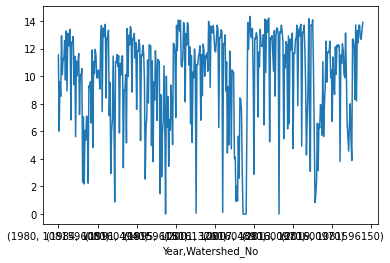

In [194]:
Watershed.groupby(['Year','Watershed_No']).mean()['Yield (tonne/ha)'].plot()

In [179]:
Watershed.set_index('Year', inplace=True)

In [182]:
Watershed['Yield (tonne/ha)'].

Year
1980     8.076190
1981    12.567935
1982    10.336549
1983     5.098279
1984     9.685371
          ...    
2011    12.186476
2012     2.363092
2013    11.974454
2014    10.884961
2015     6.223196
Name: Yield (tonne/ha), Length: 1412, dtype: float64

In [180]:
Watershed.groupby('Watershed_No')[]

In [158]:
Watershed.Lat.unique()

array(['-26.00', '-26.10'], dtype=object)

In [159]:
Watershed.Lon.unique()

array(['31.60'], dtype=object)

In [90]:
planting_dates = {}
for year in SiteFile.Date.dt.year.unique():
    if year != 2022:
        year_clim = SiteFile.set_index('Date').loc['{}'.format(year)]
        year_clim.reset_index(inplace=True)
        plant_date = get_plantdate(lat=lat, lon=lon, crop=cropname, irr_stat=irr_status, weatherfile=year_clim)
        start_window = pd.to_datetime(plant_date, infer_datetime_format=True)-pd.DateOffset(90)
        end_window = pd.to_datetime(plant_date, infer_datetime_format=True)+pd.DateOffset(90)
        window_clim = year_clim.set_index('Date').resample('7D').sum()
        arex = window_clim[start_window:end_window].loc[window_clim['Precipitation']>25].index[0]
        planting_dates[year] = arex.strftime("%m-%d")
        start_sim = arex-pd.DateOffset(90)

In [94]:
f'{1979}/01/01'

'1979/01/01'

In [96]:
start_sim.strftime('%Y/%m/%d')

'2021/07/03'

In [92]:
planting_dates.get(2021)

'10-01'

In [76]:
year_clim

,MinTemp,MaxTemp,Precipitation,ReferenceET
Date,,,,
2022-01-01,18.949524,32.527130,2.48,5.636418
2022-01-02,21.322418,27.044098,0.63,3.841484
2022-01-03,21.367950,28.580872,0.89,3.679201
2022-01-04,21.850250,31.236115,4.42,5.101156
2022-01-05,21.454620,33.520752,2.58,6.194154
...,...,...,...,...
2022-10-11,20.059265,33.020111,0.02,6.569203
2022-10-12,19.280334,35.889679,0.00,6.864384
2022-10-13,19.834961,35.599304,0.00,6.884019


In [55]:
start_date = pd.to_datetime(plant_date, infer_datetime_format=True)-pd.DateOffset(90)
end_date = pd.to_datetime(plant_date, infer_datetime_format=True)+pd.DateOffset(90)

In [58]:
TestClim = SiteFile.set_index('Date').resample('7D').sum()

In [61]:
arex = TestClim[start_date:end_date].loc[TestClim['Precipitation']>25]

In [65]:
arex.index[0]

Timestamp('1979-08-27 00:00:00')

In [46]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
          {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]

for scenario in Scenario:
    print(scenario.get('Name'))
    for wshed in country_wsheds.hybas_id.unique()[1:2]:
        n_wshed = country_wsheds.loc[country_wsheds.hybas_id == wshed]
        clipped = gpd.sjoin(gridpoints, n_wshed, predicate='within')
        if len(clipped) >0:
            for idx, row in clipped.iterrows():
                lon = "{:.2f}".format(float(row.geometry.x))
                lat = "{:.2f}".format(float(row.geometry.y))
                # Metadata
                cropname = scenario.get('Crop')
                irr_status = scenario.get('Irrigation')
                # Root Zone Depth
                pnt_rootzoneD = gyga_rootzonedepth_country.sel(x=lon,y=lat,  method="nearest")
                pnt_rootzoneD = int(pnt_rootzoneD.band_data.values) / 100
                # Elevation
                try:
                    Elevation = altitudo(lat=[lat], lon=[lon])
                    Elevation = Elevation[0].get('elevation')
                except:
                    print('Something wrong with elevation')
                # Soil profile
                try:
                    point_soil = get_soil_profile(lon=lon, lat=lat)
                except:
                    print('Didnt work for', lat,lon)
               # Climate
                SiteFile = get_climate(lat=lat, lon=lon)
                # Planting date
                plant_date = get_plantdate(lat=lat, lon=lon, crop=cropname, irr_stat=irr_status)
                
                if plant_date == '01-01':
                    plant_date = '01-02'
    
                print('Running watershed number:',wshed, 'Lat: ',lat, 'Lon: ',lon,'Elevation:',
                      Elevation,'Plant Date:', plant_date, 'Crop', cropname)
                
                # Crop
                if cropname == 'Maize':
                    crop_sim = Crop('Maize', planting_date='{}'.format(plant_date), Zmax=pnt_rootzoneD)
                else:
                    crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(plant_date))
                    
                # Initial water
                InitWC = InitialWaterContent(value=['FC'])
    
                # Irrigation
                irr_num = scenario.get('IrrNum')
                soilmt = scenario.get('SMT')
                
                if soilmt is None:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
                else:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))
            
                # Run the model
                model = AquaCropModel(sim_start_time=f'{1979}/01/01',
                          sim_end_time=f'{2021}/12/31',
                          weather_df=SiteFile,
                          soil=point_soil,
                          crop=crop_sim,
                          initial_water_content=InitWC,
                          irrigation_management=net_irrigation)
                try:
                    model.run_model(till_termination=True)
                except:
                    traceback_output = traceback.format_exc()
                    print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                
                out = model._outputs.final_stats
                out['Lat'] = lat
                out['Lon'] = lon
                out['Watershed_No'] = wshed
                scene = str(scenario.get('Name'))
                out['Scenario'] = scene
                out['Harvest Date (YYYY/MM/DD)'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
                # Write to csv
                out.to_csv(os.path.join(DataDir,'Output','CSVs','{}_{}_{}_yield.csv'.format(cropname, scene, wshed)))

dataset = aggregate_yields('Output/CSVs')
dataset = dataset.rename_vars({'Yield (t/ha)':'Yield'})
dataset.to_netcdf(os.path.join(DataDir,'Output','NetCDF','Swaziland_Yields.nc'))

High_Input
Calculating Evapotranspiration
Running watershed number: 1081600970 Lat:  -26.00 Lon:  32.00 Elevation: 459.0 Plant Date: 01-02 Crop SugarCane
High_Input
Calculating Evapotranspiration
Running watershed number: 1081600970 Lat:  -26.00 Lon:  32.00 Elevation: 459.0 Plant Date: 11-01 Crop Maize
High_Input
Calculating Evapotranspiration
Running watershed number: 1081600970 Lat:  -26.00 Lon:  32.00 Elevation: 459.0 Plant Date: 12-01 Crop Sorghum
Low_Input
Calculating Evapotranspiration
Running watershed number: 1081600970 Lat:  -26.00 Lon:  32.00 Elevation: 459.0 Plant Date: 11-01 Crop Maize
Low_Input
Calculating Evapotranspiration
Running watershed number: 1081600970 Lat:  -26.00 Lon:  32.00 Elevation: 459.0 Plant Date: 01-02 Crop SugarCane
Low_Input
Calculating Evapotranspiration
Running watershed number: 1081600970 Lat:  -26.00 Lon:  32.00 Elevation: 459.0 Plant Date: 12-01 Crop Sorghum


ValueError: cannot convert a DataFrame with a non-unique MultiIndex into xarray

In [53]:
def get_plantdate(lat, lon, crop, irr_stat, weatherfile):
    calendar = xr.open_dataset(os.path.join(DataDir,'Crop/Crop_Calendar/{}_{}_ggcmi_crop_calendar_phase3_v1.01.nc4').format(crop, irr_stat))
    pnt_date = calendar.sel(lon=lon,lat=lat,  method="nearest")
    pnt_date = pnt_date.planting_day.values
    sdate = weatherfile.Date.dt.year.unique()[0]
    strt_date = date(int(sdate), 1, 1)
    plant_date = strt_date + timedelta(days=int(pnt_date) - 1)
    plant_date = plant_date.strftime("%m-%d")
    return(plant_date)

In [54]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'SugarCane', 'Irrigation':'ir'},
              {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Sorghum', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'SugarCane', 'Irrigation':'rf'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Sorghum', 'Irrigation':'rf'}]

for scenario in Scenario:
    print(scenario.get('Name'))
    for wshed in country_wsheds.hybas_id.unique():
        n_wshed = country_wsheds.loc[country_wsheds.hybas_id == wshed]
        clipped = gpd.sjoin(gridpoints, n_wshed, predicate='within')
        if len(clipped) >0:
            for idx, row in clipped.iterrows():
                lon = "{:.2f}".format(float(row.geometry.x))
                lat = "{:.2f}".format(float(row.geometry.y))
                # Metadata
                cropname = scenario.get('Crop')
                irr_status = scenario.get('Irrigation')
                # Root Zone Depth
                pnt_rootzoneD = gyga_rootzonedepth_country.sel(x=lon,y=lat,  method="nearest")
                pnt_rootzoneD = int(pnt_rootzoneD.band_data.values) / 100
                # Elevation
                try:
                    Elevation = altitudo(lat=[lat], lon=[lon])
                    Elevation = Elevation[0].get('elevation')
                except:
                    print('Something wrong with elevation')
                # Soil profile
                try:
                    point_soil = get_soil_profile(lon=lon, lat=lat)
                except:
                    print('Didnt work for', lat,lon)
               # Climate
                SiteFile = get_climate(lat=lat, lon=lon)
                # Planting date
                plant_date = get_plantdate(lat=lat, lon=lon, crop=cropname, irr_stat=irr_status, weatherfile=SiteFile)
                
                print(plant_date)
                if plant_date == '01-01':
                    plant_date = '01-02'
    
                print('Running watershed number:',wshed, 'Lat: ',lat, 'Lon: ',lon,'Elevation:',
                      Elevation,'Plant Date:', plant_date, 'Crop', cropname)
                
                # Crop
                if cropname == 'Maize':
                    crop_sim = Crop('Maize', planting_date='{}'.format(plant_date), Zmax=pnt_rootzoneD)
                else:
                    crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(plant_date))
                    
                # Initial water
                InitWC = InitialWaterContent(value=['FC'])
    
                # Irrigation
                irr_num = scenario.get('IrrNum')
                soilmt = scenario.get('SMT')
                
                if soilmt is None:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
                else:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))
            
                # Run the model
                model = AquaCropModel(sim_start_time=f'{1979}/01/01',
                          sim_end_time=f'{2021}/12/31',
                          weather_df=SiteFile,
                          soil=point_soil,
                          crop=crop_sim,
                          initial_water_content=InitWC,
                          irrigation_management=net_irrigation)
                try:
                    model.run_model(till_termination=True)
                except:
                    traceback_output = traceback.format_exc()
                    print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                
                out = model._outputs.final_stats
                out['Lat'] = lat
                out['Lon'] = lon
                out['Watershed_No'] = wshed
                scene = str(scenario.get('Name'))
                out['Scenario'] = scene
                out['Harvest Date (YYYY/MM/DD)'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
                # Write to csv
                out.to_csv(os.path.join(DataDir,'Output','CSVs','{}_{}_{}_yield.csv'.format(cropname, scene, wshed)))

#dataset = aggregate_yields('Output/CSVs')
#dataset = dataset.rename_vars({'Yield (t/ha)':'Yield'})
#dataset.to_netcdf(os.path.join(DataDir,'Output','NetCDF','Swaziland_Yields.nc'))

High_Input
Calculating Evapotranspiration
01-01
Running watershed number: 1081599280 Lat:  -26.00 Lon:  31.60 Elevation: 331.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081599280 Lat:  -26.10 Lon:  31.60 Elevation: 404.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600970 Lat:  -26.00 Lon:  32.00 Elevation: 459.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600610 Lat:  -26.00 Lon:  31.40 Elevation: 819.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600610 Lat:  -26.00 Lon:  31.50 Elevation: 383.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600320 Lat:  -26.00 Lon:  31.10 Elevation: 974.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081599210 Lat:  -25.90 Lon:  31

Calculating Evapotranspiration
01-01
Running watershed number: 1081609490 Lat:  -27.00 Lon:  31.00 Elevation: 1226.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609490 Lat:  -27.00 Lon:  31.10 Elevation: 1006.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609490 Lat:  -27.00 Lon:  31.20 Elevation: 965.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609490 Lat:  -27.10 Lon:  31.10 Elevation: 1026.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081608200 Lat:  -26.90 Lon:  31.60 Elevation: 356.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081608200 Lat:  -26.90 Lon:  31.70 Elevation: 251.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081608200 Lat:  -26.90 Lon:  31.80 Elev

Calculating Evapotranspiration
01-01
Running watershed number: 1081605930 Lat:  -26.30 Lon:  31.00 Elevation: 1363.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605930 Lat:  -26.30 Lon:  31.10 Elevation: 1371.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605930 Lat:  -26.40 Lon:  31.00 Elevation: 1417.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605930 Lat:  -26.40 Lon:  31.10 Elevation: 1104.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605930 Lat:  -26.40 Lon:  31.20 Elevation: 743.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605930 Lat:  -26.40 Lon:  31.30 Elevation: 775.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605930 Lat:  -26.50 Lon:  31.20 Ele

Calculating Evapotranspiration
10-17
Running watershed number: 1081600610 Lat:  -26.00 Lon:  31.50 Elevation: 383.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081600320 Lat:  -26.00 Lon:  31.10 Elevation: 974.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081599210 Lat:  -25.90 Lon:  31.50 Elevation: 451.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081596150 Lat:  -25.90 Lon:  31.60 Elevation: 350.0 Plant Date: 10-17 Crop Maize
Didnt work for -26.00 31.70
Calculating Evapotranspiration
10-17
Running watershed number: 1081596150 Lat:  -26.00 Lon:  31.70 Elevation: 322.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081596080 Lat:  -25.80 Lon:  31.30 Elevation: 604.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081596080 Lat:  -25.80 Lon:  31.40 Ele

Calculating Evapotranspiration
10-17
Running watershed number: 1081608210 Lat:  -26.80 Lon:  31.90 Elevation: 168.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
11-01
Running watershed number: 1081608210 Lat:  -26.80 Lon:  32.00 Elevation: 228.5 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
11-01
Running watershed number: 1081608210 Lat:  -26.80 Lon:  32.10 Elevation: 213.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608210 Lat:  -26.90 Lon:  31.90 Elevation: 177.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
11-01
Running watershed number: 1081607320 Lat:  -26.70 Lon:  32.10 Elevation: 351.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.40 Lon:  31.80 Elevation: 319.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.50 Lon:  31.50 Elevation: 501.0 Plant Date: 10

Calculating Evapotranspiration
10-17
Running watershed number: 1081601830 Lat:  -26.30 Lon:  31.90 Elevation: 277.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
11-01
Running watershed number: 1081601830 Lat:  -26.30 Lon:  32.00 Elevation: 498.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081601830 Lat:  -26.40 Lon:  31.90 Elevation: 397.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081601360 Lat:  -26.00 Lon:  31.80 Elevation: 283.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081601360 Lat:  -26.10 Lon:  31.70 Elevation: 302.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081601360 Lat:  -26.10 Lon:  31.80 Elevation: 234.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081601360 Lat:  -26.20 Lon:  31.10 Elevation: 1452.0 Plant Date: 1

Calculating Evapotranspiration
11-21
Running watershed number: 1081604890 Lat:  -26.40 Lon:  30.90 Elevation: 1437.0 Plant Date: 11-21 Crop Sorghum
Calculating Evapotranspiration
11-21
Running watershed number: 1081604890 Lat:  -26.50 Lon:  30.90 Elevation: 1214.0 Plant Date: 11-21 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081613260 Lat:  -27.20 Lon:  31.60 Elevation: 548.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081613260 Lat:  -27.20 Lon:  31.70 Elevation: 352.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081613260 Lat:  -27.30 Lon:  31.50 Elevation: 753.5 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081613260 Lat:  -27.30 Lon:  31.60 Elevation: 298.5 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081613260 Lat:  -27.30 Lon:  31.70 Elevation: 278.0 

Calculating Evapotranspiration
12-16
Running watershed number: 1081608140 Lat:  -26.50 Lon:  31.70 Elevation: 376.5 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081608140 Lat:  -26.50 Lon:  31.80 Elevation: 251.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081608140 Lat:  -26.60 Lon:  31.50 Elevation: 381.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081608140 Lat:  -26.60 Lon:  31.60 Elevation: 345.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081608140 Lat:  -26.60 Lon:  31.70 Elevation: 296.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081608140 Lat:  -26.60 Lon:  31.80 Elevation: 251.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081608140 Lat:  -26.70 Lon:  31.50 Elevation: 372.5 Pl

Calculating Evapotranspiration
12-16
Running watershed number: 1081601360 Lat:  -26.20 Lon:  31.20 Elevation: 1282.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081601360 Lat:  -26.20 Lon:  31.50 Elevation: 531.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081601360 Lat:  -26.20 Lon:  31.60 Elevation: 329.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081601360 Lat:  -26.30 Lon:  31.20 Elevation: 1178.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081601360 Lat:  -26.30 Lon:  31.30 Elevation: 823.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081601360 Lat:  -26.30 Lon:  31.40 Elevation: 652.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081600560 Lat:  -26.20 Lon:  31.00 Elevation: 1458.5

Calculating Evapotranspiration
10-17
Running watershed number: 1081613850 Lat:  -27.20 Lon:  31.20 Elevation: 947.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081613210 Lat:  -27.20 Lon:  31.80 Elevation: 381.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081613210 Lat:  -27.20 Lon:  31.90 Elevation: 215.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081613210 Lat:  -27.30 Lon:  31.80 Elevation: 325.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081613210 Lat:  -27.30 Lon:  31.90 Elevation: 166.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081609500 Lat:  -27.00 Lon:  31.30 Elevation: 871.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081609500 Lat:  -27.00 Lon:  31.40 Elevation: 713.0 Plant Date: 10

Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.70 Lon:  31.70 Elevation: 211.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.70 Lon:  31.80 Elevation: 212.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.80 Lon:  31.40 Elevation: 768.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.80 Lon:  31.50 Elevation: 784.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.80 Lon:  31.60 Elevation: 284.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.80 Lon:  31.70 Elevation: 270.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081608140 Lat:  -26.80 Lon:  31.80 Elevation: 169.0 Plant Date: 10

Calculating Evapotranspiration
11-01
Running watershed number: 1081601690 Lat:  -26.10 Lon:  32.00 Elevation: 207.5 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081601690 Lat:  -26.20 Lon:  31.90 Elevation: 235.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081600680 Lat:  -26.00 Lon:  31.20 Elevation: 898.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081600680 Lat:  -26.00 Lon:  31.30 Elevation: 835.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081600680 Lat:  -26.10 Lon:  31.10 Elevation: 1131.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081600680 Lat:  -26.10 Lon:  31.20 Elevation: 1014.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
10-17
Running watershed number: 1081600680 Lat:  -26.10 Lon:  31.30 Elevation: 672.5 Plant Date: 

Calculating Evapotranspiration
01-01
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.20 Elevation: 1075.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.30 Elevation: 870.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.40 Elevation: 620.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.50 Elevation: 642.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.60 Elevation: 476.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.70 Elevation: 365.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.80 Elevat

Calculating Evapotranspiration
01-01
Running watershed number: 1081608140 Lat:  -26.80 Lon:  31.80 Elevation: 169.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081608140 Lat:  -26.90 Lon:  31.40 Elevation: 719.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081608140 Lat:  -26.90 Lon:  31.50 Elevation: 539.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081606140 Lat:  -26.60 Lon:  31.40 Elevation: 429.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605920 Lat:  -26.50 Lon:  31.00 Elevation: 1085.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605920 Lat:  -26.50 Lon:  31.10 Elevation: 1203.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081605920 Lat:  -26.60 Lon:  31.00 Eleva

Calculating Evapotranspiration
01-01
Running watershed number: 1081600680 Lat:  -26.10 Lon:  31.10 Elevation: 1131.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600680 Lat:  -26.10 Lon:  31.20 Elevation: 1014.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600680 Lat:  -26.10 Lon:  31.30 Elevation: 672.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600680 Lat:  -26.10 Lon:  31.40 Elevation: 478.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600680 Lat:  -26.10 Lon:  31.50 Elevation: 386.5 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600680 Lat:  -26.20 Lon:  31.30 Elevation: 882.0 Plant Date: 01-02 Crop SugarCane
Calculating Evapotranspiration
01-01
Running watershed number: 1081600680 Lat:  -26.20 Lon:  31.40 Eleva

Calculating Evapotranspiration
12-16
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.70 Elevation: 365.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.80 Elevation: 302.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081609500 Lat:  -27.10 Lon:  31.90 Elevation: 237.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
11-21
Running watershed number: 1081609500 Lat:  -27.20 Lon:  31.30 Elevation: 943.0 Plant Date: 11-21 Crop Sorghum
Calculating Evapotranspiration
11-21
Running watershed number: 1081609500 Lat:  -27.20 Lon:  31.40 Elevation: 783.0 Plant Date: 11-21 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081609500 Lat:  -27.20 Lon:  31.50 Elevation: 670.5 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081609490 Lat:  -27.00 Lon:  31.00 Elevation: 1226.0 P

Calculating Evapotranspiration
12-16
Running watershed number: 1081605920 Lat:  -26.60 Lon:  31.00 Elevation: 1379.5 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081605920 Lat:  -26.60 Lon:  31.10 Elevation: 881.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081605920 Lat:  -26.60 Lon:  31.20 Elevation: 692.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081605920 Lat:  -26.60 Lon:  31.30 Elevation: 495.0 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
11-21
Running watershed number: 1081605930 Lat:  -26.30 Lon:  30.90 Elevation: 1471.5 Plant Date: 11-21 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081605930 Lat:  -26.30 Lon:  31.00 Elevation: 1363.5 Plant Date: 12-16 Crop Sorghum
Calculating Evapotranspiration
12-16
Running watershed number: 1081605930 Lat:  -26.30 Lon:  31.10 Elevation: 1371.

In [43]:
Scenario =  [{'Name':'High_Input','IrrNum':'4','SMT':'70','Crop':'Maize', 'Irrigation':'ir'},
            {'Name':'Low_Input','IrrNum':'0','Crop':'Maize', 'Irrigation':'rf'}]

for scenario in Scenario:
    print(scenario.get('Name'))
    for wshed in country_wsheds.hybas_id.unique():
        n_wshed = country_wsheds.loc[country_wsheds.hybas_id == wshed]
        clipped = gpd.sjoin(gridpoints, n_wshed, predicate='within')
        if len(clipped) >0:
            for idx, row in clipped.iterrows():
                lon = "{:.2f}".format(float(row.geometry.x))
                lat = "{:.2f}".format(float(row.geometry.y))
                # Metadata
                cropname = scenario.get('Crop')
                irr_status = scenario.get('Irrigation')
                # Root Zone Depth
                pnt_rootzoneD = gyga_rootzonedepth_country.sel(x=lon,y=lat,  method="nearest")
                pnt_rootzoneD = int(pnt_rootzoneD.band_data.values) / 100
                # Elevation
                try:
                    Elevation = altitudo(lat=[lat], lon=[lon])
                    Elevation = Elevation[0].get('elevation')
                except:
                    print('Something wrong with elevation')
                # Soil profile
                try:
                    point_soil = get_soil_profile(lon=lon, lat=lat)
                except:
                    print('Didnt work for', lat,lon)
               # Climate
                SiteFile = get_climate(lat=lat, lon=lon)
                # Planting date
                plant_date = get_plantdate(lat=lat, lon=lon, crop=cropname, irr_stat=irr_status)
                
                if plant_date == '01-01':
                    plant_date = '01-02'
    
                print('Running watershed number:',wshed, 'Lat: ',lat, 'Lon: ',lon,'Elevation:',
                      Elevation,'Plant Date:', plant_date, 'Crop', cropname)
                
                # Crop
                if cropname == 'Maize':
                    crop_sim = Crop('Maize', planting_date='{}'.format(plant_date), Zmax=pnt_rootzoneD)
                else:
                    crop_sim = Crop('{}'.format(cropname), planting_date='{}'.format(plant_date))
                    
                # Initial water
                InitWC = InitialWaterContent(value=['FC'])
    
                # Irrigation
                irr_num = scenario.get('IrrNum')
                soilmt = scenario.get('SMT')
                
                if soilmt is None:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num))
                else:
                    net_irrigation = IrrigationManagement(irrigation_method=int(irr_num),SMT=str(soilmt))
            
                # Run the model
                model = AquaCropModel(sim_start_time=f'{1979}/01/01',
                          sim_end_time=f'{2021}/12/31',
                          weather_df=SiteFile,
                          soil=point_soil,
                          crop=crop_sim,
                          initial_water_content=InitWC,
                          irrigation_management=net_irrigation)
                try:
                    model.run_model(till_termination=True)
                except:
                    traceback_output = traceback.format_exc()
                    print('Model didnt run for:', lat,lon,'Error:', traceback_output)
                
                out = model._outputs.final_stats
                out['Lat'] = lat
                out['Lon'] = lon
                out['Watershed_No'] = wshed
                scene = str(scenario.get('Name'))
                out['Scenario'] = scene
                out['Harvest Date (YYYY/MM/DD)'] = out['Harvest Date (YYYY/MM/DD)'].dt.year
                # Write to csv
                out.to_csv(os.path.join(DataDir,'Output','CSVs','{}_{}_{}_yield.csv'.format(cropname, scene, wshed)))

dataset = aggregate_yields('Output/CSVs')
dataset = dataset.rename_vars({'Yield (t/ha)':'Yield'})
dataset.to_netcdf(os.path.join(DataDir,'Output','NetCDF','Swaziland_Yields.nc'))

High_Input
Calculating Evapotranspiration
Running watershed number: 1081599280 Lat:  -26.00 Lon:  31.60 Elevation: 331.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081599280 Lat:  -26.10 Lon:  31.60 Elevation: 404.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081600970 Lat:  -26.00 Lon:  32.00 Elevation: 459.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081600610 Lat:  -26.00 Lon:  31.40 Elevation: 819.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081600610 Lat:  -26.00 Lon:  31.50 Elevation: 383.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081600320 Lat:  -26.00 Lon:  31.10 Elevation: 974.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081599210 Lat:  -25.90 Lon:  31.50 Elevation: 451.0 Plant Date: 10-17 Crop Maize
Calculating Evap

Running watershed number: 1081609490 Lat:  -27.10 Lon:  31.10 Elevation: 1026.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608200 Lat:  -26.90 Lon:  31.60 Elevation: 356.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608200 Lat:  -26.90 Lon:  31.70 Elevation: 251.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608200 Lat:  -26.90 Lon:  31.80 Elevation: 213.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608200 Lat:  -27.00 Lon:  31.50 Elevation: 860.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608200 Lat:  -27.00 Lon:  31.60 Elevation: 491.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608200 Lat:  -27.00 Lon:  31.70 Elevation: 314.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 

Calculating Evapotranspiration
Running watershed number: 1081605930 Lat:  -26.50 Lon:  31.30 Elevation: 619.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081605930 Lat:  -26.50 Lon:  31.40 Elevation: 607.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1080012770 Lat:  -26.40 Lon:  32.00 Elevation: 539.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1080012770 Lat:  -26.50 Lon:  32.00 Elevation: 559.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1080012770 Lat:  -26.50 Lon:  32.10 Elevation: 329.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1080012770 Lat:  -26.60 Lon:  32.10 Elevation: 347.5 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081601440 Lat:  -26.20 Lon:  31.70 Elevation: 328.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspirat

Running watershed number: 1081596080 Lat:  -25.90 Lon:  31.40 Elevation: 781.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081606440 Lat:  -26.60 Lon:  30.80 Elevation: 1397.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081606440 Lat:  -26.60 Lon:  30.90 Elevation: 1415.0 Plant Date: 10-17 Crop Maize
Something wrong with elevation
Calculating Evapotranspiration
Running watershed number: 1081606440 Lat:  -26.70 Lon:  30.80 Elevation: 1415.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081606440 Lat:  -26.70 Lon:  30.90 Elevation: 1173.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081606440 Lat:  -26.70 Lon:  31.00 Elevation: 1118.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081606440 Lat:  -26.70 Lon:  31.10 Elevation: 979.0 Plant Date: 10-17 Crop Maize
Calculating Evapotrans

Calculating Evapotranspiration
Running watershed number: 1081608210 Lat:  -26.60 Lon:  31.90 Elevation: 253.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608210 Lat:  -26.60 Lon:  32.00 Elevation: 538.5 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608210 Lat:  -26.70 Lon:  31.90 Elevation: 210.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608210 Lat:  -26.70 Lon:  32.00 Elevation: 337.5 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608210 Lat:  -26.80 Lon:  31.90 Elevation: 168.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608210 Lat:  -26.80 Lon:  32.00 Elevation: 228.5 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081608210 Lat:  -26.80 Lon:  32.10 Elevation: 213.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspirat

Calculating Evapotranspiration
Running watershed number: 1081601440 Lat:  -26.40 Lon:  31.70 Elevation: 403.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081601830 Lat:  -26.20 Lon:  32.00 Elevation: 182.5 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081601830 Lat:  -26.30 Lon:  31.90 Elevation: 277.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081601830 Lat:  -26.30 Lon:  32.00 Elevation: 498.0 Plant Date: 11-01 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081601830 Lat:  -26.40 Lon:  31.90 Elevation: 397.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081601360 Lat:  -26.00 Lon:  31.80 Elevation: 283.0 Plant Date: 10-17 Crop Maize
Calculating Evapotranspiration
Running watershed number: 1081601360 Lat:  -26.10 Lon:  31.70 Elevation: 302.5 Plant Date: 10-17 Crop Maize
Calculating Evapotranspirat

ValueError: cannot convert a DataFrame with a non-unique MultiIndex into xarray

In [45]:
out_files = glob.glob(os.path.join(DataDir,'Output/CSVs','*Maize.csv'))

country_yield = pd.DataFrame()
for file in out_files:
    dftmp = pd.read_csv(file, index_col=3)
    dftmp = dftmp[['crop Type',
       'Yield (tonne/ha)', 'Lat', 'Lon',
       'Watershed_No', 'Scenario']]
    if len(country_yield) == 0:
        country_yield = dftmp
    else:
        country_yield = pd.concat([country_yield, dftmp])

In [46]:
country_yield.reset_index(inplace=True)

In [47]:
test = country_yield.groupby(['Harvest Date (YYYY/MM/DD)','Scenario','Watershed_No']).mean()

KeyError: 'Harvest Date (YYYY/MM/DD)'

In [ ]:
test.reset_index(inplace=True)

In [43]:
test.set_index('Harvest Date (YYYY/MM/DD)', inplace=True)

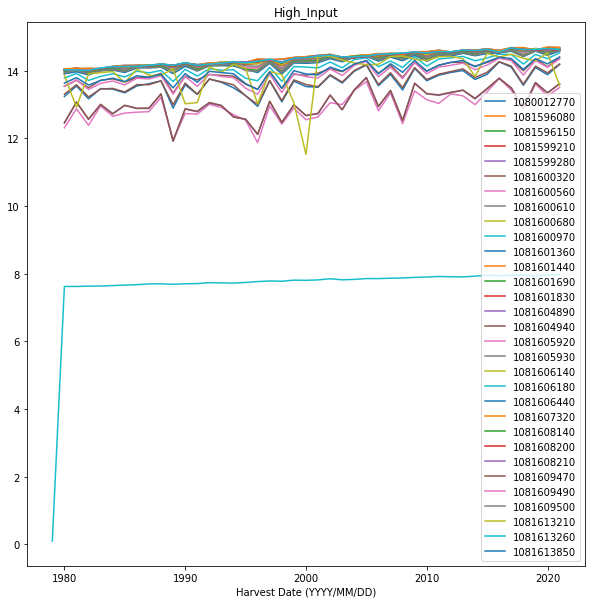

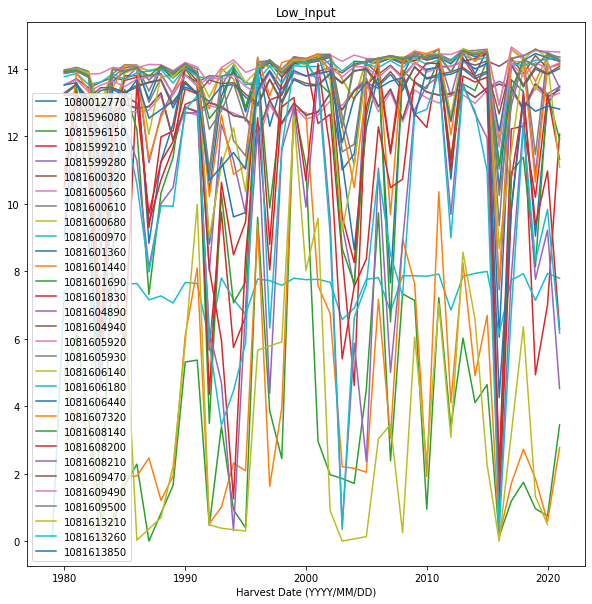

In [44]:
for i in test.Scenario.unique():
    fig, ax = plt.subplots()
    dftmp = test.loc[test['Scenario']==i]
    dftmp.groupby('Watershed_No')['Yield (tonne/ha)'].plot(ax=ax, title=i, figsize=(10,10))
    plt.legend()

In [49]:
country_yield.reset_index(inplace=True)

test = country_yield.groupby(['Lat','Lon','Scenario','Harvest Date (YYYY/MM/DD)','Watershed_No']).mean()



In [58]:
ds

<xarray.Dataset>
Dimensions:                    (Harvest Date (YYYY/MM/DD): 42, Lat: 15,
                                Lon: 14, Watershed_No: 31, Scenario: 2)
Coordinates:
  * Harvest Date (YYYY/MM/DD)  (Harvest Date (YYYY/MM/DD)) int64 1980 ... 2021
  * Lat                        (Lat) float64 -27.3 -27.2 -27.1 ... -26.0 -25.9
  * Lon                        (Lon) float64 30.8 30.9 31.0 ... 31.9 32.0 32.1
  * Watershed_No               (Watershed_No) int64 1080012770 ... 1081613850
  * Scenario                   (Scenario) object 'High_Input' 'Low_Input'
Data variables:
    Yield (tonne/ha)           (Harvest Date (YYYY/MM/DD), Lat, Lon, Watershed_No, Scenario) float64 ...

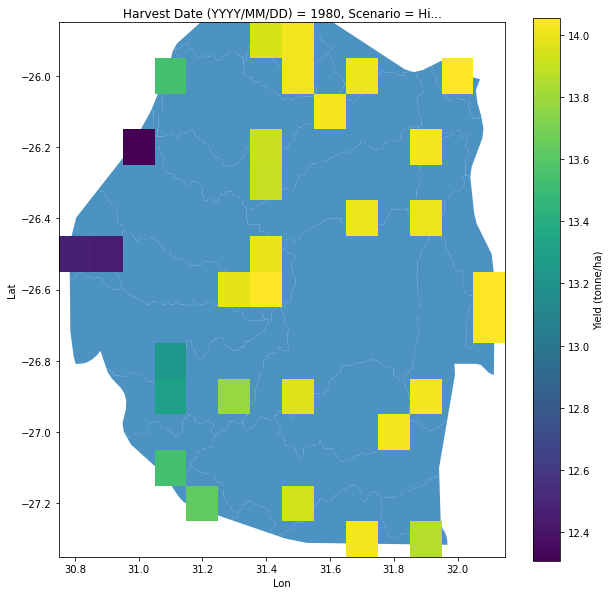

In [94]:
ds['Yield (tonne/ha)']

testds = ds['Yield (tonne/ha)'].mean(dim='Watershed_No')

fig, ax = plt.subplots(figsize=(10,10))

country_wsheds.plot(ax=ax, alpha=0.8)

testds[0,:,:,0].plot()

High_Input
Calculating Evapotranspiration
Running watershed number: 1081599280 Lat:  -26.00 Lon:  31.60 Elevation: 331.0 Plant Date: 01-02 Crop SugarCane
Model didnt run for: -26.00 31.60 Error: Traceback (most recent call last):
  File "/tmp/ipykernel_3408/4197091001.py", line 72, in <cell line: 8>
    model.run_model(till_termination=True)
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 285, in run_model
    ) = self._perform_timestep()
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/core.py", line 331, in _perform_timestep
    new_cond, param_struct, outputs = solution_single_time_step(
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/aquacrop/timestep/run_single_timestep.py", line 534, in solution_single_time_step
    outputs.final_stats.loc[row_gs] = [
  File "/home/c4ubuntu/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py", line 716, in __setitem__
    iloc._setitem_with_indexer(indexer, value, se


KeyboardInterrupt



# Default testing

In [ ]:
custom = Soil('custom',cn=46,rew=7)

custom.add_layer(thickness=0.15,thWP=0.24,
                 thFC=0.40,thS=0.50,Ksat=155,
                 penetrability=100)

custom.add_layer_from_texture(thickness=0.3,
                              Sand=10,Clay=35,
                              OrgMat=2.5,penetrability=100)

custom.add_layer_from_texture(thickness=0.6,
                              Sand=20,Clay=45,
                              OrgMat=2.5,penetrability=100)

custom.add_layer_from_texture(thickness=1.0,
                              Sand=20,Clay=45,
                              OrgMat=2.5,penetrability=100)

custom.add_layer_from_texture(thickness=2.0,
                              Sand=20,Clay=45,
                              OrgMat=2.5,penetrability=100)


custom.profile

weather = pd.read_csv(os.path.join(DataDir,'Climate/04_sitefiles/AgERA5_Big_Bend.csv'), index_col=0, parse_dates=['Date'])

weather_data = weather

In [ ]:
Sites = [{'Name':'Big_Bend','Soil':'SandyLoam','Crop':'SugerCane'}]

for site in Sites:
    name = site.get('Name')
    print(name)

# Soil

sandy_loam = Soil(soil_type='SandyLoam')
clay_loam = Soil(soil_type='ClayLoam')

# Crop

maize = Crop('Maize', planting_date='10/01')
sugercane = Crop('SugarCane', planting_date='11/1', harvest_date='04/10',CGC=0.420,
                 CDC=0.226,
                 PlantPop=100000)


# Initial water
InitWC = InitialWaterContent(value=['FC'])

# Irrigation

#net_irrigation = IrrigationManagement(irrigation_method=4,NetIrrSMT=70)

net_irrigation = IrrigationManagement(irrigation_method=0)


# combine into aquacrop model and specify start and end simulation date
model = AquaCropModel(sim_start_time=f'{1979}/01/01',
                      sim_end_time=f'{2022}/01/01',
                      weather_df=weather_data,
                      soil=custom,
                      crop=maize,
                      initial_water_content=InitWC)

# run model till termination
model.run_model(till_termination=True)

# model._outputs.water_flux.head()
# model._outputs.water_storage.head()
#model._outputs.crop_growth.head()
model._outputs.final_stats.head()

# Weather

In [127]:
weather = pd.read_csv(os.path.join(DataDir,'Climate/04_sitefiles/AgERA5_Big_Bend.csv'), index_col=0, parse_dates=['Date'])

In [128]:
weather_data = weather

## Define the sites and parameters we need to model

Here we automate the modelling process. The input parameters for a given site is specified and modelled.

In [129]:
Sites = [{'Name':'Big_Bend','Soil':'SandyLoam','Crop':'SugerCane'}]

for site in Sites:
    name = site.get('Name')
    print(name)

Big_Bend


In [130]:
# Soil

sandy_loam = Soil(soil_type='SandyLoam')
clay_loam = Soil(soil_type='ClayLoam')

# Crop

maize = Crop('Maize', planting_date='10/01')
sugercane = Crop('SugarCane', planting_date='11/1', harvest_date='04/10',CGC=0.420,
                 CDC=0.226,
                 PlantPop=100000)


# Initial water
InitWC = InitialWaterContent(value=['FC'])

# Irrigation

#net_irrigation = IrrigationManagement(irrigation_method=4,NetIrrSMT=70)

net_irrigation = IrrigationManagement(irrigation_method=0)


In [131]:
# combine into aquacrop model and specify start and end simulation date
model = AquaCropModel(sim_start_time=f'{1979}/01/01',
                      sim_end_time=f'{2022}/01/01',
                      weather_df=weather_data,
                      soil=sandy_loam,
                      crop=maize,
                      initial_water_content=InitWC)

# run model till termination
model.run_model(till_termination=True)

# model._outputs.water_flux.head()
# model._outputs.water_storage.head()
#model._outputs.crop_growth.head()
model._outputs.final_stats.head()

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Yield (tonne/ha),Seasonal irrigation (mm)
0,0,Maize,1980-02-10,404,11.412894,0
1,1,Maize,1981-02-10,770,12.533013,0
2,2,Maize,1982-02-10,1135,11.115747,0
3,3,Maize,1983-02-10,1500,8.331252,0
4,4,Maize,1984-02-10,1865,12.664608,0


In [132]:
out = model._outputs.final_stats

In [133]:
out

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Yield (tonne/ha),Seasonal irrigation (mm)
0,0,Maize,1980-02-10,404,11.412894,0
1,1,Maize,1981-02-10,770,12.533013,0
2,2,Maize,1982-02-10,1135,11.115747,0
3,3,Maize,1983-02-10,1500,8.331252,0
4,4,Maize,1984-02-10,1865,12.664608,0
5,5,Maize,1985-02-10,2231,13.592043,0
6,6,Maize,1986-02-10,2596,13.751872,0
7,7,Maize,1987-02-10,2961,10.885517,0
8,8,Maize,1988-02-10,3326,12.623180,0
9,9,Maize,1989-02-10,3692,12.204667,0


## Weather station data

#### Big Bend

In [297]:
weather_bb = pd.read_excel(DataDir/'Weather/WW_Custom_CSW_554_20220920.xlsx', parse_dates=[1])
weather_bb.rename(columns={'Weather_Date':'Date','Min_Temp':'MinTemp','Max_Temp':'MaxTemp','Rainfall':'Precipitation','Daily_Evaporation':'ReferenceET'}, inplace=True)
weather_bb.drop(columns={'Station_ID','Wind', 'Temp_D8', 'Temp_W14', 'Temp_D14', 'Rel_Humidity_8',
       'Rel_Humidity_14', 'Min_Rel_Humidity', 'Max_Rel_Humidity',
       'Mean_Vapour', 'Apan_Evaporation',
       'Sunshine_Hours', 'Growth', 'Missing_Data_Code', 'SWC60', 'SWC100',
       'SWC140'}, inplace=True)
weather_bb = weather_bb[['MinTemp','MaxTemp','Precipitation', 'ReferenceET','Date']]

weather_data_bb = weather_bb.dropna(how='any')

In [346]:
weather_bb

,MinTemp,MaxTemp,Precipitation,ReferenceET,Date
0,18.06,29.08,0.0,4.40,1979-10-31
1,17.50,30.50,0.0,3.55,1979-11-01
2,16.50,31.00,0.0,5.44,1979-11-02
3,20.50,29.80,5.0,4.82,1979-11-03
4,20.30,37.30,0.0,6.86,1979-11-04
...,...,...,...,...,...
13538,18.80,39.50,0.0,7.83,2017-02-02
13539,24.60,35.50,0.0,8.09,2017-02-03
13540,20.00,36.00,0.0,7.88,2017-02-04
13541,21.50,38.80,0.0,8.28,2017-02-05


#### Mhlume RSSC 26'10'0, 31'48'0

In [298]:
weather_mh = pd.read_excel(DataDir/'Weather/WW_Custom_CSW_555_20220920.xlsx', parse_dates=[1])
weather_mh.rename(columns={'Weather_Date':'Date','Min_Temp':'MinTemp','Max_Temp':'MaxTemp','Rainfall':'Precipitation','Daily_Evaporation':'ReferenceET'}, inplace=True)
weather_mh.drop(columns={'Station_ID','Wind', 'Temp_D8', 'Temp_W14', 'Temp_D14', 'Rel_Humidity_8',
       'Rel_Humidity_14', 'Min_Rel_Humidity', 'Max_Rel_Humidity',
       'Mean_Vapour', 'Apan_Evaporation',
       'Sunshine_Hours', 'Growth', 'Missing_Data_Code', 'SWC60', 'SWC100',
       'SWC140'}, inplace=True)
weather_mh = weather_mh[['MinTemp','MaxTemp','Precipitation', 'ReferenceET','Date']]
weather_mh = weather_mh.dropna(how='any')

In [345]:
weather_mh

,MinTemp,MaxTemp,Precipitation,ReferenceET,Date
0,14.59,26.55,0.0,3.47,1968-04-30
1,15.80,30.50,0.0,4.42,1968-05-01
2,9.20,30.20,0.0,3.37,1968-05-02
3,12.70,32.10,0.0,3.80,1968-05-03
4,10.00,30.40,0.0,3.62,1968-05-04
...,...,...,...,...,...
17007,18.49,30.67,0.0,4.25,2014-11-22
17008,18.24,31.15,4.5,4.56,2014-11-23
17009,18.23,30.85,0.3,6.13,2014-11-24
17010,17.06,27.39,1.6,4.85,2014-11-25


#### Simunye Mlaula 26'12'0, 31'54'0

In [299]:
weather_sm = pd.read_excel(DataDir/'Weather/WW_Custom_CSW_553_20220920.xlsx', parse_dates=[1])
weather_sm.rename(columns={'Weather_Date':'Date','Min_Temp':'MinTemp','Max_Temp':'MaxTemp','Rainfall':'Precipitation','Daily_Evaporation':'ReferenceET'}, inplace=True)
weather_sm.drop(columns={'Station_ID','Wind', 'Temp_D8', 'Temp_W14', 'Temp_D14', 'Rel_Humidity_8',
       'Rel_Humidity_14', 'Min_Rel_Humidity', 'Max_Rel_Humidity',
       'Mean_Vapour', 'Apan_Evaporation',
       'Sunshine_Hours', 'Growth', 'Missing_Data_Code', 'SWC60', 'SWC100',
       'SWC140'}, inplace=True)
weather_sm = weather_sm[['MinTemp','MaxTemp','Precipitation', 'ReferenceET','Date']]

weather_sm = weather_sm.dropna(how='any')

In [344]:
weather_sm

,MinTemp,MaxTemp,Precipitation,ReferenceET,Date
0,14.29,26.74,0.0,3.14,1979-04-30
1,14.11,32.60,0.0,3.96,1979-05-01
2,19.00,32.90,0.0,5.14,1979-05-02
3,18.20,33.50,0.0,6.14,1979-05-03
4,19.90,28.40,0.0,5.18,1979-05-04
...,...,...,...,...,...
13715,17.75,36.06,0.0,6.79,2017-02-02
13716,21.40,33.28,0.0,7.38,2017-02-03
13717,19.39,34.02,0.0,7.44,2017-02-04
13718,20.27,36.66,0.0,7.74,2017-02-05


# Soil

In [359]:
sandy_loam = Soil(soil_type='SandyLoam')
clay_loam = Soil(soil_type='ClayLoam')

# Crop

In [441]:
maize = Crop('Maize', planting_date='10/01')
sugercane = Crop('SugarCane', planting_date='10/1', harvest_date='04/15',PlantMethod=1 )

# Initial water

In [445]:
InitWC = InitialWaterContent(value=['SAT'])

# Irrigation

In [399]:
net_irrigation = IrrigationManagement(irrigation_method=4,NetIrrSMT=70)

# Model

In [34]:
# combine into aquacrop model and specify start and end simulation date
model = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/10/01',
                      weather_df=weather_data,
                      soil=sandy_loam,
                      crop=sugercane,
                      initial_water_content=InitWC)

NameError: name 'weather_data' is not defined

In [418]:
# run model till termination
model.run_model(till_termination=True)

True

In [419]:
# model._outputs.water_flux.head()
# model._outputs.water_storage.head()
#model._outputs.crop_growth.head()
model._outputs.final_stats.head()

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Yield (tonne/ha),Seasonal irrigation (mm)
0,0,SugarCane,2000-10-01,243,13.075364,0
1,1,SugarCane,2001-08-08,554,8.541564,0
2,2,SugarCane,2002-09-22,964,8.984006,0
3,3,SugarCane,2003-08-19,1295,8.211898,0
4,4,SugarCane,2004-10-01,1704,12.969710,0


## Model different soil

In [403]:
# combine into aquacrop model and specify start and end simulation date
model_clay = AquaCropModel(sim_start_time=f'{2000}/10/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_data,
                      soil=Soil('Clay'),
                      crop=wheat,
                      initial_water_content=InitWC)

model_clay.run_model(till_termination=True)

True

In [404]:
names=['Sandy Loam','Clay']

#combine our two output files
dflist=[model._outputs.final_stats,
        model_clay._outputs.final_stats] 

outlist=[]
for i in range(len(dflist)): # go through our two output files
    temp = pd.DataFrame(dflist[i]['Yield (tonne/ha)']) # extract the seasonal yield data
    temp['label']=names[i] # add the soil type label
    outlist.append(temp) # save processed results

# combine results
all_outputs = pd.concat(outlist,axis=0)

Text(0, 0.5, 'Yield (tonne/ha)')

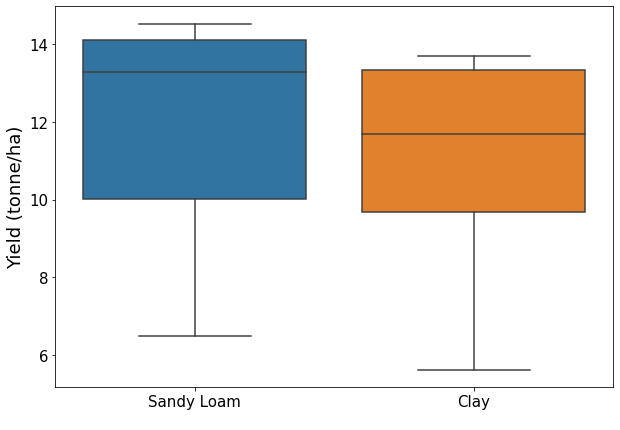

In [405]:
#create figure
fig,ax=plt.subplots(1,1,figsize=(10,7),)

# create box plot
sns.boxplot(data=all_outputs,x='label',y='Yield (tonne/ha)',ax=ax,)

# labels and font sizes
ax.tick_params(labelsize=15)
ax.set_xlabel(' ')
ax.set_ylabel('Yield (tonne/ha)',fontsize=18)

# Model different locations

In [517]:
InitWC = InitialWaterContent(value=['FC'])

In [713]:
net_irrigation = IrrigationManagement(irrigation_method=4,NetIrrSMT=70)

In [811]:
sugercane = Crop('SugarCane', planting_date='11/1', harvest_date='04/10',CGC=0.420,
                 CDC=0.226,
                 PlantPop=100000)

In [812]:
sugercane = Crop('SugarCane', planting_date='10/1', harvest_date='04/10')

In [813]:
sandy_loam = Soil(soil_type='SandyLoam')
clay_loam = Soil(soil_type='ClayLoam')

In [814]:
# combine into aquacrop model and specify start and end simulation date
model_a = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_data,
                      soil=clay_loam,
                      crop=sugercane,
                     initial_water_content=InitWC)
model_a.run_model(till_termination=True)

# combine into aquacrop model and specify start and end simulation date
model_bb = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_bb,
                      soil=clay_loam,
                      crop=sugercane,
                      initial_water_content=InitWC,
                        groundwater=GroundWater(water_table='Y',
                                       dates=[f'{2000}/10/01'],
                                       values=[1]),
                        irrigation_management=net_irrigation)
model_bb.run_model(till_termination=True)

# combine into aquacrop model and specify start and end simulation date
model_mh = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_mh,
                      soil=clay_loam,
                      crop=sugercane,
                      initial_water_content=InitWC,
                        irrigation_management=net_irrigation)
model_mh.run_model(till_termination=True)

# combine into aquacrop model and specify start and end simulation date
model_sm = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_sm,
                      soil=clay_loam,
                      crop=sugercane,
                      initial_water_content=InitWC,
                        irrigation_management=net_irrigation)
model_sm.run_model(till_termination=True)

True

In [815]:
names=['Big Bend','Mhlume','Simunye Mlaula', 'Grid Weather']

#combine our two output files
dflist=[model_bb._outputs.final_stats,
        model_mh._outputs.final_stats, model_sm._outputs.final_stats, 
        model_a._outputs.final_stats] 

outlist=[]
for i in range(len(dflist)): # go through our two output files
    temp = pd.DataFrame(dflist[i]['Yield (tonne/ha)']) # extract the seasonal yield data
    temp['label']=names[i] # add the soil type label
    outlist.append(temp) # save processed results

# combine results
all_outputs = pd.concat(outlist,axis=0)

Text(0, 0.5, 'Yield (tonne/ha)')

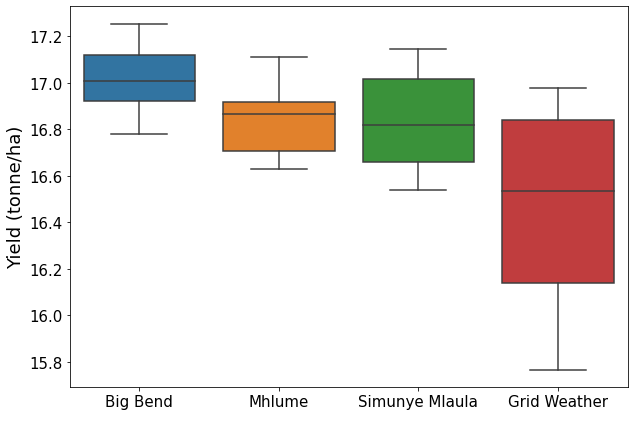

In [816]:
#create figure
fig,ax=plt.subplots(1,1,figsize=(10,7),)

# create box plot
sns.boxplot(data=all_outputs,x='label',y='Yield (tonne/ha)',ax=ax,)

# labels and font sizes
ax.tick_params(labelsize=15)
ax.set_xlabel(' ')
ax.set_ylabel('Yield (tonne/ha)',fontsize=18)

In [804]:
model_sm._outputs.final_stats.to_excel('MS.xlsx')

In [ ]:
## Initial Water
InitWC = InitialWaterContent(value=['FC'])

##Irrigation
net_irrigation = IrrigationManagement(irrigation_method=4,NetIrrSMT=70)

##Crop
sugercane = Crop('SugarCane', planting_date='11/1', harvest_date='04/10',CGC=0.420,
                 CDC=0.226,
                 PlantPop=100000)
##Management


##Groundwater




# combine into aquacrop model and specify start and end simulation date
model_a = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_data,
                      soil=clay_loam,
                      crop=sugercane,
                     initial_water_content=InitWC)
model_a.run_model(till_termination=True)

# combine into aquacrop model and specify start and end simulation date
model_bb = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_bb,
                      soil=clay_loam,
                      crop=sugercane,
                      initial_water_content=InitWC,
                        groundwater=GroundWater(water_table='Y',
                                       dates=[f'{2000}/10/01'],
                                       values=[1]),
                        irrigation_management=net_irrigation)
model_bb.run_model(till_termination=True)

# combine into aquacrop model and specify start and end simulation date
model_mh = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_mh,
                      soil=clay_loam,
                      crop=sugercane,
                      initial_water_content=InitWC,
                        irrigation_management=net_irrigation)
model_mh.run_model(till_termination=True)

# combine into aquacrop model and specify start and end simulation date
model_sm = AquaCropModel(sim_start_time=f'{2000}/01/31',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_sm,
                      soil=clay_loam,
                      crop=sugercane,
                      initial_water_content=InitWC,
                        irrigation_management=net_irrigation)
model_sm.run_model(till_termination=True)

# Custom soils

In [74]:
custom = Soil('custom',cn=46,rew=7)

In [75]:
custom.add_layer(thickness=custom.zSoil,thWP=0.24,
                 thFC=0.40,thS=0.50,Ksat=155,
                 penetrability=100)

In [76]:
custom = Soil('custom',cn=46,rew=7)
custom.add_layer_from_texture(thickness=custom.zSoil,
                              Sand=10,Clay=35,
                              OrgMat=2.5,penetrability=100)

In [77]:
custom.profile

,Comp,Layer,dz,dzsum,zBot,z_top,zMid,th_dry,th_wp,th_fc,th_s,Ksat,penetrability,tau
0,0,1.0,0.1,0.1,0.1,0.0,0.05,0.1075,0.215,0.382,0.511,136.4,100,0.48
1,1,1.0,0.1,0.2,0.2,0.1,0.15,0.1075,0.215,0.382,0.511,136.4,100,0.48
2,2,1.0,0.1,0.3,0.3,0.2,0.25,0.1075,0.215,0.382,0.511,136.4,100,0.48
3,3,1.0,0.1,0.4,0.4,0.3,0.35,0.1075,0.215,0.382,0.511,136.4,100,0.48
4,4,1.0,0.1,0.5,0.5,0.4,0.45,0.1075,0.215,0.382,0.511,136.4,100,0.48
5,5,1.0,0.1,0.6,0.6,0.5,0.55,0.1075,0.215,0.382,0.511,136.4,100,0.48
6,6,1.0,0.1,0.7,0.7,0.6,0.65,0.1075,0.215,0.382,0.511,136.4,100,0.48
7,7,1.0,0.1,0.8,0.8,0.7,0.75,0.1075,0.215,0.382,0.511,136.4,100,0.48
8,8,1.0,0.1,0.9,0.9,0.8,0.85,0.1075,0.215,0.382,0.511,136.4,100,0.48
9,9,1.0,0.1,1.0,1.0,0.9,0.95,0.1075,0.215,0.382,0.511,136.4,100,0.48


In [78]:
custom = Soil('custom',cn=46,rew=7)

custom.add_layer(thickness=0.3,thWP=0.24,
                 thFC=0.40,thS=0.50,Ksat=155,
                 penetrability=100)

custom.add_layer_from_texture(thickness=1.5,
                              Sand=10,Clay=35,
                              OrgMat=2.5,penetrability=100)

custom.profile

,Comp,Layer,dz,dzsum,zBot,z_top,zMid,th_dry,th_wp,th_fc,th_s,Ksat,penetrability,tau
0,0,1.0,0.1,0.1,0.1,0.0,0.05,0.1200,0.240,0.400,0.500,155.0,100.0,0.51
1,1,1.0,0.1,0.2,0.2,0.1,0.15,0.1200,0.240,0.400,0.500,155.0,100.0,0.51
2,2,1.0,0.1,0.3,0.3,0.2,0.25,0.1200,0.240,0.400,0.500,155.0,100.0,0.51
3,3,2.0,0.1,0.4,0.4,0.3,0.35,0.1075,0.215,0.382,0.511,136.4,100.0,0.48
4,4,2.0,0.1,0.5,0.5,0.4,0.45,0.1075,0.215,0.382,0.511,136.4,100.0,0.48
5,5,2.0,0.1,0.6,0.6,0.5,0.55,0.1075,0.215,0.382,0.511,136.4,100.0,0.48
6,6,2.0,0.1,0.7,0.7,0.6,0.65,0.1075,0.215,0.382,0.511,136.4,100.0,0.48
7,7,2.0,0.1,0.8,0.8,0.7,0.75,0.1075,0.215,0.382,0.511,136.4,100.0,0.48
8,8,2.0,0.1,0.9,0.9,0.8,0.85,0.1075,0.215,0.382,0.511,136.4,100.0,0.48
9,9,2.0,0.1,1.0,1.0,0.9,0.95,0.1075,0.215,0.382,0.511,136.4,100.0,0.48


# Groundwater

In [81]:
# constant groundwater depth of 2m
gw_model = AquaCropModel(sim_start_time=f'{1995}/10/01',
                      sim_end_time=f'{2014}/01/01',
                      weather_df=weather_data,
                      soil=sandy_loam,
                      crop=wheat,
                      initial_water_content=InitWC,            
                      groundwater=GroundWater(water_table='Y',
                                       dates=[f'{1995}/10/01'],
                                       values=[2])
                    )

In [82]:
gw_model.run_model(till_termination=True)

True

In [83]:
gw_model._outputs.final_stats

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Yield (tonne/ha),Seasonal irrigation (mm)
0,0,Maize,1996-02-10,131,13.848702,0
1,1,Maize,1997-02-10,497,14.265383,0
2,2,Maize,1998-02-10,862,14.290760,0
3,3,Maize,1999-02-10,1227,14.179298,0
4,4,Maize,2000-02-10,1592,14.421791,0
5,5,Maize,2001-02-10,1958,14.339423,0
6,6,Maize,2002-02-10,2323,14.306611,0
7,7,Maize,2003-02-10,2688,14.473195,0
8,8,Maize,2004-02-10,3053,14.317730,0
9,9,Maize,2005-02-10,3419,14.510294,0


In [84]:
# model._outputs.water_flux.head()
# model._outputs.water_storage.head()
# model._outputs.crop_growth.head()
model._outputs.final_stats.head()

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Yield (tonne/ha),Seasonal irrigation (mm)
0,0,Maize,1996-02-10,131,13.688820,0
1,1,Maize,1997-02-10,497,14.279829,0
2,2,Maize,1998-02-10,862,14.284479,0
3,3,Maize,1999-02-10,1227,13.711132,0
4,4,Maize,2000-02-10,1592,14.434245,0


# Climate

In [320]:
variables = [
    ("2m_temperature","24_hour_minimum"),
    ("2m_temperature","24_hour_maximum"),
    ("precipitation_flux","daily"),
    ("solar_radiation_flux", "daily"),
    ("vapour_pressure", "24_hour_mean"),
    ("10m_wind_speed", "24_hour_mean")]

selected_area = "SADC"

for variable in variables:      
    files = glob.glob(os.path.join('Data','Climate','2_aggregate','*{}_{}_{}*'.format(selected_area,variable[0],variable[1])))
    df = xr.open_mfdataset(files, parallel=True, engine="netcdf4", decode_times=True, chunks={'time': 1000},
                       data_vars='minimal', coords='minimal', compat='override')
    if not os.path.exists('Data/Climate/3_combined'):
        os.makedirs('Data/Climate/3_combined')
    print('Writing {}'.format(variable))
    df.to_netcdf('Data/Climate/3_combined/AgERA5_{}_{}_{}.nc'.format(selected_area,variable[0],variable[1]), mode='w')
    df.close()
    print('Finished writing {}'.format(variable))

Writing ('2m_temperature', '24_hour_minimum')
Finished writing ('2m_temperature', '24_hour_minimum')
Writing ('2m_temperature', '24_hour_maximum')
Finished writing ('2m_temperature', '24_hour_maximum')
Writing ('precipitation_flux', 'daily')
Finished writing ('precipitation_flux', 'daily')
Writing ('solar_radiation_flux', 'daily')
Finished writing ('solar_radiation_flux', 'daily')
Writing ('vapour_pressure', '24_hour_mean')
Finished writing ('vapour_pressure', '24_hour_mean')
Writing ('10m_wind_speed', '24_hour_mean')
Finished writing ('10m_wind_speed', '24_hour_mean')
